#  Client Project: No-Churn Telecom
#  Category: Telecom – Churn Rate ML
#  Project Ref: PM-PR-0017

Here is an explanation of each column in the dataset you shared:

1. **State**: The state where the customer is located (e.g., KS, OH, NJ).
2. **Account Length**: Number of months the customer has had an account with the company.
3. **Area Code**: The area code for the customer’s phone number.
4. **Phone**: The customer's phone number.
5. **International Plan**: Indicates whether the customer is subscribed to the international calling plan (yes/no).
6. **VMail Plan**: Indicates whether the customer has a voice mail plan (yes/no).
7. **VMail Message**: Number of voice mail messages the customer has.
8. **Day Mins**: Total minutes the customer spent on calls during the day.
9. **Day Calls**: Number of calls made by the customer during the day.
10. **Day Charge**: Total charge for calls made during the day (likely based on minutes).
11. **Eve Mins**: Total minutes the customer spent on calls in the evening.
12. **Eve Calls**: Number of calls made by the customer in the evening.
13. **Eve Charge**: Total charge for calls made in the evening.
14. **Night Mins**: Total minutes the customer spent on calls at night.
15. **Night Calls**: Number of calls made by the customer at night.
16. **Night Charge**: Total charge for calls made at night.
17. **International Mins**: Total minutes the customer spent on international calls.
18. **International Calls**: Number of international calls made by the customer.
19. **International Charge**: Total charge for international calls.
20. **CustServ Calls**: Number of calls made by the customer to customer service.
21. **Churn**: Indicates whether the customer has left the company (True = Yes, False = No).

This dataset seems to provide information for churn analysis, where "Churn" indicates whether a customer has stopped using the service. Other columns describe various aspects of the customer's phone usage and service plans.

To calculate the number of calls per day using the **Day Charge**, we need to know the cost per minute (rate). Here’s how you can estimate the number of calls per day if the rate is known:

### Formula:
\[ \text{Day Mins} = \frac{\text{Day Charge}}{\text{Rate per Minute}} \]
Once you have the **Day Mins**, you can use the **Day Calls** data to calculate an average number of calls.

If you want to reverse this and estimate the number of calls based on the **Day Charge**, you would first need the following:

1. **Day Charge**: The total charge for calls during the day.
2. **Rate per Minute**: The cost per minute for the calls.

To summarize:
1. First calculate the total **Day Mins** using the above formula.
2. If **Day Mins** and **Day Calls** are available, you can find the average duration per call:
   \[ \text{Average Duration per Call} = \frac{\text{Day Mins}}{\text{Day Calls}} \]

This will help in estimating the number of calls based on available charge information.

Do you have the rate per minute for the calls? If so, I can help you with the calculations.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.impute import KNNImputer

from sklearn.preprocessing import MinMaxScaler,StandardScaler

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,BaggingClassifier,ExtraTreesClassifier

from sklearn.metrics import f1_score,accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

from xgboost import XGBClassifier
from sklearn.svm import SVC


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
data=pd.read_csv('average profit in each sub category.csv')

In [3]:
data.head()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [4]:
data.columns

Index(['State', 'Account Length', 'Area Code', 'Phone', 'International Plan',
       'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'International Mins', 'International Calls',
       'International Charge', 'CustServ Calls', 'Churn'],
      dtype='object')

In [5]:
data.shape

(4617, 21)

In [6]:
data.size

96957

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account Length        4617 non-null   int64  
 2   Area Code             4617 non-null   int64  
 3   Phone                 4617 non-null   object 
 4   International Plan    4617 non-null   object 
 5   VMail Plan            4617 non-null   object 
 6   VMail Message         4617 non-null   int64  
 7   Day Mins              4617 non-null   float64
 8   Day Calls             4617 non-null   int64  
 9   Day Charge            4617 non-null   float64
 10  Eve Mins              4617 non-null   float64
 11  Eve Calls             4617 non-null   int64  
 12  Eve Charge            4617 non-null   float64
 13  Night Mins            4617 non-null   float64
 14  Night Calls           4617 non-null   int64  
 15  Night Charge         

In [8]:
pd.set_option('display.max_columns',None)
data.head()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [9]:
pd.set_option('display.max_columns',None)
data.tail()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4612,NY,57,510,345-7512,no,yes,25,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.
4613,NM,177,408,343-6820,no,yes,29,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.80,126.8,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [10]:
pd.set_option('display.max_columns',None)
data.sample()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
492,ME,92,415,376-8573,yes,no,0,130.7,113,22.22,260.6,122,22.15,244.2,98,10.99,9.4,2,2.54,2,True.


In [11]:
data.describe()

,Account Length,Area Code,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [12]:
data.describe(include='O')

,State,Phone,International Plan,VMail Plan,Churn
count,4617,4617,4617,4617,4617
unique,51,4617,2,2,2
top,WV,382-4657,no,no,False.
freq,149,1,4171,3381,3961


In [13]:
data.isnull().sum()

State                   0
Account Length          0
Area Code               0
Phone                   0
International Plan      0
VMail Plan              0
VMail Message           0
Day Mins                0
Day Calls               0
Day Charge              0
Eve Mins                0
Eve Calls               0
Eve Charge              0
Night Mins              0
Night Calls             0
Night Charge            0
International Mins      0
International Calls     0
International Charge    0
CustServ Calls          0
Churn                   0
dtype: int64

* Tele Churn datasets zero null values.

In [14]:
data.duplicated().sum()
## In this datasets zero duplicated values.

0

# Expolatory Data Analysis:

#### In this datasets Min() and Max() Columns :

In [15]:
data.min()

State                          AK
Account Length                  1
Area Code                     408
Phone                    327-1058
International Plan             no
VMail Plan                     no
VMail Message                   0
Day Mins                      0.0
Day Calls                       0
Day Charge                    0.0
Eve Mins                      0.0
Eve Calls                       0
Eve Charge                    0.0
Night Mins                   23.2
Night Calls                    12
Night Charge                 1.04
International Mins            0.0
International Calls             0
International Charge          0.0
CustServ Calls                  0
Churn                      False.
dtype: object

In [16]:
data.max()

State                          WY
Account Length                243
Area Code                     510
Phone                    422-9964
International Plan            yes
VMail Plan                    yes
VMail Message                  51
Day Mins                    351.5
Day Calls                     165
Day Charge                  59.76
Eve Mins                    363.7
Eve Calls                     170
Eve Charge                  30.91
Night Mins                  395.0
Night Calls                   175
Night Charge                17.77
International Mins           20.0
International Calls            20
International Charge          5.4
CustServ Calls                  9
Churn                       True.
dtype: object

In [17]:
type(data)

pandas.core.frame.DataFrame

In [18]:
data.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

In [19]:
data['State'].value_counts()

State
WV    149
AL    114
MN    112
OH    110
ID    110
VA    109
NY    109
OR    107
NJ    106
WY    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
MS     91
NH     91
CO     91
KY     90
RI     90
NV     89
IN     89
DE     89
WA     89
FL     85
NM     84
MO     84
SC     83
NC     83
TN     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
AR     77
GA     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: count, dtype: int64

In [20]:
data['Account Length'].unique()

array([128, 107, 137,  84,  75, 118, 121, 147, 117, 141,  65,  74, 168,
        95,  62, 161,  85,  93,  76,  73,  77, 130, 111, 132, 174,  57,
        54,  20,  49, 142, 172,  12,  72,  36,  78, 136, 149,  98, 135,
        34, 160,  64,  59, 119,  97,  52,  60,  10,  96,  87,  81,  68,
       125, 116,  38,  40,  43, 113, 126, 150, 138, 162,  90,  50,  82,
       144,  46,  70,  55, 106,  94, 155,  80, 104,  99, 120, 108, 122,
       157, 103,  63, 112,  41, 193,  61,  92, 131, 163,  91, 127, 110,
       140,  83, 145,  56, 151, 139,   6, 115, 146, 185, 148,  32,  25,
       179,  67,  19, 170, 164,  51, 208,  53, 105,  66,  86,  35,  88,
       123,  45, 100, 215,  22,  33, 114,  24, 101, 143,  48,  71, 167,
        89, 199, 166, 158, 196, 209,  16,  39, 173, 129,  44,  79,  31,
       124,  37, 159, 194, 154,  21, 133, 224,  58,  11, 109, 102, 165,
        18,  30, 176,  47, 190, 152,  26,  69, 186, 171,  28, 153, 169,
        13,  27,   3,  42, 189, 156, 134, 243,  23,   1, 205, 20

In [21]:
data['Area Code'].unique()

array([415, 408, 510], dtype=int64)

In [22]:
data['Area Code'].value_counts()

Area Code
415    2299
408    1161
510    1157
Name: count, dtype: int64

In [23]:
data.columns

Index(['State', 'Account Length', 'Area Code', 'Phone', 'International Plan',
       'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'International Mins', 'International Calls',
       'International Charge', 'CustServ Calls', 'Churn'],
      dtype='object')

In [24]:
data.Phone.unique()

array([' 382-4657', ' 371-7191', ' 358-1921', ..., ' 338-4794',
       ' 355-8388', ' 409-6884'], dtype=object)

In [25]:
data['VMail Plan'].unique()

array([' yes', ' no'], dtype=object)

In [26]:
data['VMail Plan'].value_counts()

VMail Plan
no     3381
yes    1236
Name: count, dtype: int64

In [27]:
data['VMail Message'].unique()

array([25, 26,  0, 24, 37, 27, 33, 39, 30, 41, 28, 34, 46, 29, 35, 21, 32,
       42, 36, 22, 23, 43, 31, 38, 40, 48, 18, 17, 45, 16, 20, 14, 19, 51,
       15, 11, 12, 47,  8, 44, 49,  4, 10, 13, 50,  9,  6], dtype=int64)

In [28]:
data.Churn.unique()

array([' False.', ' True.'], dtype=object)

In [29]:
data.Churn.value_counts()

Churn
False.    3961
True.      656
Name: count, dtype: int64

In [30]:
data['CustServ Calls'].unique()

array([1, 0, 2, 3, 4, 5, 7, 9, 6, 8], dtype=int64)

In [31]:
data.loc[(data['CustServ Calls']==0) & (data['Churn']==' True.') & (data['International Plan']==' yes') & (data['VMail Plan']==' yes')]
## Zero Customer calls and Churn Disconnected the network and International plan and Voice Mail Plan is activated.

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
41,MD,135,408,383-6029,yes,yes,41,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,14.6,15,3.94,0,True.
115,ME,36,510,363-1069,yes,yes,42,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,20.0,6,5.40,0,True.
514,AL,60,408,411-7778,yes,yes,29,265.9,113,45.20,215.8,94,18.34,108.1,82,4.86,14.0,12,3.78,0,True.
626,NJ,95,408,348-8015,yes,yes,37,220.2,109,37.43,185.3,99,15.75,205.1,82,9.23,4.1,2,1.11,0,True.
1435,IL,89,415,380-4080,yes,yes,19,112.6,114,19.14,261.7,132,22.24,123.5,116,5.56,11.1,2,3.00,0,True.
1467,DE,67,415,413-7743,yes,yes,35,181.1,59,30.79,215.9,116,18.35,216.3,106,9.73,16.9,4,4.56,0,True.
1861,MA,119,408,417-3999,yes,yes,16,147.2,103,25.02,160.1,96,13.61,184.0,120,8.28,7.7,2,2.08,0,True.
1887,OK,105,510,405-4109,yes,yes,28,156.1,89,26.54,107.1,114,9.10,167.7,95,7.55,14.7,3,3.97,0,True.
2106,GA,128,408,355-2634,yes,yes,18,222.1,89,37.76,160.6,109,13.65,218.8,102,9.85,13.6,2,3.67,0,True.
2735,TX,90,415,355-9366,yes,yes,26,169.0,104,28.73,188.8,104,16.05,213.3,76,9.60,13.3,3,3.59,0,True.


In [32]:
data.loc[(data['CustServ Calls']==0) & (data['Churn']==' True.') & (data['International Plan']==' no') & (data['VMail Plan']==' no')]
## Zero Customer calls and Churn Disconnected the network and International plan and Voice Mail Plan is de-activated.

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
76,DC,82,415,374-5353,no,no,0,300.3,109,51.05,181.0,100,15.39,270.1,73,12.15,11.7,4,3.16,0,True.
91,LA,155,415,334-1275,no,no,0,203.4,100,34.58,190.9,104,16.23,196.0,119,8.82,8.9,4,2.40,0,True.
156,OH,83,415,370-9116,no,no,0,337.4,120,57.36,227.4,116,19.33,153.9,114,6.93,15.8,7,4.27,0,True.
244,VA,108,408,335-1697,no,no,0,198.5,99,33.75,267.8,60,22.76,354.9,75,15.97,9.4,3,2.54,0,True.
302,RI,121,408,329-7347,no,no,0,170.4,108,28.97,350.5,68,29.79,297.0,87,13.37,11.2,3,3.02,0,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4210,AZ,102,510,375-8584,no,no,0,171.6,116,29.17,219.4,111,18.65,242.1,85,10.89,12.1,4,3.27,0,True.
4228,CO,141,408,407-1461,no,no,0,264.3,90,44.93,216.4,101,18.39,208.8,72,9.40,9.6,3,2.59,0,True.
4330,KY,76,510,345-1157,no,no,0,293.8,94,49.95,169.6,62,14.42,160.4,103,7.22,13.7,9,3.70,0,True.
4411,VT,100,510,367-3275,no,no,0,254.2,97,43.21,262.0,88,22.27,256.3,82,11.53,13.6,6,3.67,0,True.


In [33]:
data.loc[(data['Churn']==' True.') & (data['International Plan']==' no') & (data['VMail Plan']==' no')]
## Churn Disconnected the network and International plan and Voice Mail Plan is de-activated.

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
10,IN,65,415,329-6603,no,no,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True.
15,NY,161,415,351-7269,no,no,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True.
21,CO,77,408,393-7984,no,no,0,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5.7,6,1.54,5,True.
33,AZ,12,408,360-1596,no,no,0,249.6,118,42.43,252.4,119,21.45,280.2,90,12.61,11.8,3,3.19,1,True.
48,ID,119,415,398-1294,no,no,0,159.1,114,27.05,231.3,117,19.66,143.2,91,6.44,8.8,3,2.38,5,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4513,IA,121,415,398-8927,no,no,0,273.8,96,46.55,263.1,106,22.36,201.5,83,9.07,10.8,3,2.92,1,True.
4562,NM,42,415,389-2130,no,no,0,137.9,160,23.44,234.9,107,19.97,166.6,70,7.50,14.3,3,3.86,5,True.
4568,NJ,124,415,338-5344,no,no,0,108.2,92,18.39,214.3,83,18.22,185.5,155,8.35,13.2,11,3.56,4,True.
4576,WV,131,510,350-7785,no,no,0,256.6,96,43.62,225.2,113,19.14,190.2,91,8.56,11.1,3,3.00,1,True.


In [34]:
data.loc[(data['Area Code']==415) & (data['Churn']==' True.')]
## Which Area Code mostly dis-connected the Churn(True) and State wise

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
10,IN,65,415,329-6603,no,no,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True.
15,NY,161,415,351-7269,no,no,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True.
48,ID,119,415,398-1294,no,no,0,159.1,114,27.05,231.3,117,19.66,143.2,91,6.44,8.8,3,2.38,5,True.
54,WY,87,415,353-3759,no,no,0,151.0,83,25.67,219.7,116,18.67,203.9,127,9.18,9.7,3,2.62,5,True.
76,DC,82,415,374-5353,no,no,0,300.3,109,51.05,181.0,100,15.39,270.1,73,12.15,11.7,4,3.16,0,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4537,OR,100,415,388-6108,no,yes,31,67.7,67,11.51,147.1,116,12.50,288.3,103,12.97,12.3,2,3.32,6,True.
4562,NM,42,415,389-2130,no,no,0,137.9,160,23.44,234.9,107,19.97,166.6,70,7.50,14.3,3,3.86,5,True.
4568,NJ,124,415,338-5344,no,no,0,108.2,92,18.39,214.3,83,18.22,185.5,155,8.35,13.2,11,3.56,4,True.
4577,KS,158,415,347-1864,yes,no,0,200.0,98,34.00,205.4,106,17.46,323.7,96,14.57,8.9,2,2.40,0,True.


In [35]:
data.loc[(data['Area Code']==408) & (data['Churn']==' True.')]
## Which Area Code mostly dis-connected the Churn(True) and State wise

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
21,CO,77,408,393-7984,no,no,0,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5.7,6,1.54,5,True.
33,AZ,12,408,360-1596,no,no,0,249.6,118,42.43,252.4,119,21.45,280.2,90,12.61,11.8,3,3.19,1,True.
41,MD,135,408,383-6029,yes,yes,41,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,14.6,15,3.94,0,True.
57,CO,121,408,370-7574,no,yes,30,198.4,129,33.73,75.3,77,6.40,181.2,77,8.15,5.8,3,1.57,3,True.
77,NY,144,408,360-1171,no,no,0,61.6,117,10.47,77.1,85,6.55,173.0,99,7.79,8.2,7,2.21,4,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4421,IA,67,408,340-6397,no,no,0,177.4,102,30.16,215.2,123,18.29,132.4,120,5.96,6.6,4,1.78,4,True.
4465,MD,116,408,342-7953,no,no,0,254.6,107,43.28,249.4,89,21.20,229.6,77,10.33,9.0,18,2.43,2,True.
4492,NM,136,408,394-2576,no,no,0,276.3,94,46.97,226.0,125,19.21,221.4,87,9.96,7.2,1,1.94,1,True.
4597,OR,65,408,393-8963,yes,no,0,54.8,74,9.32,239.8,93,20.38,214.4,91,9.65,13.4,5,3.62,1,True.


In [36]:
data.loc[(data['Area Code']==510) & (data['Churn']==' True.')]
## Which Area Code mostly dis-connected the Churn(True) and State wise

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
69,TX,150,510,374-8042,no,no,0,178.9,101,30.41,169.1,110,14.37,148.6,100,6.69,13.8,3,3.73,4,True.
84,TX,106,510,395-3026,no,no,0,210.6,96,35.80,249.2,85,21.18,191.4,88,8.61,12.4,1,3.35,2,True.
115,ME,36,510,363-1069,yes,yes,42,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,20.0,6,5.40,0,True.
127,MS,61,510,414-8718,no,yes,27,187.5,124,31.88,146.6,103,12.46,225.7,129,10.16,6.4,6,1.73,4,True.
197,TX,208,510,378-3625,no,no,0,326.5,67,55.51,176.3,113,14.99,181.7,102,8.18,10.7,6,2.89,2,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4404,OH,95,510,372-6246,no,yes,24,129.4,120,22.00,159.8,68,13.58,214.4,83,9.65,12.6,4,3.40,4,True.
4411,VT,100,510,367-3275,no,no,0,254.2,97,43.21,262.0,88,22.27,256.3,82,11.53,13.6,6,3.67,0,True.
4471,HI,47,510,376-9305,yes,no,0,135.0,108,22.95,176.3,111,14.99,144.6,96,6.51,10.5,1,2.84,1,True.
4572,MD,80,510,387-2084,yes,no,0,275.4,89,46.82,186.7,66,15.87,201.3,87,9.06,9.4,2,2.54,0,True.


In [37]:
data['Area Code'].unique()

array([415, 408, 510], dtype=int64)

## Insights :
* Area Code - 415 and a no.of 318 Churn True.
* Area Code - 408 and a no.of 165 Churn True.
* Area Code - 510 and a no.of 173 Churn True.
* The Majority of Customers dis-connect network from 415 area code in this datasets.

In [38]:
pd.set_option('display.max_columns',None)
data.loc[(data['Area Code']==415)& (data['State']==data['State'].max()) & (data['Churn']==' True.')]
## Now will check which state is high dis-connected from Area Code-415.

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
54,WY,87,415,353-3759,no,no,0,151.0,83,25.67,219.7,116,18.67,203.9,127,9.18,9.7,3,2.62,5,True.
1018,WY,76,415,408-6326,no,no,0,263.4,148,44.78,230.3,69,19.58,170.6,101,7.68,11.4,5,3.08,1,True.
1136,WY,106,415,338-6018,yes,yes,26,270.3,111,45.95,215.2,90,18.29,254.0,133,11.43,14.4,7,3.89,1,True.
2819,WY,159,415,391-2159,no,no,0,167.4,68,28.46,143.8,74,12.22,140.1,111,6.30,10.3,3,2.78,0,True.
2952,WY,123,415,387-1116,no,no,0,242.2,87,41.17,226.1,101,19.22,268.6,121,12.09,8.2,3,2.21,5,True.


## Insights :
* The Area Code 415,This states are particularly high dis-connected from the WY state and
* because Day charge is high rate comparetively False Churn.

In [39]:
pd.set_option('display.max_columns',None)
data.loc[(data['Area Code']==415)& (data['State']==data['State'].min()) & (data['Churn']==' True.')]
## The Area Code 415,This state particularly low dis-connected from the AK state.


,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
181,AK,126,415,372-3750,no,no,0,58.2,94,9.89,138.7,118,11.79,136.8,91,6.16,11.9,1,3.21,5,True.
550,AK,111,415,364-7719,no,no,0,172.8,58,29.38,183.1,108,15.56,158.8,104,7.15,7.9,3,2.13,4,True.
3241,AK,177,415,384-6132,yes,no,0,248.7,118,42.28,172.3,73,14.65,191.9,87,8.64,11.3,2,3.05,1,True.
4171,AK,36,415,399-1526,yes,yes,19,171.9,96,29.22,198.4,111,16.86,321.7,76,14.48,10.5,1,2.84,1,True.


In [40]:
pd.set_option('display.max_columns',None)
data.loc[(data['Area Code']== 415)& (data['State']==data['State'].max()) & (data['Churn']==' False.')]
## Churn is False and Area Code 415 and which state is high False condition.

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
49,WY,97,415,405-7146,no,yes,24,133.2,135,22.64,217.2,58,18.46,70.6,79,3.18,11.0,3,2.97,1,False.
66,WY,43,415,329-9847,yes,no,0,251.5,105,42.76,212.8,104,18.09,157.8,67,7.10,9.3,4,2.51,0,False.
273,WY,139,415,337-7501,no,no,0,192.8,104,32.78,234.4,96,19.92,203.2,101,9.14,13.0,3,3.51,3,False.
321,WY,114,415,403-7775,no,yes,32,125.2,79,21.28,177.8,105,15.11,232.4,89,10.46,12.9,3,3.48,1,False.
608,WY,28,415,392-6856,no,no,0,187.8,94,31.93,248.6,86,21.13,208.8,124,9.40,10.6,5,2.86,0,False.
609,WY,111,415,371-5556,no,no,0,146.2,55,24.85,261.5,83,22.23,163.2,116,7.34,8.7,3,2.35,3,False.
653,WY,87,415,341-9443,no,yes,22,263.8,65,44.85,103.4,115,8.79,208.1,109,9.36,8.5,3,2.30,3,False.
668,WY,171,415,358-8025,no,no,0,231.2,135,39.30,188.7,74,16.04,206.9,124,9.31,12.3,1,3.32,1,False.
731,WY,90,415,416-2825,no,no,0,207.2,121,35.22,292.5,104,24.86,226.3,103,10.18,8.0,1,2.16,2,False.
756,WY,33,415,331-3202,no,no,0,213.9,88,36.36,239.8,119,20.38,148.7,71,6.69,9.8,14,2.65,2,False.


## Insights :
* The Area Code 415,This states are particularly low dis-connected from the WY state and
* So WY States are high Churn True and low Churn False of Area Code - 415.

In [41]:
pd.set_option('display.max_columns',None)
data.loc[(data['Area Code']== 510)& (data['State']==data['State'].max()) & (data['Churn']==' False.')]


,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
188,WY,164,510,373-4819,no,no,0,160.6,111,27.30,163.2,126,13.87,187.1,112,8.42,9.0,3,2.43,1,False.
238,WY,215,510,393-9619,no,no,0,83.6,148,14.21,120.9,91,10.28,226.6,110,10.20,10.7,9,2.89,0,False.
438,WY,113,510,352-6573,no,no,0,155.0,93,26.35,330.6,106,28.10,189.4,123,8.52,13.5,3,3.65,1,False.
711,WY,129,510,379-3132,no,no,0,143.7,114,24.43,297.8,98,25.31,212.6,86,9.57,11.4,8,3.08,4,False.
1108,WY,151,510,381-4712,no,no,0,235.9,104,40.10,80.6,91,6.85,212.8,116,9.58,5.8,2,1.57,3,False.
1422,WY,107,510,411-5740,no,yes,31,160.3,45,27.25,221.5,70,18.83,261.6,109,11.77,5.6,1,1.51,1,False.
1628,WY,131,510,408-9779,no,no,0,110.9,74,18.85,115.6,90,9.83,190.5,114,8.57,15.8,9,4.27,1,False.
1832,WY,68,510,398-4538,no,no,0,195.4,116,33.22,212.1,101,18.03,138.4,134,6.23,15.1,11,4.08,1,False.
2178,WY,80,510,400-5389,no,no,0,101.1,121,17.19,263.2,110,22.37,137.7,74,6.20,7.3,5,1.97,0,False.
2392,WY,90,510,400-8069,no,no,0,125.4,158,21.32,269.1,83,22.87,238.6,103,10.74,11.0,7,2.97,1,False.


## Insights :
* The Area Code 510,This states are particularly low Churn False from the WY state.

In [42]:
data['CustServ Calls'].value_counts()

CustServ Calls
1    1651
2    1031
0     951
3     616
4     234
5      89
6      28
7      13
9       2
8       2
Name: count, dtype: int64

In [43]:
data['Day Charge'].unique()

array([45.07, 27.47, 41.38, ..., 34.09, 47.28, 21.68])

In [44]:
data['Eve Charge'].unique()

array([16.78, 16.62, 10.3 , ..., 14.46, 18.15, 25.17])

In [45]:
data['Night Charge'].unique()

array([11.01, 11.45,  7.32, ..., 14.57,  4.78,  5.6 ])

In [46]:
data['Night Charge'].value_counts()

Night Charge
9.66     19
8.47     18
10.80    17
8.15     17
9.40     16
         ..
15.56     1
12.32     1
13.29     1
4.92      1
5.60      1
Name: count, Length: 1012, dtype: int64

In [47]:
data['International Charge'].unique()

array([2.7 , 3.7 , 3.29, 1.78, 2.73, 1.7 , 2.03, 1.92, 2.35, 3.02, 3.43,
       2.46, 3.32, 3.54, 1.46, 3.73, 2.19, 3.51, 2.86, 1.54, 2.57, 2.08,
       2.78, 4.19, 3.97, 3.  , 3.83, 3.4 , 3.19, 2.24, 3.92, 2.84, 2.54,
       3.94, 2.48, 0.95, 2.3 , 3.56, 2.  , 2.38, 2.97, 2.11, 1.84, 3.08,
       2.51, 2.62, 2.75, 2.16, 1.57, 3.27, 3.24, 3.13, 2.21, 1.67, 1.97,
       1.65, 3.16, 4.05, 2.65, 3.35, 2.32, 2.94, 3.75, 2.4 , 2.13, 1.43,
       1.19, 3.38, 3.05, 2.43, 2.59, 3.59, 5.4 , 1.94, 1.73, 3.81, 3.86,
       1.86, 3.11, 4.27, 3.46, 4.37, 0.  , 3.21, 2.67, 2.27, 2.92, 3.62,
       2.89, 4.75, 1.27, 0.73, 3.65, 3.48, 3.89, 2.81, 1.81, 4.16, 1.22,
       1.76, 4.21, 1.59, 5.1 , 2.05, 1.35, 1.89, 3.78, 4.86, 4.32, 4.  ,
       1.  , 0.54, 1.3 , 4.13, 1.62, 3.67, 4.64, 4.73, 1.51, 4.91, 0.97,
       4.46, 1.24, 1.38, 1.11, 4.4 , 4.02, 4.43, 4.51, 0.35, 4.1 , 4.08,
       4.29, 1.49, 4.35, 1.08, 4.56, 1.4 , 1.13, 4.24, 4.59, 1.05, 1.03,
       0.59, 4.62, 1.32, 4.83, 4.67, 4.97, 4.81, 1.

In [48]:
data['International Charge'].value_counts()

International Charge
2.65    81
3.00    81
2.70    77
3.05    77
2.73    75
        ..
4.83     1
4.62     1
0.35     1
0.73     1
5.32     1
Name: count, Length: 168, dtype: int64

In [49]:
data['Day Charge'].max()

59.76

In [50]:
data.loc[data['Day Charge']==data['Day Charge'].max()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3993,NJ,112,408,406-2551,no,no,0,351.5,95,59.76,206.8,108,17.58,275.8,146,12.41,11.9,4,3.21,1,True.


In [51]:
data.loc[data['Day Charge']==data['Day Charge'].min()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1345,SD,98,415,392-2555,no,no,0,0.0,0,0.0,159.6,130,13.57,167.1,88,7.52,6.8,1,1.84,4,True.
1397,VT,101,510,413-7655,no,no,0,0.0,0,0.0,192.1,119,16.33,168.8,95,7.60,7.2,4,1.94,1,False.


In [52]:
data.loc[data['Eve Charge']==data['Eve Charge'].max()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2732,NC,130,408,384-4938,yes,no,0,216.2,106,36.75,363.7,86,30.91,126.7,123,5.7,16.9,2,4.56,5,True.


In [53]:
data.loc[data['Eve Charge']==data['Eve Charge'].min()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2932,UT,97,415,418-3181,no,no,0,209.2,134,35.56,0.0,0,0.0,175.4,94,7.89,11.8,6,3.19,1,False.


In [54]:
data.loc[data['Night Charge']==data['Night Charge'].max()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2663,VA,172,510,408-2089,no,no,0,169.8,123,28.87,183.1,94,15.56,395.0,72,17.77,12.7,7,3.43,2,False.


In [55]:
data.loc[data['Night Charge']==data['Night Charge'].min()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1260,AK,76,415,366-9781,no,yes,22,160.1,107,27.22,168.7,136,14.34,23.2,102,1.04,9.5,4,2.57,3,False.


In [56]:
data.loc[data['International Charge']==data['International Charge'].max()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
115,ME,36,510,363-1069,yes,yes,42,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,20.0,6,5.4,0,True.


In [57]:
data.loc[data['International Charge']==data['International Charge'].min()]

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
179,KS,70,408,411-4582,no,no,0,232.1,122,39.46,292.3,112,24.85,201.2,112,9.05,0.0,0,0.0,3,False.
343,IN,98,408,376-4300,no,yes,21,64.6,98,10.98,176.1,86,14.97,244.8,84,11.02,0.0,0,0.0,2,False.
488,VT,165,510,345-1998,no,no,0,242.9,126,41.29,209.8,65,17.83,228.4,126,10.28,0.0,0,0.0,1,False.
595,HI,87,408,360-2690,no,yes,28,151.4,95,25.74,152.4,97,12.95,250.1,109,11.25,0.0,0,0.0,1,False.
712,MO,106,415,340-9910,no,no,0,114.4,104,19.45,78.3,101,6.66,232.7,78,10.47,0.0,0,0.0,2,False.
878,WI,62,415,383-6373,no,no,0,281.0,66,47.77,160.6,108,13.65,77.9,74,3.51,0.0,0,0.0,1,False.
1028,KS,70,415,369-9465,no,no,0,222.8,114,37.88,215.9,113,18.35,223.5,122,10.06,0.0,0,0.0,1,False.
1080,OH,114,415,363-2602,no,no,0,191.5,88,32.56,175.2,78,14.89,220.3,118,9.91,0.0,0,0.0,0,False.
1400,VA,115,415,367-3971,no,no,0,132.0,90,22.44,197.5,75,16.79,175.8,114,7.91,0.0,0,0.0,3,False.
1564,VT,137,510,348-9145,no,no,0,97.5,95,16.58,195.8,82,16.64,288.8,78,13.00,0.0,0,0.0,1,False.


In [58]:
data['International Plan'].value_counts()

International Plan
no     4171
yes     446
Name: count, dtype: int64

In [59]:
data.loc[data['International Plan']=='yes']

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn


In [60]:
data.loc[data['VMail Plan']=='yes']

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn


In [61]:
data.loc[data['VMail Plan']==' no'].sample()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4178,DC,86,408,387-5618,no,no,0,178.3,94,30.31,264.4,74,22.47,284.6,109,12.81,15.0,2,4.05,0,False.


In [62]:
data.loc[data['VMail Plan']==' yes'].sample()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3303,WI,114,415,373-7308,no,yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False.


In [63]:
data.loc[data['International Plan']==' no'].sample()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3001,IL,117,408,373-9108,no,no,0,119.0,82,20.23,187.5,108,15.94,189.3,97,8.52,11.5,3,3.11,1,False.


In [64]:
data.loc[data['International Plan']==' yes'].sample()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3291,MI,119,510,335-7324,yes,yes,22,172.1,119,29.26,223.6,133,19.01,150.0,94,6.75,13.9,20,3.75,1,True.


In [65]:
data.loc[data['International Plan']==' yes'].sample(5)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3916,CT,68,510,373-8655,yes,no,0,197.7,99,33.61,188.8,106,16.05,254.6,80,11.46,19.2,4,5.18,3,True.
1837,NH,117,510,397-1766,yes,no,0,54.2,100,9.21,303.2,84,25.77,171.8,84,7.73,8.6,2,2.32,1,True.
9,WV,141,415,330-8173,yes,yes,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False.
613,NV,105,415,380-7742,yes,yes,29,220.7,82,37.52,217.7,110,18.50,190.5,100,8.57,13.2,6,3.56,1,True.
781,WV,112,415,330-2693,yes,no,0,161.9,138,27.52,200.9,114,17.08,134.0,134,6.03,10.7,4,2.89,1,False.


In [66]:
data['Churn'].unique()

array([' False.', ' True.'], dtype=object)

In [67]:
data['International Plan'].unique()

array([' no', ' yes'], dtype=object)

In [68]:
data['VMail Plan'].unique()

array([' yes', ' no'], dtype=object)

In [69]:
data.loc[data['Churn']==' False.']

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.
4613,NM,177,408,343-6820,no,yes,29,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [70]:
data.loc[data['Churn']==' True.']
## These list of Customers disconnected from this services for Churn data.
##

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
10,IN,65,415,329-6603,no,no,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True.
15,NY,161,415,351-7269,no,no,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True.
21,CO,77,408,393-7984,no,no,0,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5.7,6,1.54,5,True.
33,AZ,12,408,360-1596,no,no,0,249.6,118,42.43,252.4,119,21.45,280.2,90,12.61,11.8,3,3.19,1,True.
41,MD,135,408,383-6029,yes,yes,41,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,14.6,15,3.94,0,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4576,WV,131,510,350-7785,no,no,0,256.6,96,43.62,225.2,113,19.14,190.2,91,8.56,11.1,3,3.00,1,True.
4577,KS,158,415,347-1864,yes,no,0,200.0,98,34.00,205.4,106,17.46,323.7,96,14.57,8.9,2,2.40,0,True.
4592,SD,72,415,333-1661,no,yes,38,84.3,116,14.33,267.2,127,22.71,167.7,75,7.55,8.3,6,2.24,4,True.
4597,OR,65,408,393-8963,yes,no,0,54.8,74,9.32,239.8,93,20.38,214.4,91,9.65,13.4,5,3.62,1,True.


In [71]:
a=data['State'].unique()
a

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

In [72]:
b=data['Churn'].unique()
b

array([' False.', ' True.'], dtype=object)

In [73]:
data.loc[(data['Churn']==' True.') &(data['State']=='KS'),'State'].value_counts()

State
KS    18
Name: count, dtype: int64

In [74]:
data.loc[(data['Churn']==' True.') &(data['State']=='KS')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1593,KS,105,415,405-1108,yes,no,0,273.9,119,46.56,278.6,103,23.68,255.3,90,11.49,10.9,7,2.94,1,True.
1232,KS,24,510,369-5449,no,no,0,243.0,91,41.31,183.9,77,15.63,184.3,109,8.29,15.3,6,4.13,0,True.


In [75]:
data.loc[(data['Churn']==' True.') &(data['State']=='OH'),'State'].value_counts()

State
OH    15
Name: count, dtype: int64

In [76]:
data.loc[(data['Churn']==' True.') &(data['State']=='OH')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1528,OH,143,415,337-7167,no,no,0,223.3,99,37.96,167.1,128,14.20,203.0,84,9.14,4.5,4,1.22,0,True.
2950,OH,133,408,380-4374,no,no,0,117.8,100,20.03,199.2,105,16.93,244.1,119,10.98,11.8,4,3.19,0,True.


In [77]:
data.loc[(data['Churn']==' True.') &(data['State']=='NJ'),'State'].value_counts()

State
NJ    25
Name: count, dtype: int64

In [78]:
data.loc[(data['Churn']==' True.') &(data['State']=='NJ')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1102,NJ,111,510,332-5084,no,no,0,176.9,128,30.07,102.8,56,8.74,213.7,84,9.62,10.5,2,2.84,4,True.
2033,NJ,162,408,367-8692,no,no,0,217.6,87,36.99,279.0,71,23.72,250.7,65,11.28,10.4,4,2.81,2,True.


In [79]:
data.loc[(data['Churn']==' True.') &(data['State']=='OK'),'State'].value_counts()

State
OK    15
Name: count, dtype: int64

In [80]:
data.loc[(data['Churn']==' True.') &(data['State']=='OK')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4264,OK,103,415,414-5554,no,no,0,278.4,121,47.33,252.2,139,21.44,202.3,96,9.10,13.7,1,3.70,1,True.
3247,OK,146,510,377-4975,no,no,0,138.4,104,23.53,158.9,122,13.51,47.4,73,2.13,3.9,9,1.05,4,True.


In [81]:
data.loc[(data['Churn']==' True.') &(data['State']=='AL'),'State'].value_counts()

State
AL    10
Name: count, dtype: int64

In [82]:
data.loc[(data['Churn']==' True.') &(data['State']=='AL')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
514,AL,60,408,411-7778,yes,yes,29,265.9,113,45.20,215.8,94,18.34,108.1,82,4.86,14.0,12,3.78,0,True.
2595,AL,25,408,337-4600,no,no,0,264.9,80,45.03,281.2,66,23.90,166.1,80,7.47,8.4,4,2.27,1,True.


In [83]:
data.loc[(data['Churn']==' True.') &(data['State']=='MA'),'State'].value_counts()

State
MA    14
Name: count, dtype: int64

In [84]:
data.loc[(data['Churn']==' True.') &(data['State']=='MA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3548,MA,117,408,363-4527,no,no,0,302.6,83,51.44,167.1,106,14.20,209.8,79,9.44,10.4,7,2.81,1,True.
851,MA,136,408,367-8168,yes,no,0,199.6,89,33.93,211.4,96,17.97,72.4,84,3.26,11.0,4,2.97,3,True.


In [85]:
data.loc[(data['Churn']==' True.') &(data['State']=='MO'),'State'].value_counts()

State
MO    11
Name: count, dtype: int64

In [86]:
data.loc[(data['Churn']==' True.') &(data['State']=='MO')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4258,MO,86,510,342-4634,no,no,0,223.0,109,37.91,286.2,76,24.33,257.8,132,11.60,7.5,7,2.03,3,True.
507,MO,92,415,405-3916,no,no,0,154.0,122,26.18,329.8,88,28.03,288.0,117,12.96,5.6,2,1.51,3,True.


In [87]:
data.loc[(data['Churn']==' True.') &(data['State']=='LA'),'State'].value_counts()

State
LA    7
Name: count, dtype: int64

In [88]:
data.loc[(data['Churn']==' True.') &(data['State']=='LA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2112,LA,150,415,381-4029,no,no,0,136.6,112,23.22,209.4,81,17.80,161.1,78,7.25,12.2,2,3.29,4,True.
3551,LA,59,415,383-3933,no,no,0,119.0,119,20.23,134.5,115,11.43,298.6,75,13.44,9.0,6,2.43,2,True.


In [89]:
data.loc[(data['Churn']==' True.') &(data['State']=='WV'),'State'].value_counts()

State
WV    21
Name: count, dtype: int64

In [90]:
data.loc[(data['Churn']==' True.') &(data['State']=='WV')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3487,WV,161,415,364-4223,no,no,0,159.6,102,27.13,212.6,119,18.07,151.4,83,6.81,12.6,7,3.4,5,True.
1538,WV,113,415,341-7686,no,no,0,61.2,111,10.40,92.3,88,7.85,197.4,114,8.88,13.7,3,3.7,5,True.


In [91]:
data.loc[(data['Churn']==' True.') &(data['State']=='IN'),'State'].value_counts()

State
IN    13
Name: count, dtype: int64

In [92]:
data.loc[(data['Churn']==' True.') &(data['State']=='IN')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1893,IN,68,510,330-9354,no,no,0,249.9,127,42.48,254.5,118,21.63,273.2,98,12.29,8.9,6,2.40,2,True.
3932,IN,88,415,329-8143,no,no,0,82.7,94,14.06,157.5,130,13.39,205.9,81,9.27,10.6,4,2.86,0,True.


In [93]:
data.loc[(data['Churn']==' True.') &(data['State']=='RI'),'State'].value_counts()

State
RI    7
Name: count, dtype: int64

In [94]:
data.loc[(data['Churn']==' True.') &(data['State']=='RI')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2489,RI,143,408,332-2889,no,no,0,167.8,72,28.53,211.0,99,17.94,153.5,109,6.91,10.5,6,2.84,4,True.
2666,RI,103,510,420-6324,yes,no,0,255.9,128,43.50,140.9,92,11.98,308.9,130,13.90,12.1,2,3.27,1,True.


In [95]:
data.loc[(data['Churn']==' True.') &(data['State']=='IA'),'State'].value_counts()

State
IA    6
Name: count, dtype: int64

In [96]:
data.loc[(data['Churn']==' True.') &(data['State']=='IA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4489,IA,157,415,354-7711,no,no,0,248.7,113,42.28,251.8,79,21.40,262.7,46,11.82,7.5,3,2.03,5,True.
2677,IA,44,415,359-7426,no,no,0,308.6,139,52.46,150.8,94,12.82,198.7,66,8.94,7.3,3,1.97,4,True.


In [97]:
data.loc[(data['Churn']==' True.') &(data['State']=='MT'),'State'].value_counts()

State
MT    19
Name: count, dtype: int64

In [98]:
data.loc[(data['Churn']==' True.') &(data['State']=='MT')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1405,MT,125,510,366-5829,no,no,0,143.2,80,24.34,88.1,94,7.49,233.2,135,10.49,8.8,7,2.38,4,True.
1493,MT,126,415,344-3466,no,yes,30,153.4,90,26.08,151.4,97,12.87,153.8,97,6.92,12.8,4,3.46,4,True.


In [99]:
data.loc[(data['Churn']==' True.') &(data['State']=='NY'),'State'].value_counts()

State
NY    18
Name: count, dtype: int64

In [100]:
data.loc[(data['Churn']==' True.') &(data['State']=='NY')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2327,NY,82,415,356-5475,no,no,0,167.1,77,28.41,131.8,79,11.20,187.4,98,8.43,9.4,1,2.54,6,True.
1752,NY,181,415,421-8537,yes,no,0,161.3,83,27.42,124.4,83,10.57,262.0,98,11.79,14.1,3,3.81,0,True.


In [101]:
data.loc[(data['Churn']==' True.') &(data['State']=='ID'),'State'].value_counts()

State
ID    13
Name: count, dtype: int64

In [102]:
data.loc[(data['Churn']==' True.') &(data['State']=='ID')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3169,ID,78,415,332-2650,no,no,0,103.5,115,17.6,117.9,102,10.02,201.0,94,9.05,12.0,3,3.24,4,True.
3190,ID,103,415,346-5992,no,no,0,174.7,151,29.7,148.0,56,12.58,168.2,109,7.57,15.8,3,4.27,6,True.


In [103]:
data.loc[(data['Churn']==' True.') &(data['State']=='VT'),'State'].value_counts()

State
VT    10
Name: count, dtype: int64

In [104]:
data.loc[(data['Churn']==' True.') &(data['State']=='VT')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
306,VT,113,415,419-1714,no,no,0,272.1,111,46.26,268.5,118,22.82,213.8,105,9.62,8.5,10,2.30,1,True.
4411,VT,100,510,367-3275,no,no,0,254.2,97,43.21,262.0,88,22.27,256.3,82,11.53,13.6,6,3.67,0,True.


In [105]:
data.loc[(data['Churn']==' True.') &(data['State']=='VA'),'State'].value_counts()

State
VA    6
Name: count, dtype: int64

In [106]:
data.loc[(data['Churn']==' True.') &(data['State']=='VA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1030,VA,99,415,400-6257,no,yes,42,216.0,125,36.72,232.3,104,19.75,215.5,100,9.70,9.3,4,2.51,2,True.
2139,VA,92,510,411-2958,yes,no,0,252.3,120,42.89,207.0,112,17.60,284.6,95,12.81,12.0,5,3.24,3,True.


In [107]:
data.loc[(data['Churn']==' True.') &(data['State']=='TX'),'State'].value_counts()

State
TX    24
Name: count, dtype: int64

In [108]:
data.loc[(data['Churn']==' True.') &(data['State']=='TX')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3019,TX,169,408,379-5885,no,no,0,266.7,105,45.34,158.2,88,13.45,287.7,111,12.95,13.8,3,3.73,3,True.
2118,TX,37,510,346-2020,yes,no,0,172.9,119,29.39,183.0,86,15.56,226.4,100,10.19,9.8,1,2.65,0,True.


In [109]:
data.loc[(data['Churn']==' True.') &(data['State']=='FL'),'State'].value_counts()

State
FL    12
Name: count, dtype: int64

In [110]:
data.loc[(data['Churn']==' True.') &(data['State']=='FL')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3617,FL,100,415,344-2491,no,no,0,303.0,93,51.51,175.6,89,14.93,135.2,102,6.08,10.4,5,2.81,1,True.
301,FL,127,415,416-1676,no,no,0,266.6,106,45.32,264.8,168,22.51,207.2,119,9.32,5.9,2,1.59,1,True.


In [111]:
data.loc[(data['Churn']==' True.') &(data['State']=='CO'),'State'].value_counts()

State
CO    10
Name: count, dtype: int64

In [112]:
data.loc[(data['Churn']==' True.') &(data['State']=='CO')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3064,CO,130,408,349-3005,no,no,0,271.8,129,46.21,237.2,128,20.16,210.1,91,9.45,8.7,2,2.35,4,True.
365,CO,154,415,343-5709,no,no,0,350.8,75,59.64,216.5,94,18.40,253.9,100,11.43,10.1,9,2.73,1,True.


In [113]:
data.loc[(data['Churn']==' True.') &(data['State']=='AZ'),'State'].value_counts()

State
AZ    7
Name: count, dtype: int64

In [114]:
data.loc[(data['Churn']==' True.') &(data['State']=='AZ')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4268,AZ,155,415,412-6782,yes,no,0,176.1,88,29.94,244.5,84,20.78,189.9,99,8.55,11.2,1,3.02,2,True.
1939,AZ,113,510,403-9719,no,no,0,128.7,100,21.88,227.1,67,19.30,178.1,135,8.01,9.2,4,2.48,2,True.


In [115]:
data.loc[(data['Churn']==' True.') &(data['State']=='SC'),'State'].value_counts()

State
SC    16
Name: count, dtype: int64

In [116]:
data.loc[(data['Churn']==' True.') &(data['State']=='SC')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1373,SC,108,415,399-6233,no,no,0,112.0,105,19.04,193.7,110,16.46,208.9,93,9.40,4.1,4,1.11,4,True.
2839,SC,112,415,363-8033,no,no,0,266.0,97,45.22,214.6,94,18.24,306.2,100,13.78,14.2,2,3.83,2,True.


In [117]:
data.loc[(data['Churn']==' True.') &(data['State']=='NE'),'State'].value_counts()

State
NE    6
Name: count, dtype: int64

In [118]:
data.loc[(data['Churn']==' True.') &(data['State']=='NE')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3659,NE,23,415,391-5977,no,no,0,155.6,122,26.45,223.8,82,19.02,50.9,130,2.29,10.6,3,2.86,4,True.
1122,NE,159,415,362-5111,no,no,0,189.1,105,32.15,246.1,147,20.92,242.0,106,10.89,10.4,5,2.81,1,True.


In [119]:
data.loc[(data['Churn']==' True.') &(data['State']=='WY'),'State'].value_counts()

State
WY    10
Name: count, dtype: int64

In [120]:
data.loc[(data['Churn']==' True.') &(data['State']=='WY')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2819,WY,159,415,391-2159,no,no,0,167.4,68,28.46,143.8,74,12.22,140.1,111,6.30,10.3,3,2.78,0,True.
730,WY,94,510,353-8363,no,no,0,271.2,105,46.10,202.6,105,17.22,221.6,51,9.97,11.5,3,3.11,3,True.


In [121]:
data.loc[(data['Churn']==' True.') &(data['State']=='HI'),'State'].value_counts()

State
HI    5
Name: count, dtype: int64

In [122]:
data.loc[(data['Churn']==' True.') &(data['State']=='HI')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3113,HI,108,415,385-4766,no,no,0,291.6,99,49.57,221.1,93,18.79,229.2,110,10.31,14.0,9,3.78,2,True.
4471,HI,47,510,376-9305,yes,no,0,135.0,108,22.95,176.3,111,14.99,144.6,96,6.51,10.5,1,2.84,1,True.


In [123]:
data.loc[(data['Churn']==' True.') &(data['State']=='IL'),'State'].value_counts()

State
IL    7
Name: count, dtype: int64

In [124]:
data.loc[(data['Churn']==' True.') &(data['State']=='IL')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1435,IL,89,415,380-4080,yes,yes,19,112.6,114,19.14,261.7,132,22.24,123.5,116,5.56,11.1,2,3.0,0,True.
4309,IL,108,510,379-5017,yes,no,0,137.3,68,23.34,143.8,94,12.22,238.7,101,10.74,8.9,1,2.4,1,True.


In [125]:
data.loc[(data['Churn']==' True.') &(data['State']=='NH'),'State'].value_counts()

State
NH    11
Name: count, dtype: int64

In [126]:
data.loc[(data['Churn']==' True.') &(data['State']=='NH')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2103,NH,74,408,413-2194,no,no,0,298.1,112,50.68,201.3,100,17.11,214.7,88,9.66,9.7,4,2.62,2,True.
2865,NH,97,408,328-9267,no,yes,32,90.0,87,15.30,276.3,113,23.49,185.2,107,8.33,8.6,6,2.32,2,True.


In [127]:
data.loc[(data['Churn']==' True.') &(data['State']=='GA'),'State'].value_counts()

State
GA    10
Name: count, dtype: int64

In [128]:
data.loc[(data['Churn']==' True.') &(data['State']=='GA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2942,GA,117,415,328-5188,yes,no,0,287.4,118,48.86,259.6,84,22.07,153.2,86,6.89,10.0,3,2.70,1,True.
3667,GA,69,408,420-7243,no,no,0,215.9,122,36.70,270.3,114,22.98,301.8,129,13.58,6.1,5,1.65,4,True.


In [129]:
data.loc[(data['Churn']==' True.') &(data['State']=='AK'),'State'].value_counts()

State
AK    5
Name: count, dtype: int64

In [130]:
data.loc[(data['Churn']==' True.') &(data['State']=='AK')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4171,AK,36,415,399-1526,yes,yes,19,171.9,96,29.22,198.4,111,16.86,321.7,76,14.48,10.5,1,2.84,1,True.
550,AK,111,415,364-7719,no,no,0,172.8,58,29.38,183.1,108,15.56,158.8,104,7.15,7.9,3,2.13,4,True.


In [131]:
data.loc[(data['Churn']==' True.') &(data['State']=='MD'),'State'].value_counts()

State
MD    20
Name: count, dtype: int64

In [132]:
data.loc[(data['Churn']==' True.') &(data['State']=='MD')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1653,MD,93,510,384-3299,yes,no,0,131.4,78,22.34,219.7,106,18.67,155.7,103,7.01,11.1,2,3.00,1,True.
1192,MD,88,415,358-4576,yes,no,0,235.1,98,39.97,251.8,79,21.40,285.9,76,12.87,7.2,2,1.94,4,True.


In [133]:
data.loc[(data['Churn']==' True.') &(data['State']=='AR'),'State'].value_counts()

State
AR    15
Name: count, dtype: int64

In [134]:
data.loc[(data['Churn']==' True.') &(data['State']=='AR')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2786,AR,109,415,409-6588,no,yes,29,111.2,90,18.90,263.5,98,22.40,224.7,128,10.11,9.0,6,2.43,6,True.
3166,AR,54,415,337-1586,no,no,0,247.5,85,42.08,225.4,93,19.16,244.3,132,10.99,10.2,2,2.75,2,True.


In [135]:
data.loc[(data['Churn']==' True.') &(data['State']=='WI'),'State'].value_counts()

State
WI    8
Name: count, dtype: int64

In [136]:
data.loc[(data['Churn']==' True.') &(data['State']=='WI')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
394,WI,16,510,405-5305,no,no,0,229.6,78,39.03,205.7,108,17.48,166.2,91,7.48,10.8,2,2.92,0,True.
2772,WI,161,408,415-3537,no,no,0,154.7,84,26.30,177.8,125,15.11,172.9,90,7.78,5.9,2,1.59,4,True.


In [137]:
data.loc[(data['Churn']==' True.') &(data['State']=='OR'),'State'].value_counts()

State
OR    17
Name: count, dtype: int64

In [138]:
data.loc[(data['Churn']==' True.') &(data['State']=='OR')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4537,OR,100,415,388-6108,no,yes,31,67.7,67,11.51,147.1,116,12.50,288.3,103,12.97,12.3,2,3.32,6,True.
4437,OR,101,415,341-4332,yes,no,0,169.5,117,28.82,212.0,111,18.02,204.0,120,9.18,9.7,1,2.62,0,True.


In [139]:
data.loc[(data['Churn']==' True.') &(data['State']=='MI'),'State'].value_counts()

State
MI    17
Name: count, dtype: int64

In [140]:
data.loc[(data['Churn']==' True.') &(data['State']=='MI')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1865,MI,146,408,405-7676,no,no,0,149.3,83,25.38,187.1,130,15.90,149.8,100,6.74,7.9,4,2.13,7,True.
502,MI,93,415,366-7247,yes,no,0,216.9,61,36.87,207.4,120,17.63,221.7,110,9.98,17.5,5,4.73,1,True.


In [141]:
data.loc[(data['Churn']==' True.') &(data['State']=='DE'),'State'].value_counts()

State
DE    14
Name: count, dtype: int64

In [142]:
data.loc[(data['Churn']==' True.') &(data['State']=='DE')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
975,DE,129,510,332-6181,no,no,0,334.3,118,56.83,192.1,104,16.33,191.0,83,8.59,10.4,6,2.81,0,True.
2599,DE,97,510,354-7397,no,no,0,225.1,90,38.27,279.5,127,23.76,233.8,103,10.52,8.8,4,2.38,0,True.


In [143]:
data.loc[(data['Churn']==' True.') &(data['State']=='UT'),'State'].value_counts()

State
UT    16
Name: count, dtype: int64

In [144]:
data.loc[(data['Churn']==' True.') &(data['State']=='UT')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1142,UT,105,415,385-8184,no,no,0,106.4,71,18.09,240.1,83,20.41,147.7,114,6.65,5.3,4,1.43,6,True.
3482,UT,89,408,393-7267,no,no,0,144.2,74,24.51,164.7,119,14.00,279.2,121,12.56,12.1,7,3.27,4,True.


In [145]:
data.loc[(data['Churn']==' True.') &(data['State']=='CA'),'State'].value_counts()

State
CA    13
Name: count, dtype: int64

In [146]:
data.loc[(data['Churn']==' True.') &(data['State']=='CA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3369,CA,73,415,378-8356,no,no,0,137.6,113,23.39,179.7,75,15.27,172.8,71,7.78,10.7,2,2.89,1,True.
2437,CA,105,415,409-9911,no,yes,31,109.6,108,18.63,249.3,119,21.19,321.2,101,14.45,8.3,4,2.24,4,True.


In [147]:
data.loc[(data['Churn']==' True.') &(data['State']=='MN'),'State'].value_counts()

State
MN    18
Name: count, dtype: int64

In [148]:
data.loc[(data['Churn']==' True.') &(data['State']=='MN')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
542,MN,152,415,416-2778,yes,yes,20,237.5,120,40.38,253.4,94,21.54,265.2,80,11.93,14.2,3,3.83,9,True.
2107,MN,123,408,422-5350,no,no,0,236.2,135,40.15,273.9,88,23.28,227.0,77,10.22,10.1,6,2.73,2,True.


In [149]:
data.loc[(data['Churn']==' True.') &(data['State']=='SD'),'State'].value_counts()

State
SD    12
Name: count, dtype: int64

In [150]:
data.loc[(data['Churn']==' True.') &(data['State']=='SD')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3555,SD,108,510,385-2739,yes,no,0,275.9,84,46.90,203.0,91,17.26,211.4,108,9.51,6.7,4,1.81,2,True.
2028,SD,93,510,408-4836,no,no,0,328.1,106,55.78,151.7,89,12.89,303.5,114,13.66,8.7,3,2.35,1,True.


In [151]:
data.loc[(data['Churn']==' True.') &(data['State']=='NC'),'State'].value_counts()

State
NC    12
Name: count, dtype: int64

In [152]:
data.loc[(data['Churn']==' True.') &(data['State']=='NC')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3132,NC,161,415,394-5489,no,no,0,322.3,100,54.79,230.4,135,19.58,241.5,104,10.87,7.8,5,2.11,2,True.
2164,NC,115,510,329-9667,yes,no,0,251.3,69,42.72,252.5,96,21.46,118.3,112,5.32,9.9,1,2.67,3,True.


In [153]:
data.loc[(data['Churn']==' True.') &(data['State']=='WA'),'State'].value_counts()

State
WA    21
Name: count, dtype: int64

In [154]:
data.loc[(data['Churn']==' True.') &(data['State']=='WA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3546,WA,93,415,329-4592,no,no,0,214.4,112,36.45,261.5,97,22.23,280.8,112,12.64,14.8,3,4.00,0,True.
3189,WA,76,510,345-6961,yes,no,0,246.8,110,41.96,206.3,63,17.54,208.4,123,9.38,13.2,5,3.56,0,True.


In [155]:
data.loc[(data['Churn']==' True.') &(data['State']=='NM'),'State'].value_counts()

State
NM    8
Name: count, dtype: int64

In [156]:
data.loc[(data['Churn']==' True.') &(data['State']=='NM')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1193,NM,119,415,352-5118,yes,yes,15,160.0,95,27.20,209.5,110,17.81,82.3,107,3.7,8.7,5,2.35,5,True.
4562,NM,42,415,389-2130,no,no,0,137.9,160,23.44,234.9,107,19.97,166.6,70,7.5,14.3,3,3.86,5,True.


In [157]:
data.loc[(data['Churn']==' True.') &(data['State']=='NV'),'State'].value_counts()

State
NV    17
Name: count, dtype: int64

In [158]:
data.loc[(data['Churn']==' True.') &(data['State']=='NV')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2908,NV,148,415,406-7844,no,no,0,279.3,104,47.48,201.6,87,17.14,280.8,99,12.64,7.9,2,2.13,2,True.
2290,NV,113,510,342-8167,no,no,0,245.3,108,41.70,259.9,140,22.09,204.3,115,9.19,10.7,2,2.89,3,True.


In [159]:
data.loc[(data['Churn']==' True.') &(data['State']=='DC'),'State'].value_counts()

State
DC    9
Name: count, dtype: int64

In [160]:
data.loc[(data['Churn']==' True.') &(data['State']=='DC')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
399,DC,66,415,402-5155,no,no,0,167.3,91,28.44,230.0,68,19.55,191.7,118,8.63,10.6,5,2.86,1,True.
3983,DC,65,408,357-4496,no,no,0,244.5,72,41.57,206.2,88,17.53,299.8,110,13.49,7.6,1,2.05,5,True.


In [161]:
data.loc[(data['Churn']==' True.') &(data['State']=='KY'),'State'].value_counts()

State
KY    13
Name: count, dtype: int64

In [162]:
data.loc[(data['Churn']==' True.') &(data['State']=='KY')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4196,KY,59,510,413-2034,no,no,0,155.5,92,26.44,192.3,104,16.35,123.3,106,5.55,10.5,3,2.84,4,True.
4330,KY,76,510,345-1157,no,no,0,293.8,94,49.95,169.6,62,14.42,160.4,103,7.22,13.7,9,3.70,0,True.


In [163]:
data.loc[(data['Churn']==' True.') &(data['State']=='ME'),'State'].value_counts()

State
ME    18
Name: count, dtype: int64

In [164]:
data.loc[(data['Churn']==' True.') &(data['State']=='ME')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
3035,ME,88,415,405-5513,no,no,0,85.7,112,14.57,221.6,70,18.84,190.6,75,8.58,11.6,3,3.13,4,True.
115,ME,36,510,363-1069,yes,yes,42,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,20.0,6,5.40,0,True.


In [165]:
data.loc[(data['Churn']==' True.') &(data['State']=='MS'),'State'].value_counts()

State
MS    16
Name: count, dtype: int64

In [166]:
data.loc[(data['Churn']==' True.') &(data['State']=='MS')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2267,MS,29,510,401-6982,no,no,0,313.2,103,53.24,216.3,151,18.39,218.4,106,9.83,12.8,4,3.46,2,True.
98,MS,120,408,355-6291,no,no,0,212.1,131,36.06,209.4,104,17.80,167.2,96,7.52,5.3,5,1.43,1,True.


In [167]:
data.loc[(data['Churn']==' True.') &(data['State']=='TN'),'State'].value_counts()

State
TN    12
Name: count, dtype: int64

In [168]:
data.loc[(data['Churn']==' True.') &(data['State']=='TN')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1984,TN,112,415,339-6477,no,no,0,272.5,119,46.33,226.1,94,19.22,159.1,94,7.16,16.4,5,4.43,3,True.
3439,TN,110,510,338-8582,no,no,0,220.9,100,37.55,279.6,76,23.77,239.8,107,10.79,13.5,9,3.65,1,True.


In [169]:
data.loc[(data['Churn']==' True.') &(data['State']=='PA'),'State'].value_counts()

State
PA    8
Name: count, dtype: int64

In [170]:
data.loc[(data['Churn']==' True.') &(data['State']=='PA')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1849,PA,119,408,342-4122,no,no,0,287.1,115,48.81,159.3,99,13.54,216.8,86,9.76,13.9,1,3.75,2,True.
2745,PA,61,408,343-1347,no,yes,40,105.0,78,17.85,180.6,100,15.35,174.1,115,7.83,10.2,2,2.75,2,True.


In [171]:
data.loc[(data['Churn']==' True.') &(data['State']=='CT'),'State'].value_counts()

State
CT    14
Name: count, dtype: int64

In [172]:
data.loc[(data['Churn']==' True.') &(data['State']=='CT')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
901,CT,23,510,370-5527,no,no,0,321.6,107,54.67,251.6,115,21.39,141.1,158,6.35,11.3,3,3.05,2,True.
1804,CT,125,415,409-7523,yes,no,0,187.3,118,31.84,160.7,111,13.66,263.8,112,11.87,9.6,2,2.59,0,True.


In [173]:
data.loc[(data['Churn']==' True.') &(data['State']=='ND'),'State'].value_counts()

State
ND    7
Name: count, dtype: int64

In [174]:
data.loc[(data['Churn']==' True.') &(data['State']=='ND')].sample(2)

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
4021,ND,117,415,390-2562,yes,no,0,158.1,101,26.88,315.1,96,26.78,176.1,108,7.92,13.9,2,3.75,3,True.
2619,ND,147,408,409-4671,yes,yes,35,157.5,109,26.78,189.6,67,16.12,227.0,76,10.22,11.1,2,3.00,3,True.


# Data Visualization's :

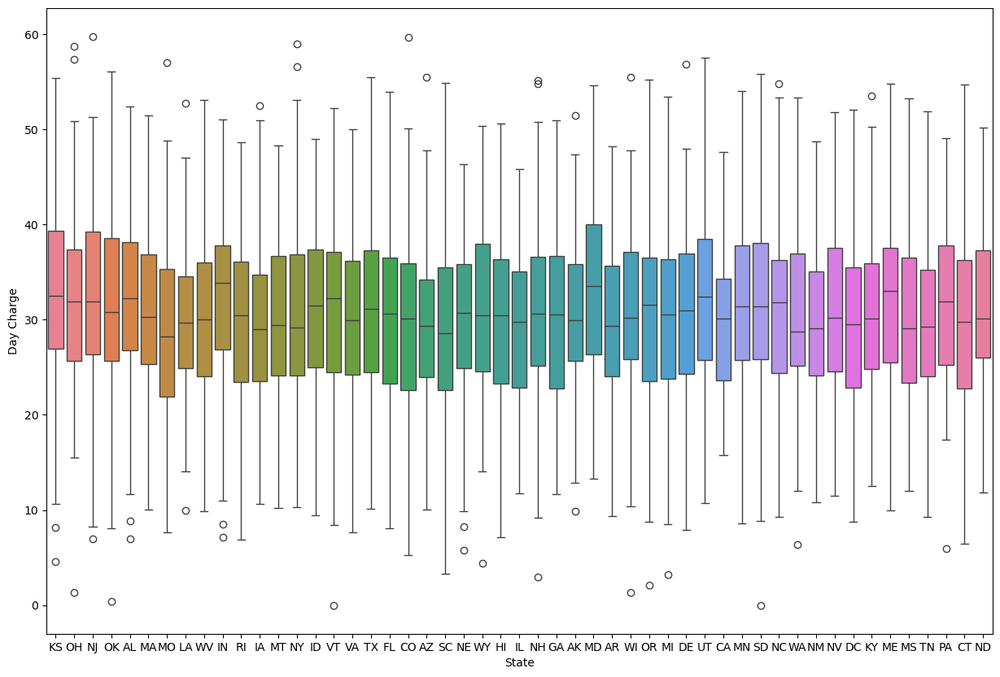

In [175]:
plt.figure(figsize=(15,10))
sns.boxplot(x='State',y='Day Charge',data=data,hue='State')
plt.show()
## Max.Charges of Day calls from state wise.

## Insights :

* NJ ,NY &CO this states are high chargable for the day times.
* OK,VT&SD this states are low chargable for the day times.

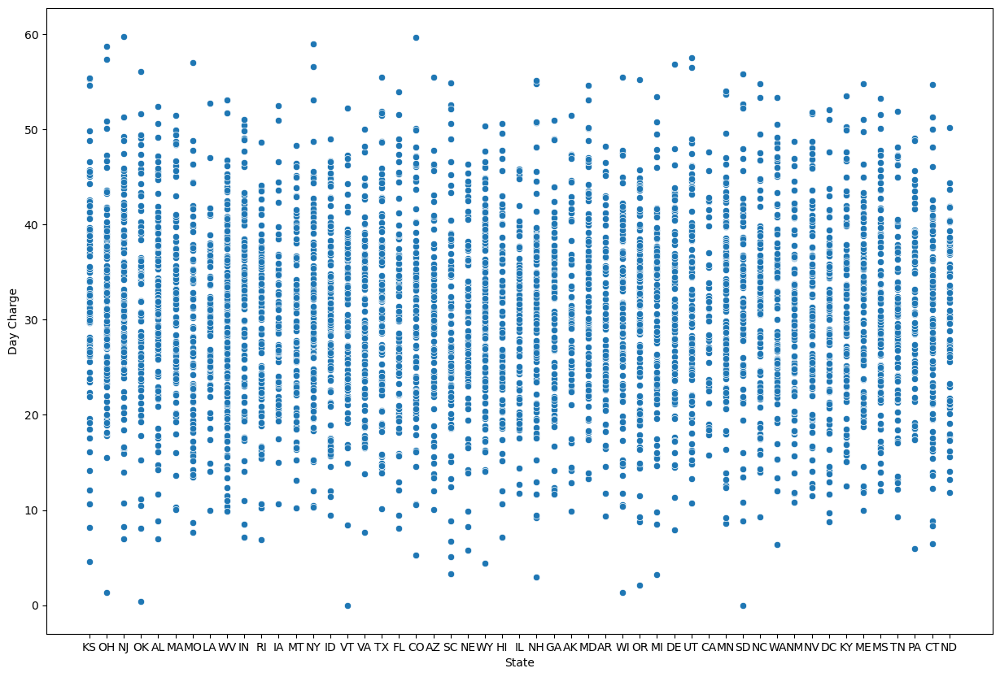

In [176]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='State',y='Day Charge',data=data)
plt.show()
## Max.Charges of Day calls from state wise use scatterplot

## Insights :
* NJ ,NY &CO this states are high chargable for the day times.
* OK,VT&SD this states are low chargable for the day times.

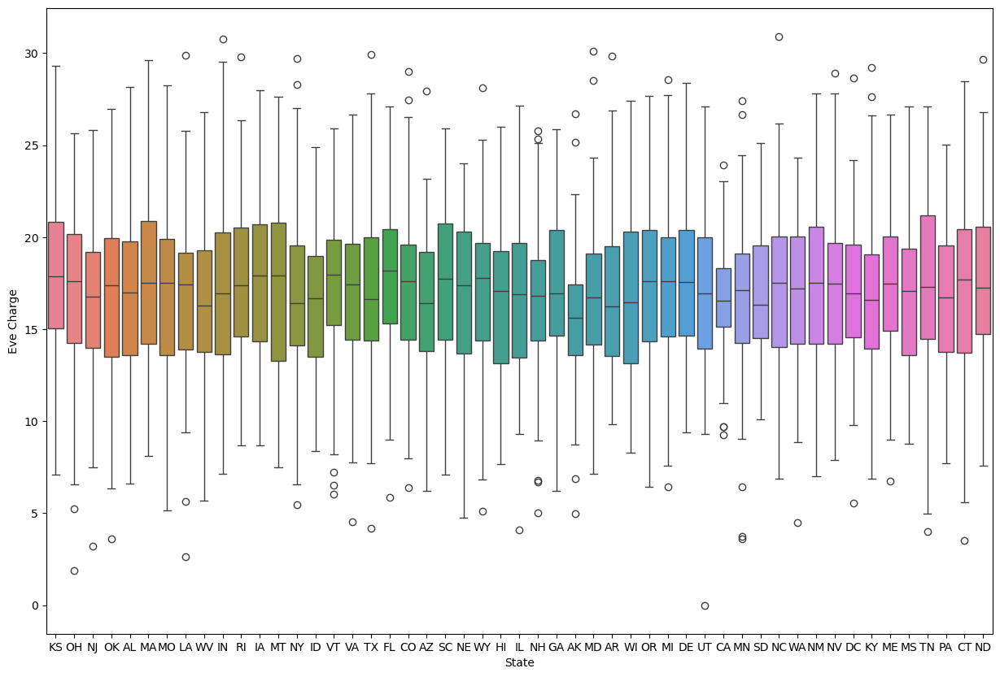

In [177]:
plt.figure(figsize=(15,10))
sns.boxplot(x='State',y='Eve Charge',data=data,hue='State')
plt.show()
## Max.Charges of Eve calls from state wise.

## Insights :
* IN,NC this states are high chargable for the eve times.
* UT this states are low chargable for the eve times.
* Some States only high chargable.

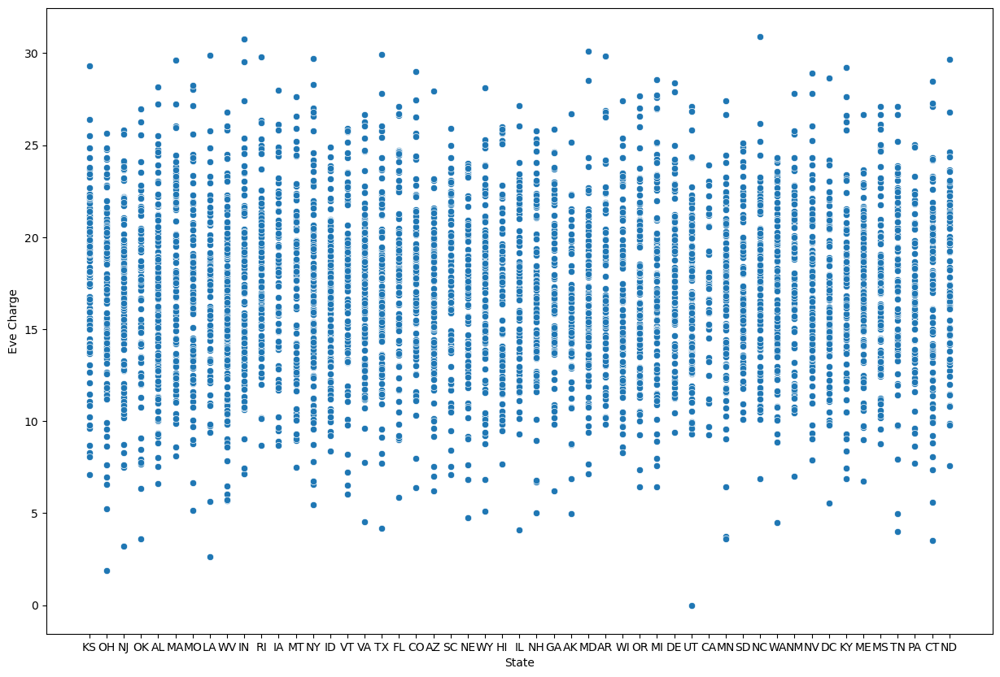

In [178]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='State',y='Eve Charge',data=data)
plt.show()
## Max.Charges of Eve calls from state wise use scatter Plot

## Insights :
* IN,NC this states are high chargable the eve times.
* UT this states are low chargable the eve times.

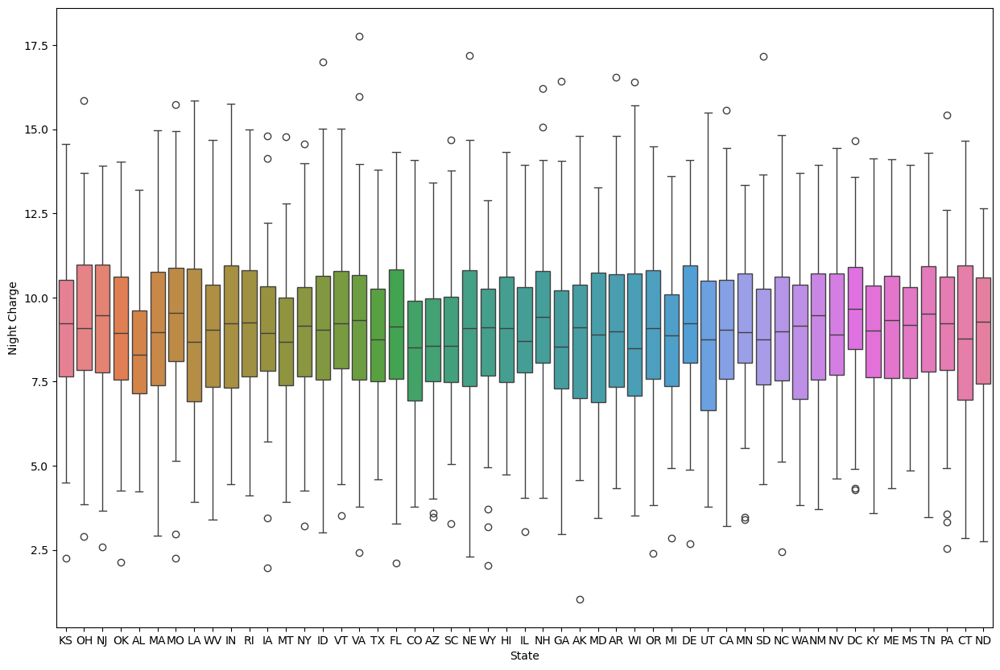

In [179]:
plt.figure(figsize=(15,10))
sns.boxplot(x='State',y='Night Charge',data=data,hue='State')
plt.show()
## Max.Charges of Night calls from state wise.

## Insights :
* VA this states are high chargable the Night times.
* AK this states are low chargable the Night times.

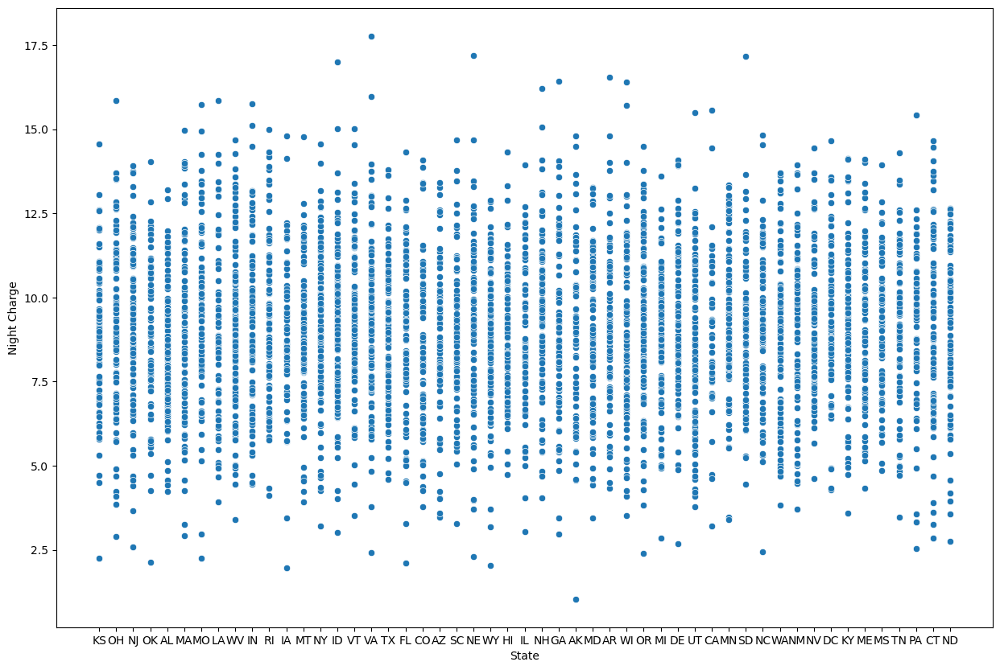

In [180]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='State',y='Night Charge',data=data)
plt.show()
## Max.Charges of Night calls from state wise use ScatterPlot

## Insights :
* VA this states are high chargable the Night times.
* AK this states are low chargable the Night times.

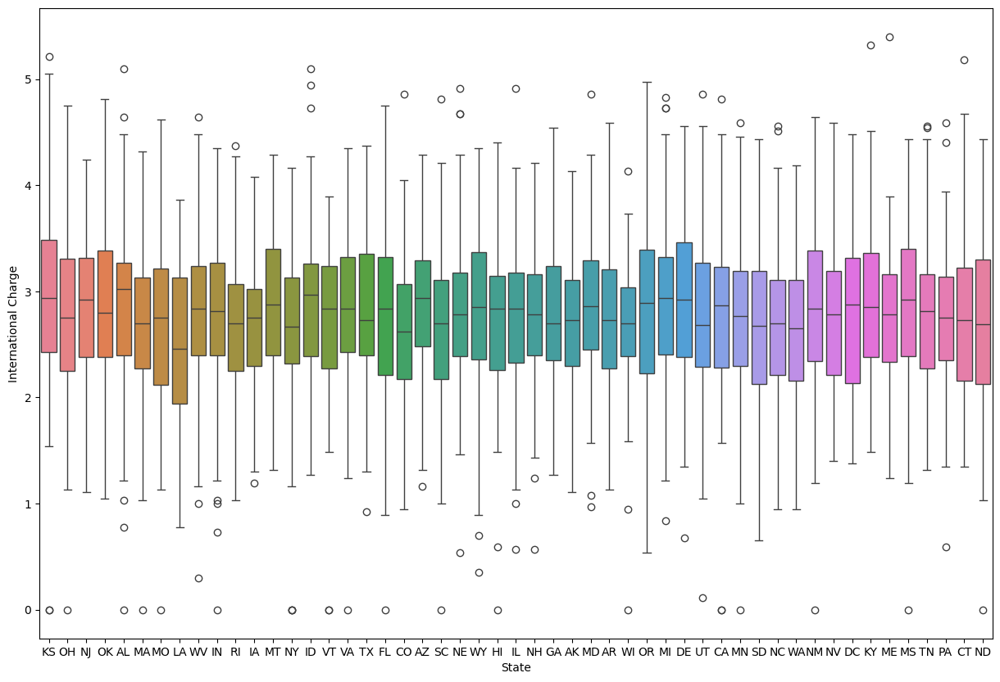

In [181]:
plt.figure(figsize=(15,10))
sns.boxplot(x='State',y='International Charge',data=data,hue='State')
plt.show()
## Max.Charges of International calls from state wise.

## Insights :
* ME,KY this states are high chargable the International times.
* KS,OH,AL,MA,MO,IN,NY,VT,VA,FL,SC,HI,WI,CA,MN,NM,MS,ND this states are low chargable the International times.

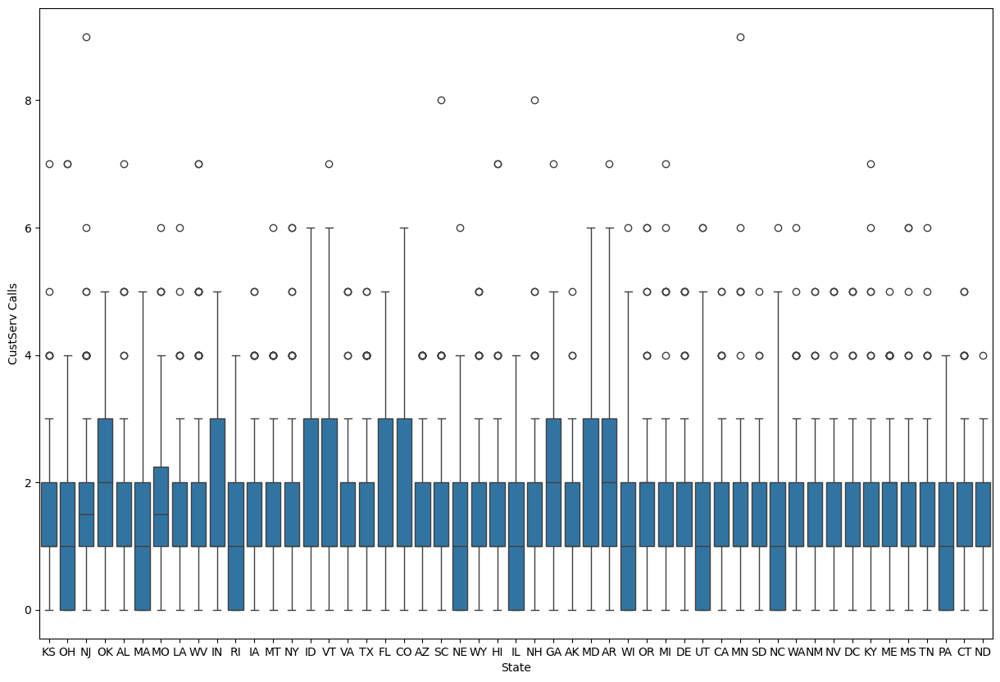

In [182]:
plt.figure(figsize=(15,10))
sns.boxplot(x='State',y='CustServ Calls',data=data)
plt.show()
## which state highest calls Customer to customer services

## Insights :
* These states are NJ,MN 9times call to customer Services.


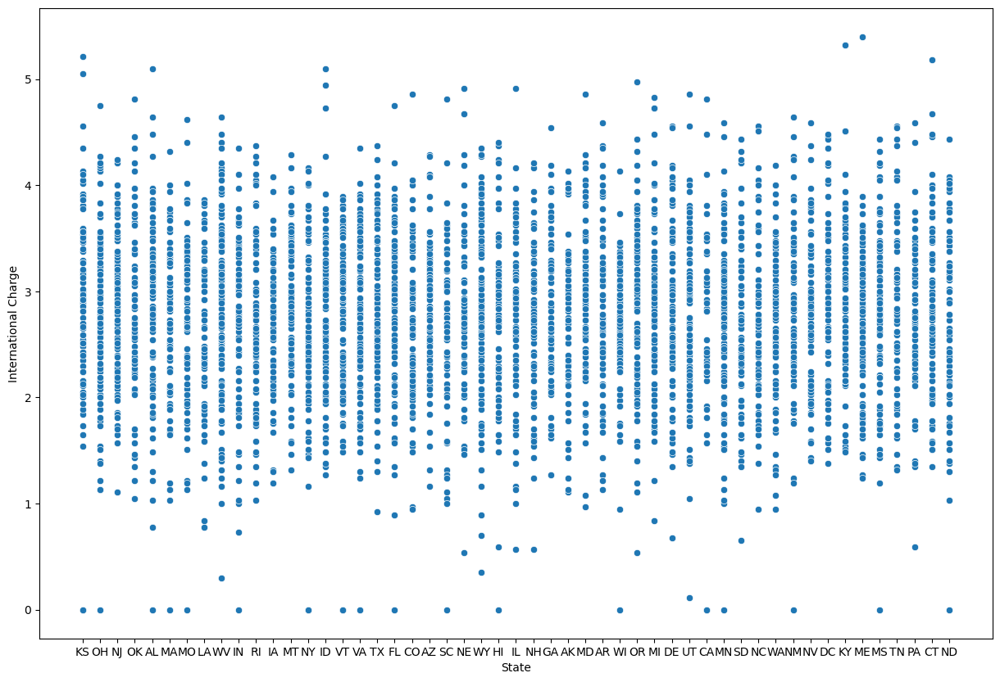

In [183]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='State',y='International Charge',data=data)
plt.show()
## Max.Charges of International calls from state wise use ScatterPlot

## Insights :
* ME,KY this states are high chargable the International times.
* KS,OH,AL,MA,MO,IN,NY,VT,VA,FL,SC,HI,WI,CA,MN,NM,MS,ND this states are low chargable the International times.

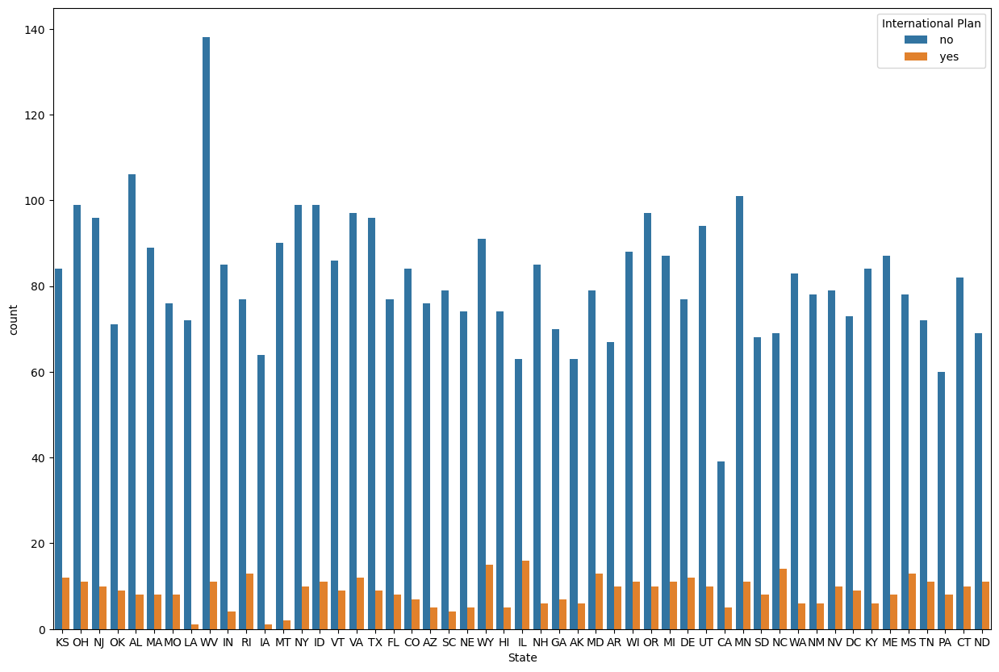

In [184]:
plt.figure(figsize=(15,10))
sns.countplot(x='State',data=data,hue='International Plan')
plt.show()
## statewise customers activate the internatonal plan

## Insights :
* WV States 140 Customers couldn't recharge the International Plan.
* WY and IL States are comparatively others states to highest customers reacharge the International Plan.
* LA and IA states are low customers recharge the International Plan.

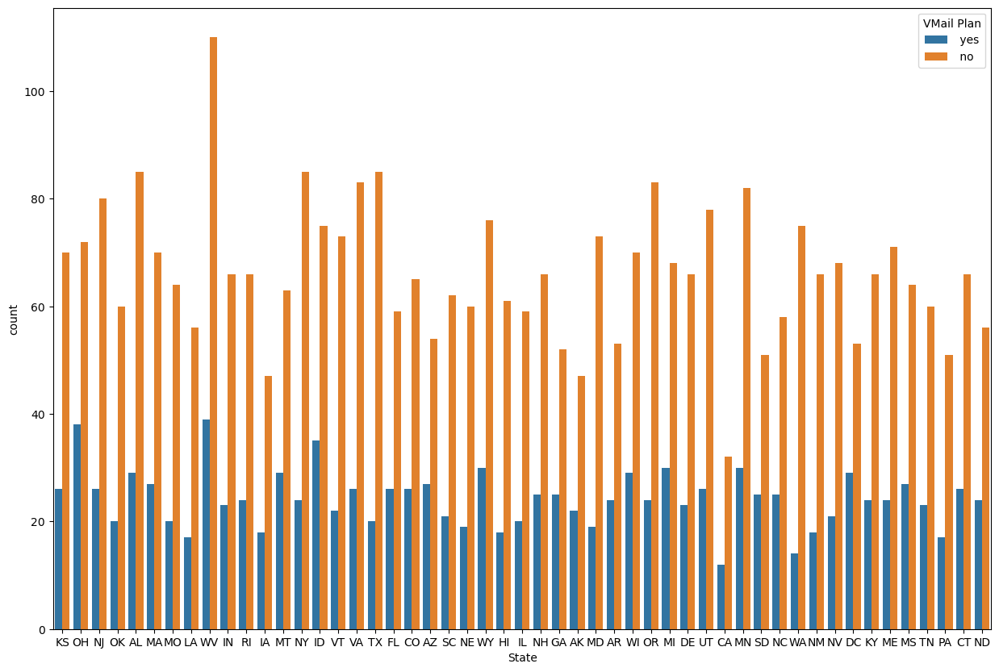

In [185]:
plt.figure(figsize=(15,10))
sns.countplot(x='State',data=data,hue='VMail Plan')
plt.show()
## statewise customers activate the voice mail plan

## Insights :
* WV States more than 100 Customers couldn't recharge the VMail Plan.
* WV & OH States are comparatively others states to highest customers reacharge the VMail Plan.
* CA states are low customers recharge the VMail Plan.

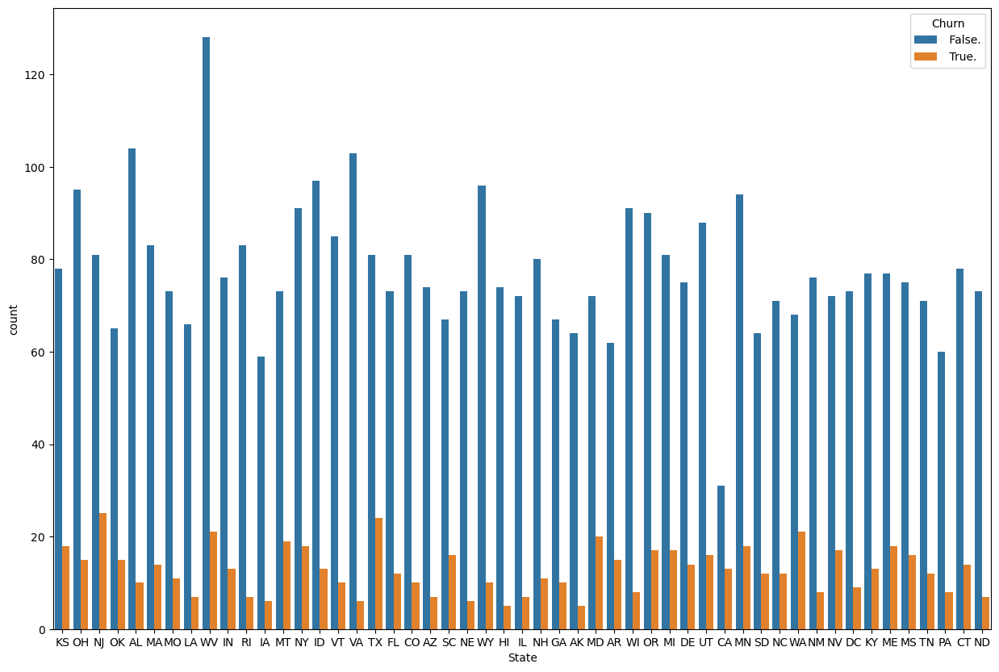

In [186]:
plt.figure(figsize=(15,10))
sns.countplot(x='State',data=data,hue='Churn')
plt.show()
## statewise customers Continue the Same Network is a False or else disconnected the Network is a True

## Insights :
* NJ & TX States are comparatively others states to highest customers Churn True.
* WV states are high customers Churn False.
* CA lowest state of Churn False.
* AK lowest state of Churn True.

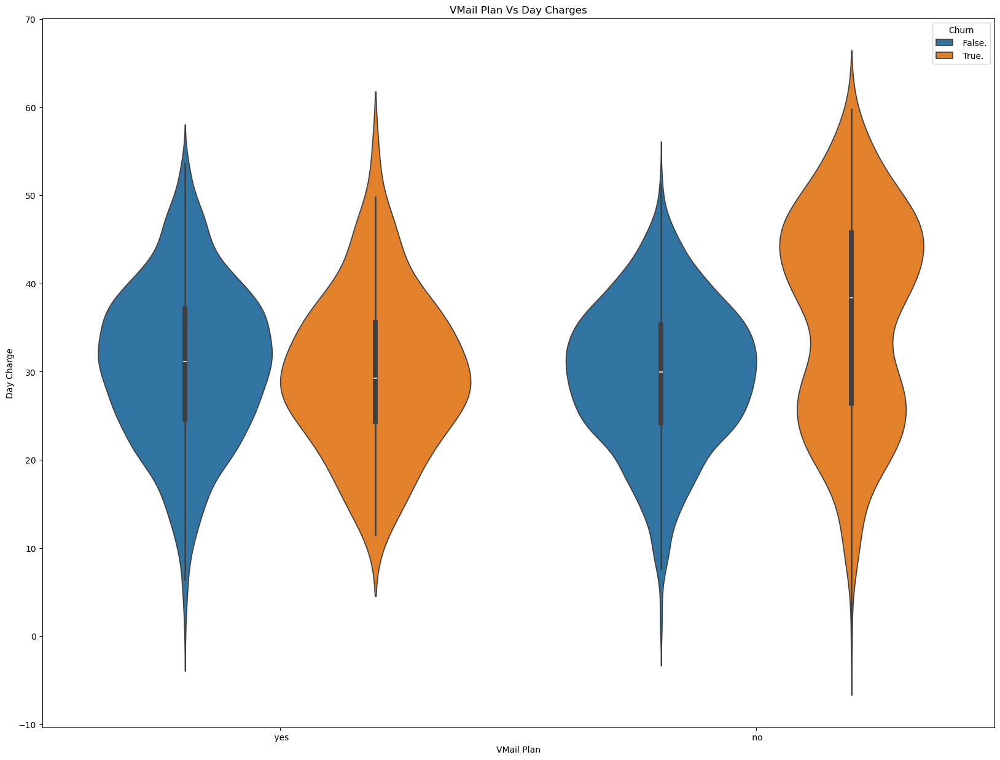

In [187]:
plt.figure(figsize=(20,15))
sns.violinplot(x='VMail Plan',y='Day Charge',data=data,hue='Churn')
plt.title('VMail Plan Vs Day Charges')
plt.show()

## Insights :
* VMail Plan couldn'd recharge for the day charge.but Churn True above 65.
* VMail Plan could recharged for the day charge.but Churn True above 60.

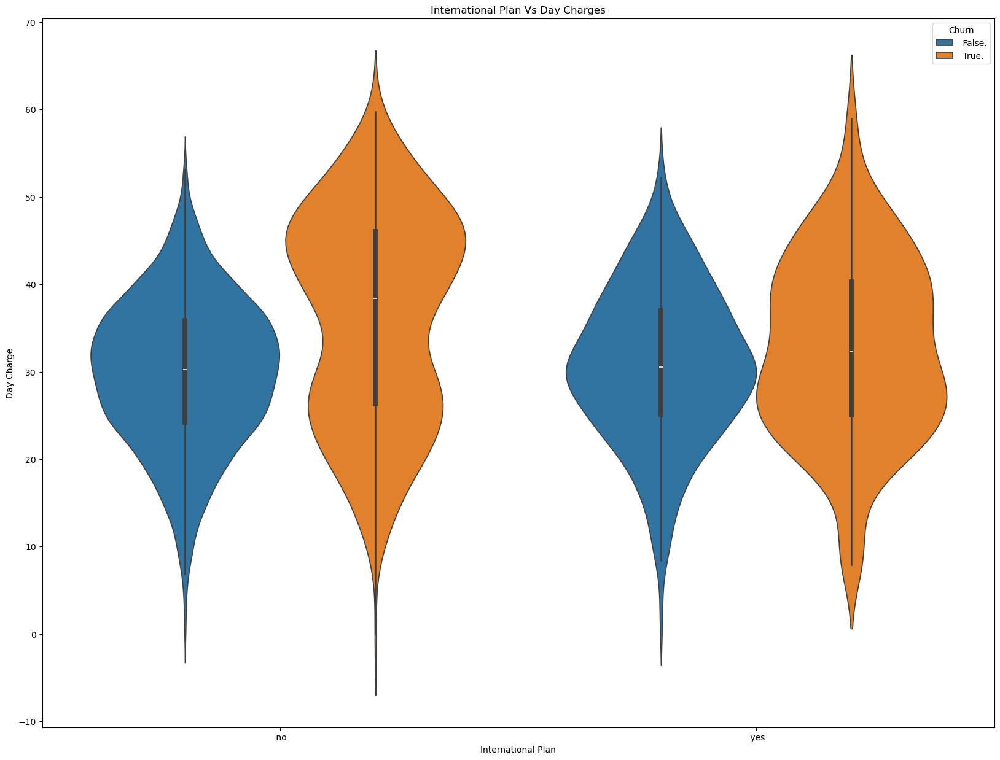

In [188]:
plt.figure(figsize=(20,15))
sns.violinplot(x='International Plan',y='Day Charge',data=data,hue='Churn')
plt.title('International Plan Vs Day Charges')
plt.show()

## Insights:
* International Plan recharged and then Churn True are high quantity of cutsomers.
* International Plan Couldn't recharge and the the Churn True are high quantity of customers.

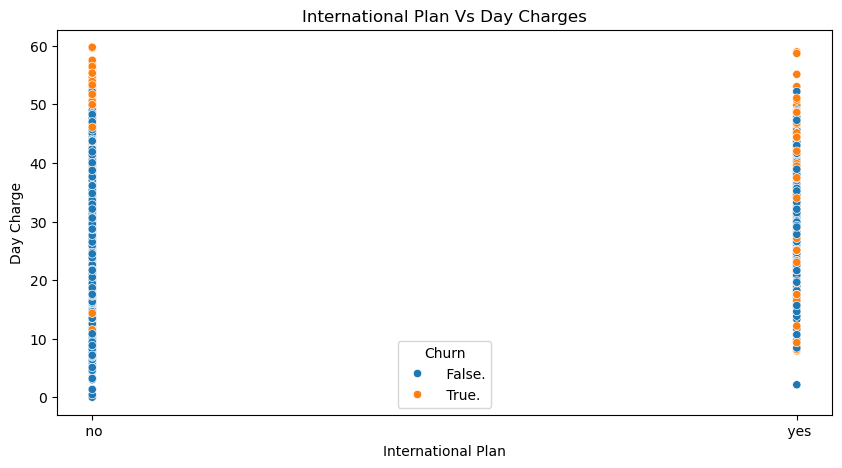

In [189]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='International Plan',y='Day Charge',data=data,hue='Churn')
plt.title('International Plan Vs Day Charges')
plt.show()
## International plan activate to be Day Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* International Plan active and day time customer users.so without International Plan customers are dis-connected the Churn True.

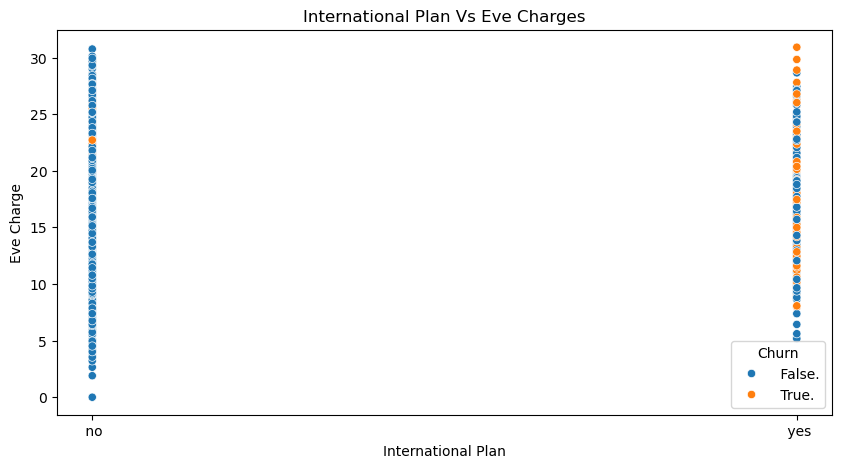

In [190]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='International Plan',y='Eve Charge',data=data,hue='Churn')
plt.title('International Plan Vs Eve Charges')
plt.show()
## International plan activate to be Eve Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* International Plan active and eve time customer users.so International Plan customers are dis-connected the Churn True.

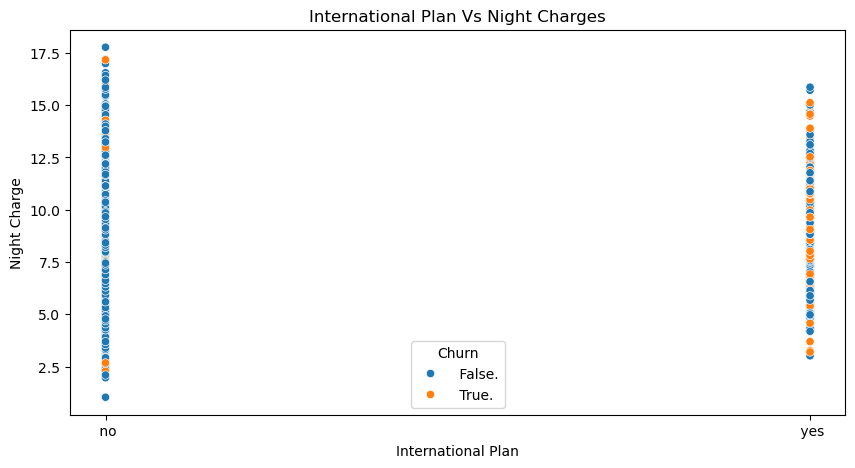

In [191]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='International Plan',y='Night Charge',data=data,hue='Churn')
plt.title('International Plan Vs Night Charges')
plt.show()
## International plan activate to be Night Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* International Plan active and night time customer users.so International Plan customers are dis-connected the Churn True.

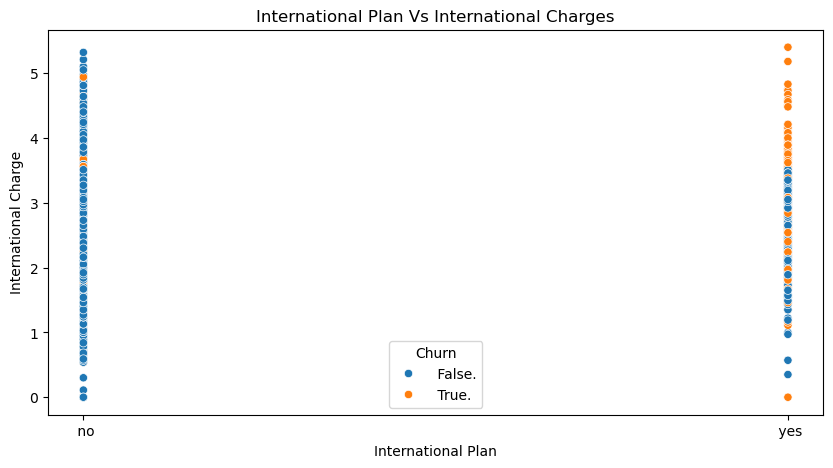

In [192]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='International Plan',y='International Charge',data=data,hue='Churn')
plt.title('International Plan Vs International Charges')
plt.show()
## International plan activate to be International Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* International Plan active and International time customer users.so  International Plan customers are dis-connected the Churn True.

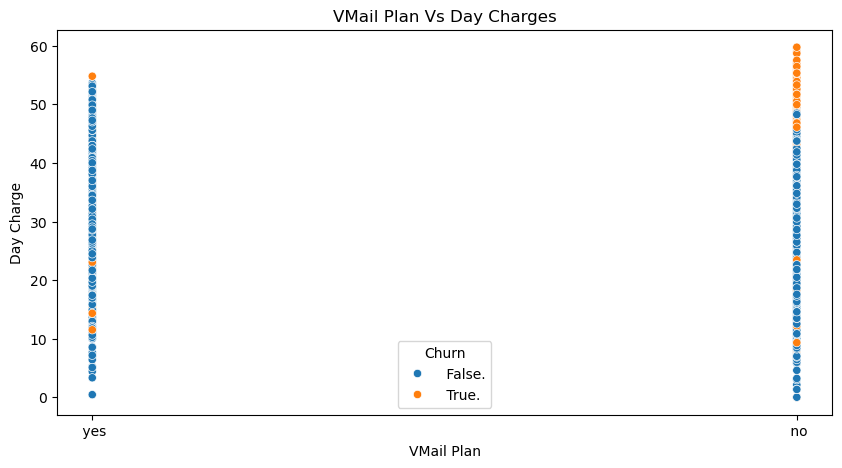

In [193]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='VMail Plan',y='Day Charge',data=data,hue='Churn')
plt.title('VMail Plan Vs Day Charges')
plt.show()
## VMail Plan activate to be Day Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* VMail Plan active and day time customer users.so without VMail Plan customers are dis-connected the Churn True.

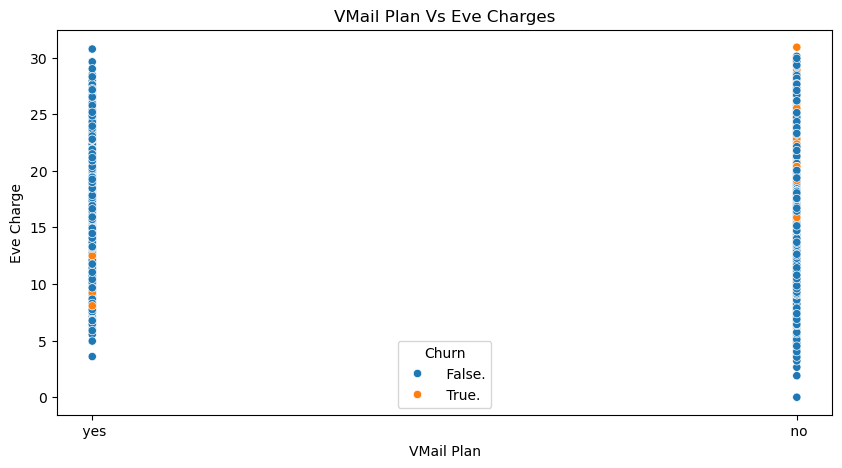

In [194]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='VMail Plan',y='Eve Charge',data=data,hue='Churn')
plt.title('VMail Plan Vs Eve Charges')
plt.show()
## VMail Plan activate to be Eve Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* VMail Plan active and eve time customer users.so without VMail Plan customers are dis-connected the Churn True.

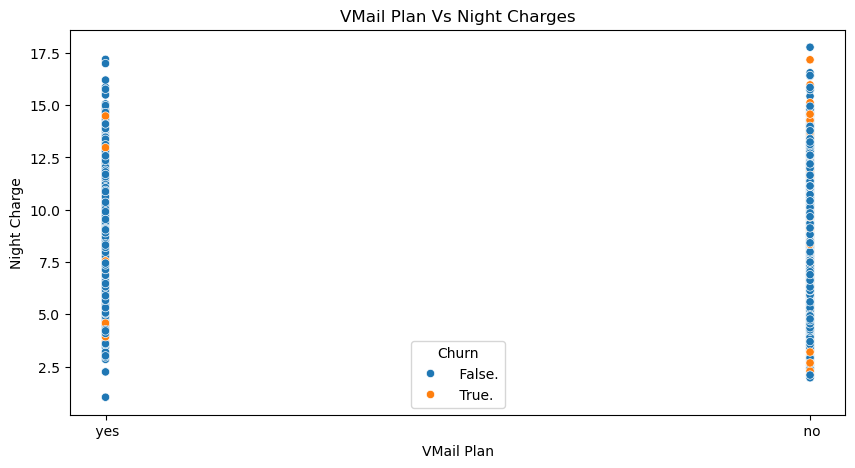

In [195]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='VMail Plan',y='Night Charge',data=data,hue='Churn')
plt.title('VMail Plan Vs Night Charges')
plt.show()
## VMail Plan activate to be Night Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* VMail Plan active and night time customer users.so without VMail Plan customers are dis-connected the Churn True.

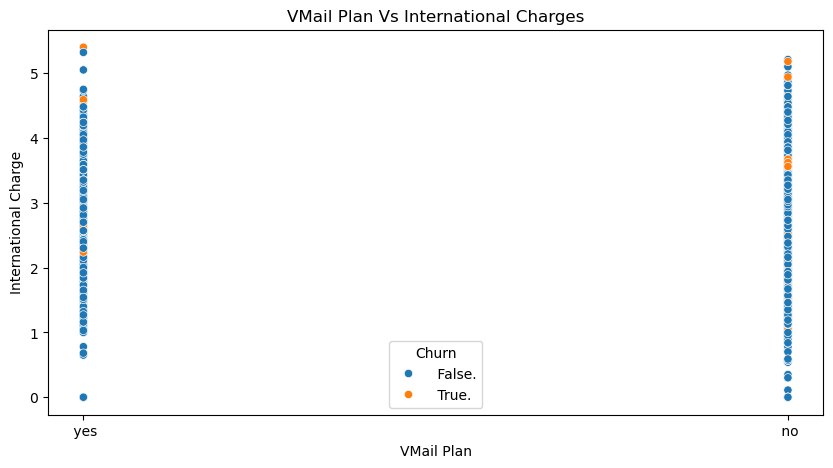

In [196]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='VMail Plan',y='International Charge',data=data,hue='Churn')
plt.title('VMail Plan Vs International Charges')
plt.show()
## VMail Plan activate to be International Charges highest or not and
## there are Customers Continue (or) dis-continue.

## Insights:
* VMail Plan active and international time customer users.so without VMail Plan customers are dis-connected the Churn True.

<Figure size 1000x500 with 0 Axes>

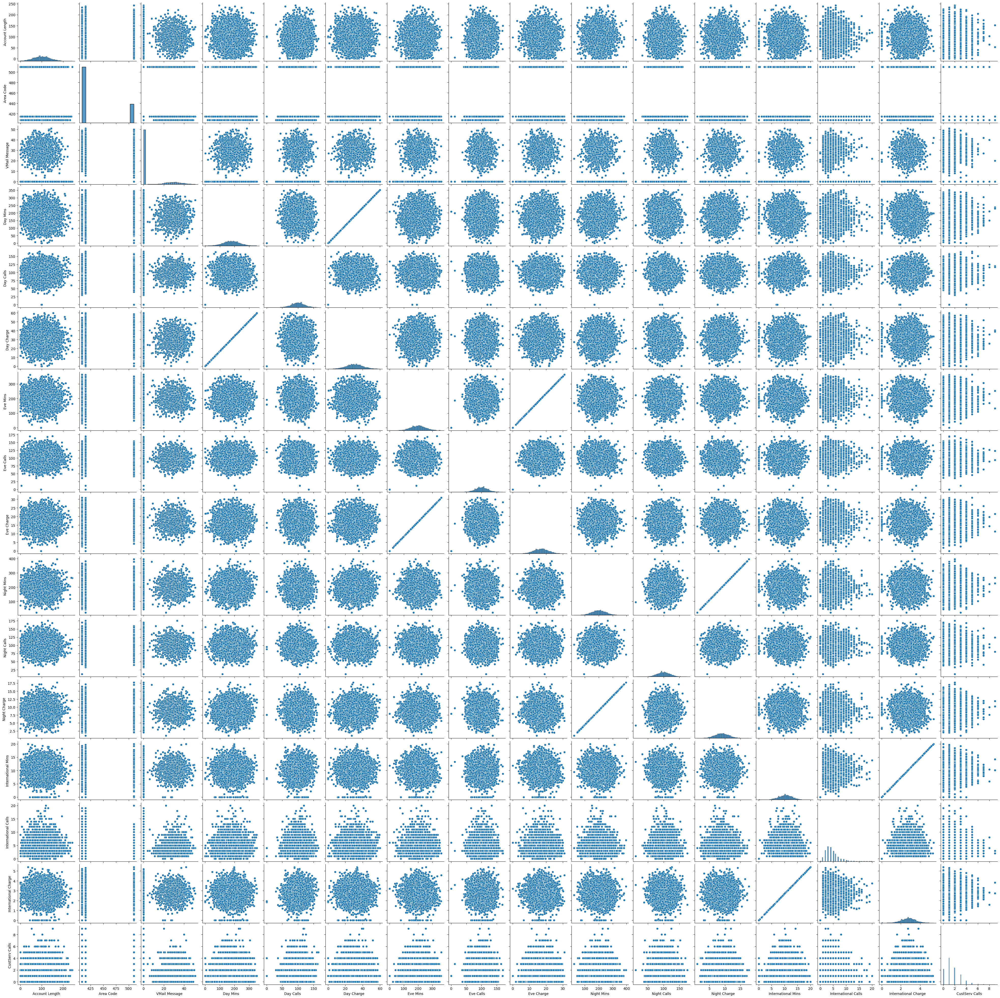

In [197]:
plt.figure(figsize=(10,5))
sns.pairplot(data)
plt.show()

## Insights :
* all features correlated to the each features visible the scatter plot and histplot,lineplot.

# Box plot for Outliers :

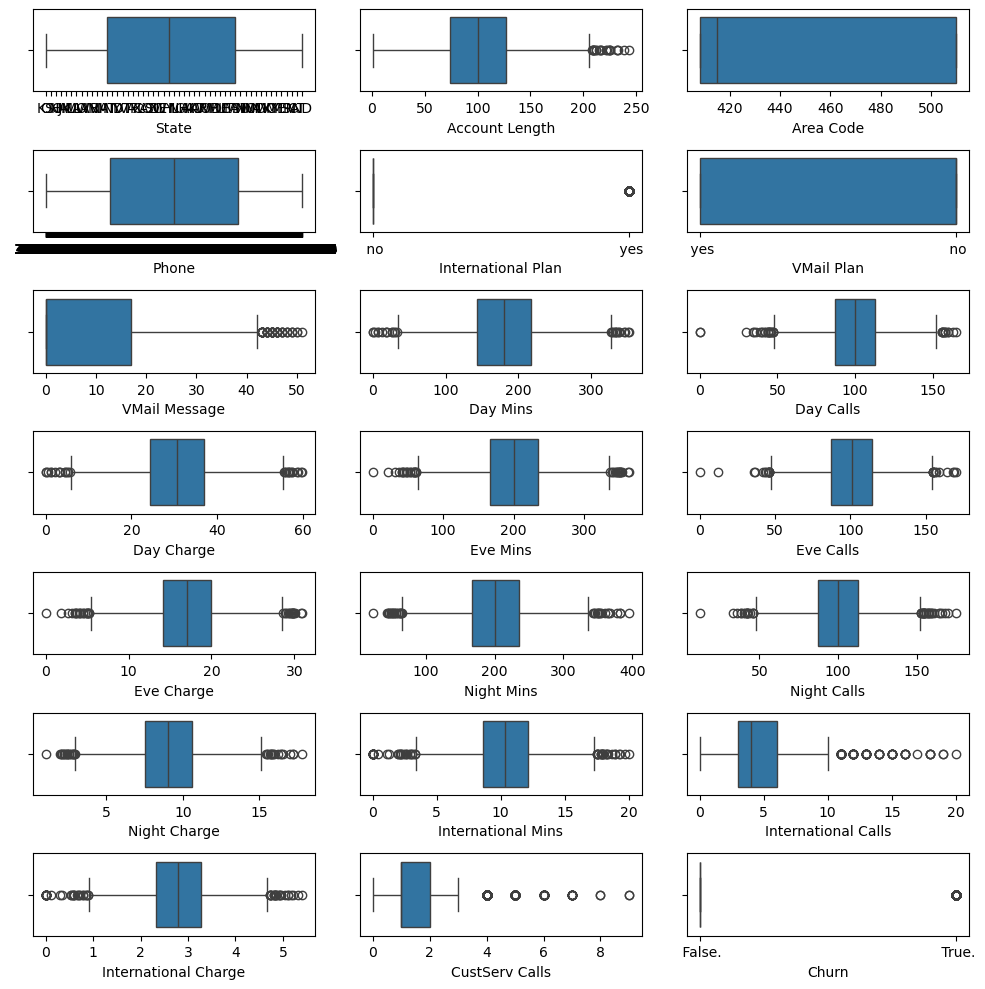

In [198]:
plt.figure(figsize=(10,10))
plotnumber=1
for i in data.columns:
    plt.subplot(7,3,plotnumber)
    sns.boxplot(x=i,data=data)
    plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()
## To be Check the Visiually Outliers.

## Insights :
* Numerical columns are handle the Outliers. for Eve Mins,Day Charge.

# Data Distribution's:

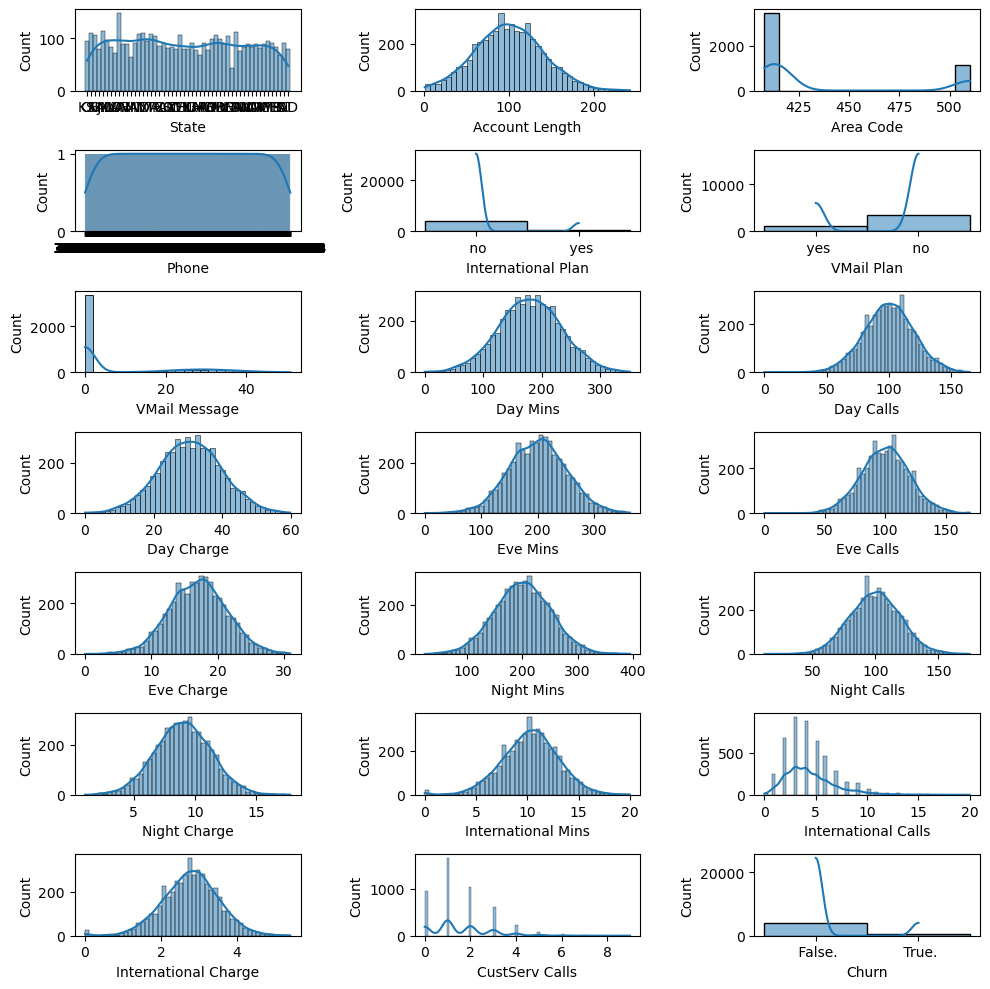

In [199]:
plt.figure(figsize=(10,10))
plotnumber=1
for i in data.columns:
    plt.subplot(7,3,plotnumber)
    sns.histplot(x=i,data=data,kde=True)
    plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()
## To be Check Distribution of data is Normal or Skewed.

## Insights :
* Day mins,Day calls,Day Charge,eve mins,eve calls,eve charge,night mins,night calls,night charge,international mins,international calls,international charge.these features are normal distributions.

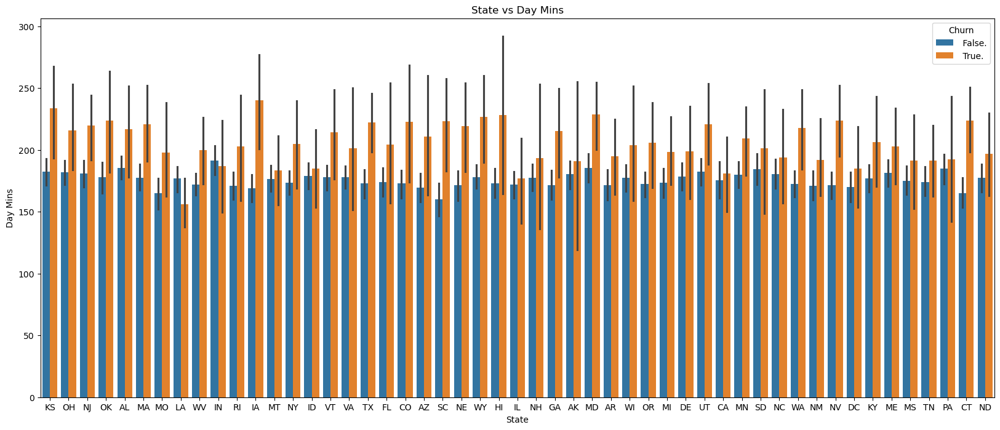

In [200]:
## Which kind of people usage (like day mins,eve mins, night mins, international mins) more time for state wise.
plt.figure(figsize=(20,8))
sns.barplot(x='State',y='Day Mins',data=data,hue='Churn')
plt.title('State vs Day Mins')
plt.show()

## Insights :
* IA,HI states are more customers use the day times and also churn True customers.
* LA states are low customers use the day times and also churn True customers.
* IN states are more customers use the day times and also churn False customers.
* SC,CT states are low customers use the day times and also churn False customers.

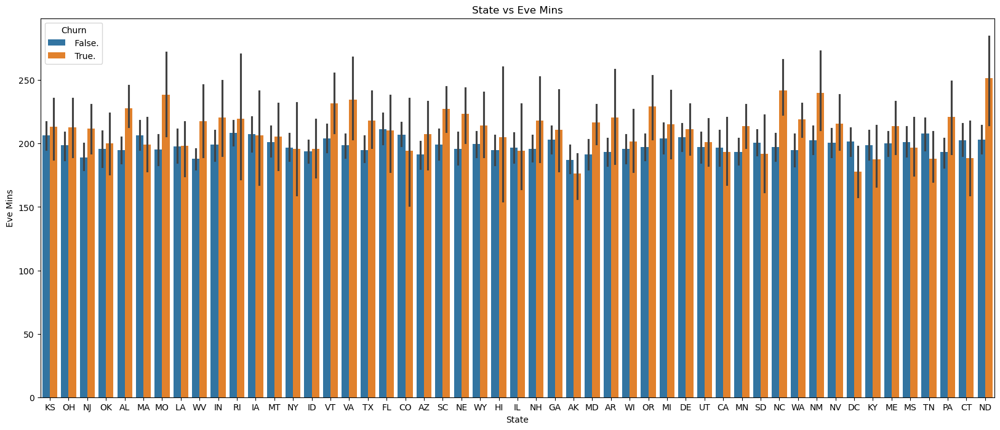

In [201]:
plt.figure(figsize=(20,8))
sns.barplot(x='State',y='Eve Mins',data=data,hue='Churn')
plt.title('State vs Eve Mins')
plt.show()

## Insights :
* ND states are more customers use the eve times and also churn True customers.
* AK states are low customers use the eve times and also churn True customers.
* FL states are more customers use the eve times and also churn False customers.
* NJ states are low customers use the eve times and also churn False customers.

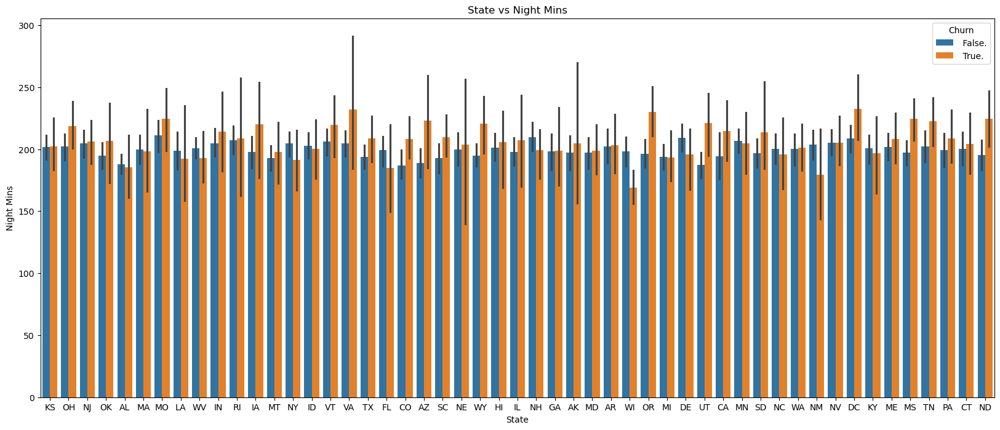

In [202]:
plt.figure(figsize=(20,8))
sns.barplot(x='State',y='Night Mins',data=data,hue='Churn')
plt.title('State vs Night Mins')
plt.show()

## Insights :
* VA states are more customers use the night times and also churn True customers.
* WI states are low customers use the night times and also churn True customers.
* MO,IL states are more customers use the night times and also churn False customers.
* AL states are low customers use the night times and also churn False customers.

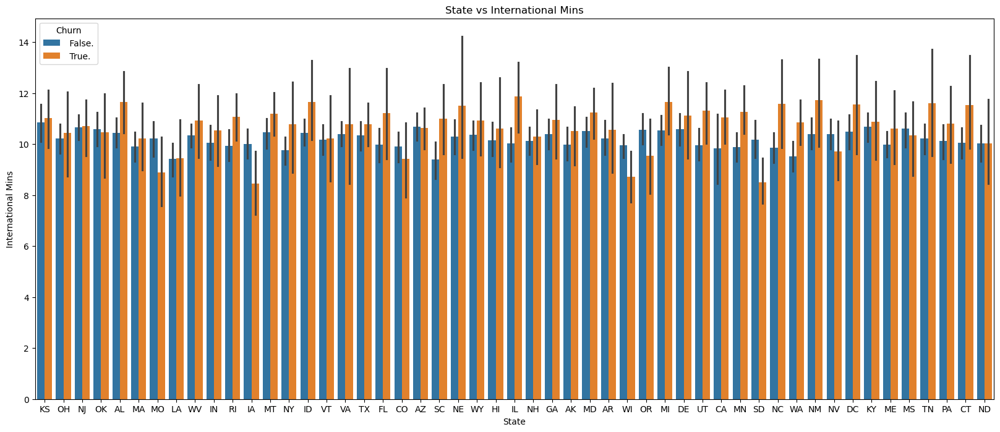

In [203]:
plt.figure(figsize=(20,8))
sns.barplot(x='State',y='International Mins',data=data,hue='Churn')
plt.title('State vs International Mins')
plt.show()

## Insights :
* NE states are more customers use the international times and also churn True customers.
* IA states are low customers use the international times and also churn True customers.
* KS states are more customers use the international times and also churn False customers.
* ND states are low customers use the day international and also churn False customers.

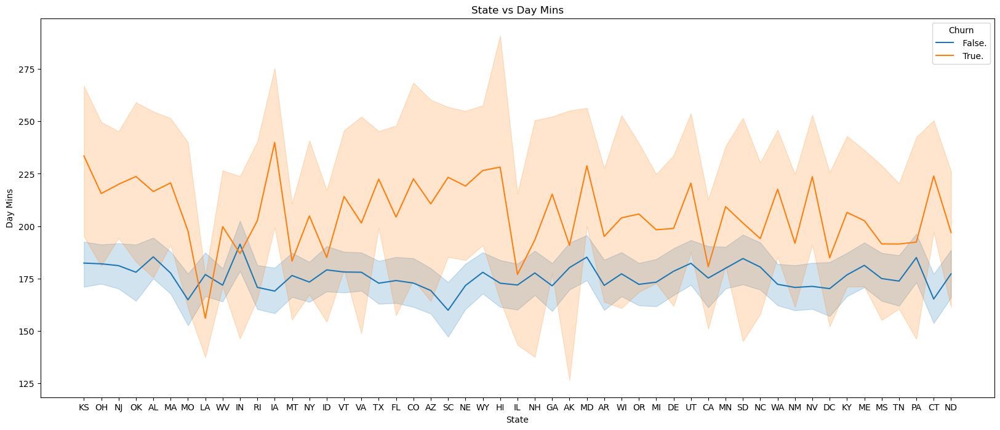

In [204]:
plt.figure(figsize=(20,8))
sns.lineplot(x='State',y='Day Mins',data=data,hue='Churn')
plt.title('State vs Day Mins')
plt.show()

## Insights :
* RI states are more use the Day users and also Churn True.
* LA states are less use the day users and also Churn True.
* IN states are more use the day users and also Churn False.
* CT states are less use the day users and also Churn False.

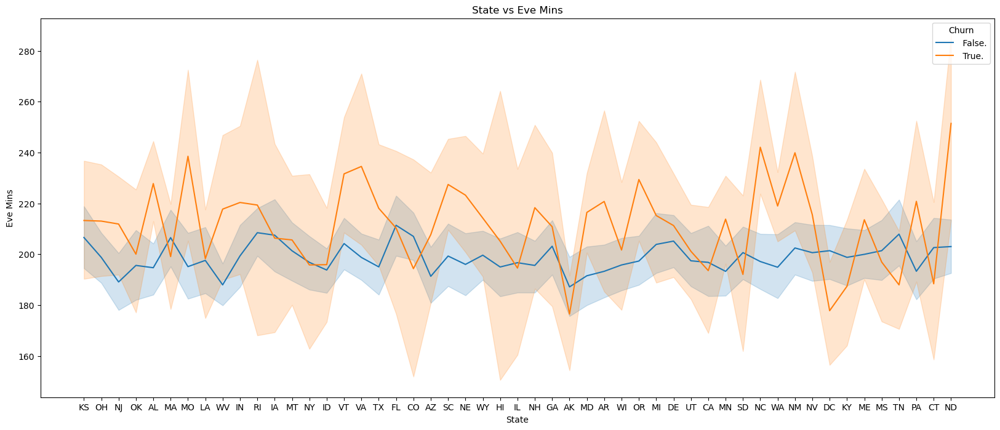

In [205]:
plt.figure(figsize=(20,8))
sns.lineplot(x='State',y='Eve Mins',data=data,hue='Churn')
plt.title('State vs Eve Mins')
plt.show()

## Insights :
* ND states are more use the eve users and also Churn True.
* AK states are less use the eve users and also Churn True.
* FL states are more use the eve users and also Churn False.
* AK states are less use the eve users and also Churn False.

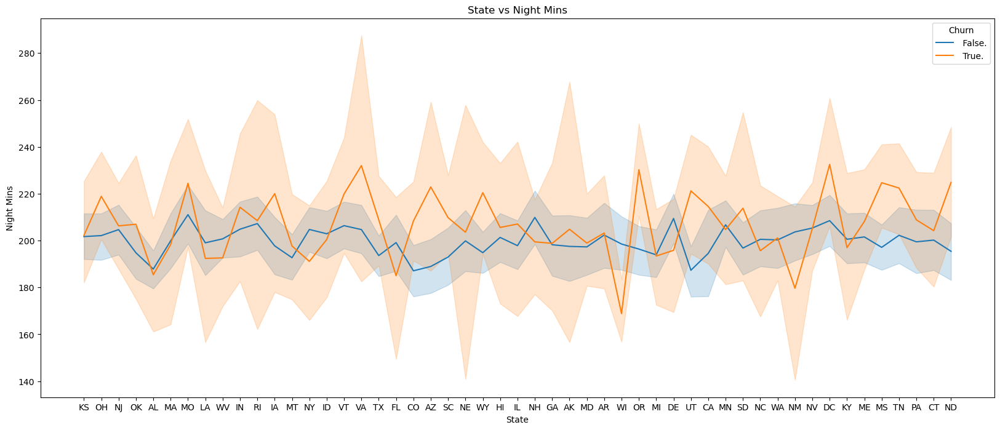

In [206]:
plt.figure(figsize=(20,8))
sns.lineplot(x='State',y='Night Mins',data=data,hue='Churn')
plt.title('State vs Night Mins')
plt.show()

## Insights :
* VA states are more use the night users and also Churn True.
* VM states are less use the night users and also Churn True.
* MA states are more use the night users and also Churn False.
* UT states are less use the night users and also Churn False.

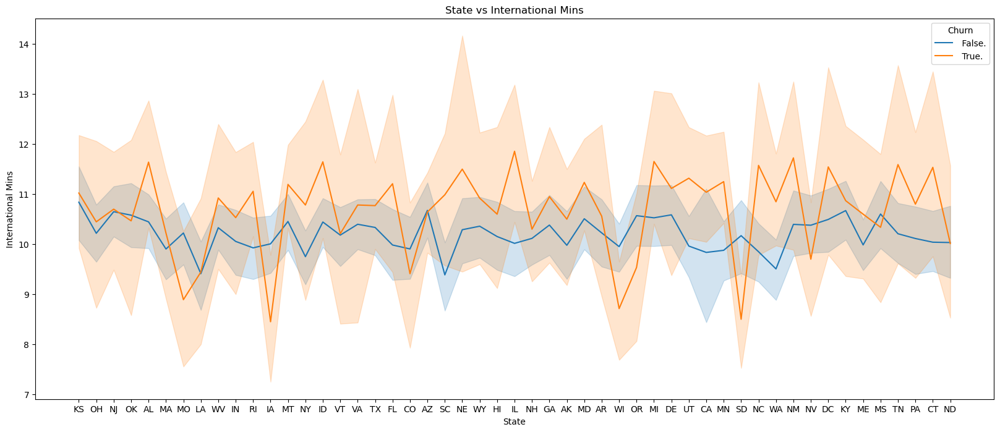

In [207]:
plt.figure(figsize=(20,8))
sns.lineplot(x='State',y='International Mins',data=data,hue='Churn')
plt.title('State vs International Mins')
plt.show()

## Insights :
* IL states are more use the international users and also Churn True.
* IA,SD states are less use the international users and also Churn True.
* NJ states are more use the international users and also Churn False.
* WA states are less use the international users and also Churn False.

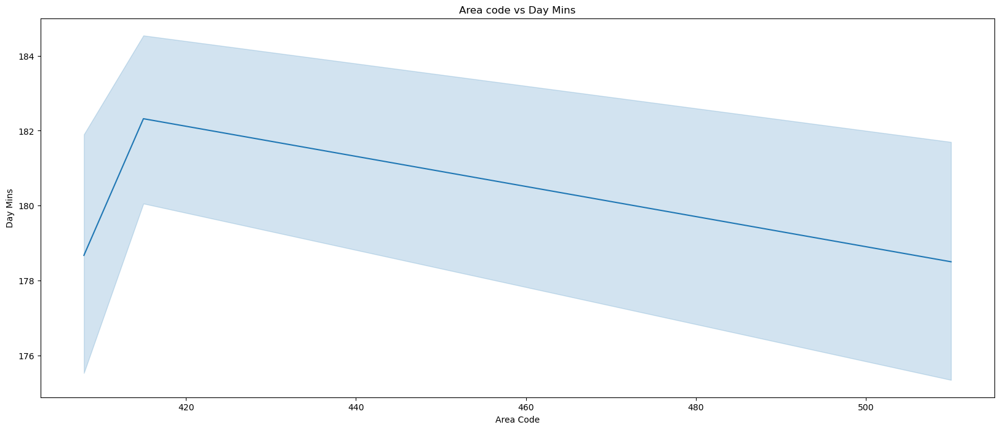

In [208]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Area Code',y='Day Mins',data=data)
plt.title('Area code vs Day Mins')
plt.show()
## The area code 415 region is highest use of Day time

## Insights :
* Day times the majority of customers to particularly used from 415 area codes. 

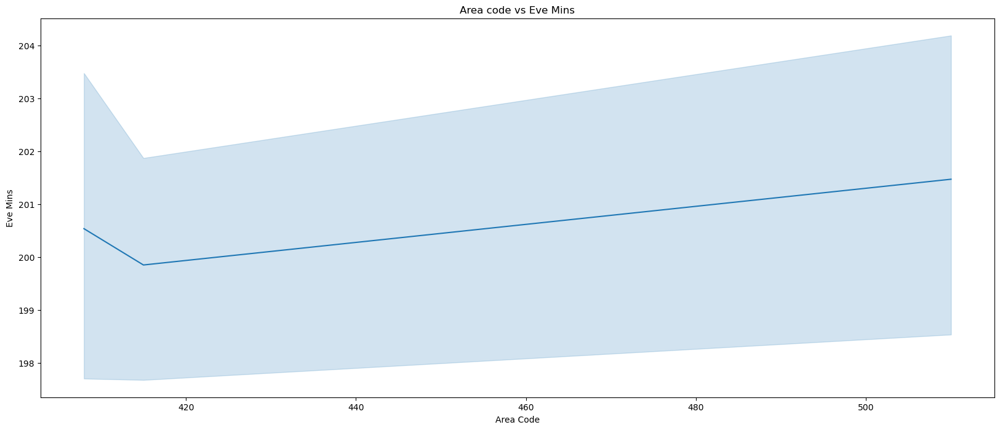

In [209]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Area Code',y='Eve Mins',data=data)
plt.title('Area code vs Eve Mins')
plt.show()
## The area code 510 region is highest use of Eve time

## Insights :
* Eve times the majority of customers to particularly used from 510 areas. 

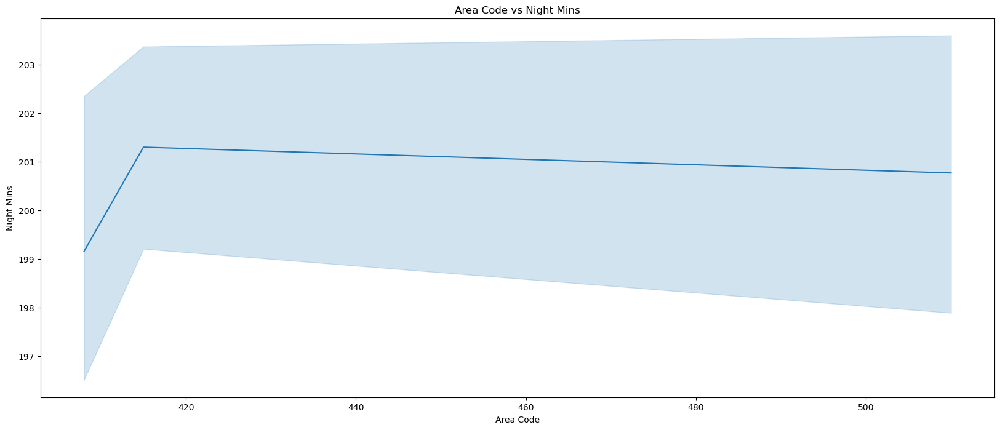

In [210]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Area Code',y='Night Mins',data=data)
plt.title('Area Code vs Night Mins')
plt.show()
## The area code 415,408,510 all region is highest use of Night time

## Insights :
* Night times the mostly all area customers are equally used(area codes are 408,415,510).

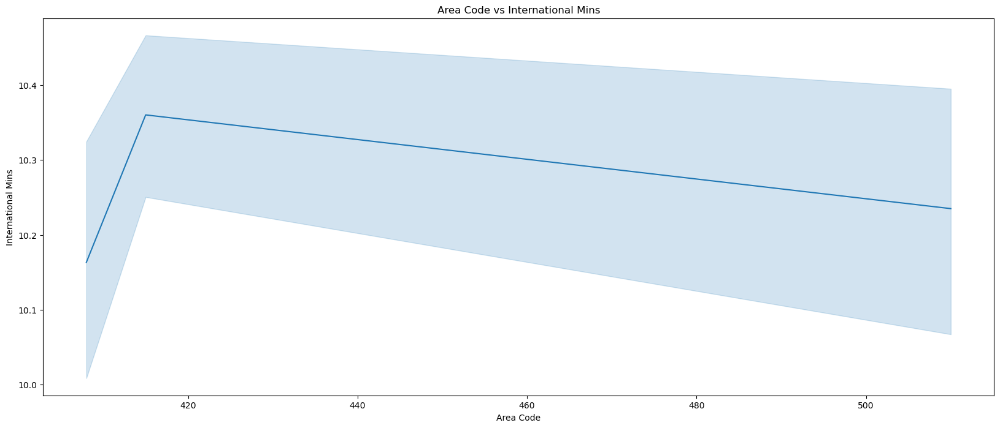

In [211]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Area Code',y='International Mins',data=data)
plt.title('Area Code vs International Mins')
plt.show()
## The area code 415 region is highest use of International time

## Insights :
* International times the majority of customers to particularly used from 415 area code. 

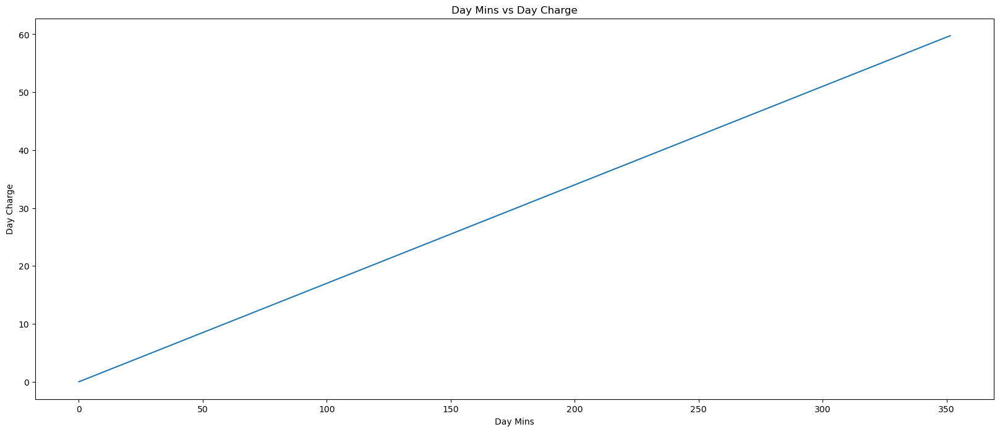

In [212]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Day Mins',y='Day Charge',data=data)
plt.title('Day Mins vs Day Charge')
plt.show()

## Insights :
* 1. Day calls used the customers upto 350 mins
* 2. the day calls charged the price for 350mins 60 rupees.
* 3. The average charged price for day calls 200mins 30 rupees.  

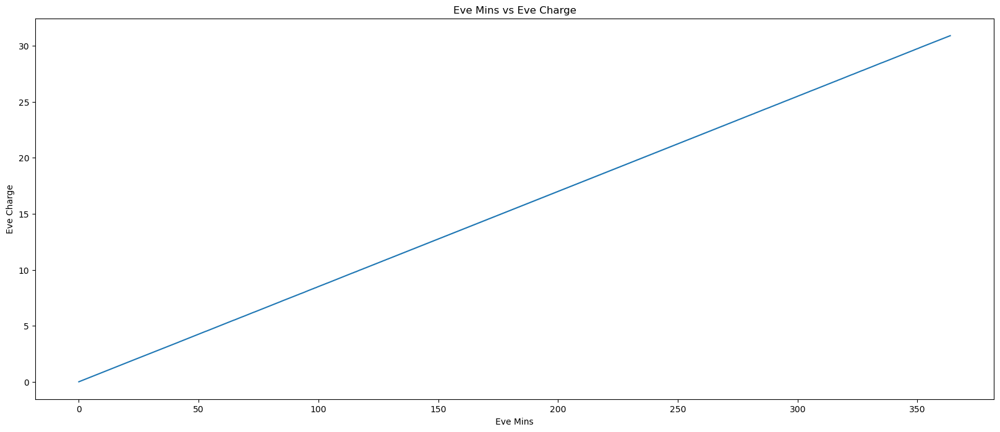

In [213]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Eve Mins',y='Eve Charge',data=data)
plt.title('Eve Mins vs Eve Charge')
plt.show()

## Insights :
* 1. Eve calls used the customers upto 350 mins
* 2. the Eve calls charged the price for 350mins 30 rupees.
* 3. The average charged price for Eve calls 200mins 15 rupees.  

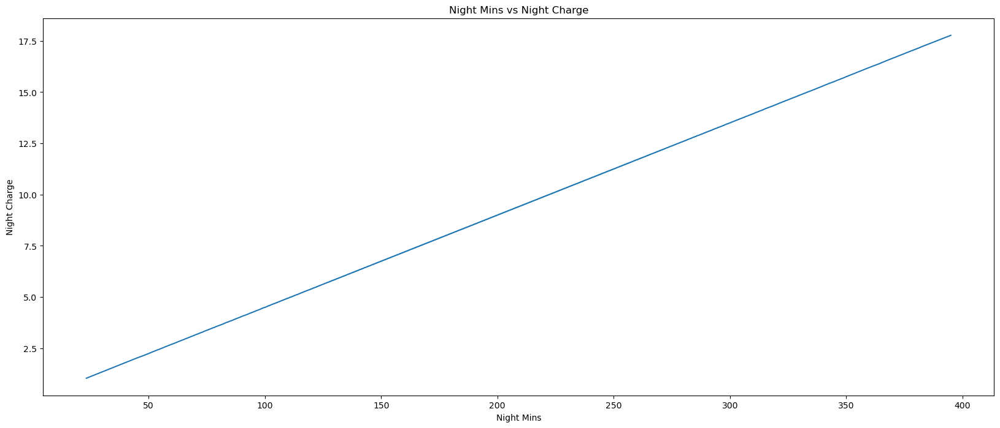

In [214]:
plt.figure(figsize=(20,8))
sns.lineplot(x='Night Mins',y='Night Charge',data=data)
plt.title('Night Mins vs Night Charge')
plt.show()

## Insights :
* 1. night calls used the customers upto 400mins
* 2. the night calls charged the price for 400mins 17.5 rupees.
* 3. The average charged price for night calls 200mins 10.0 rupees.  

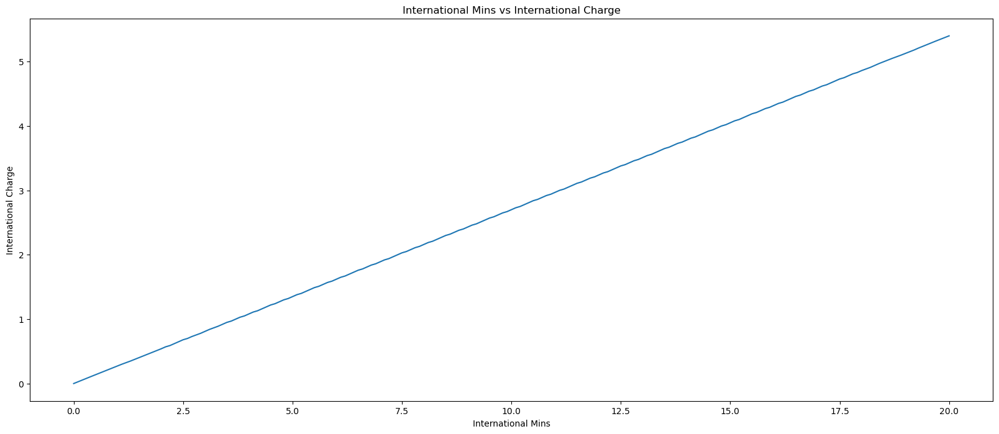

In [215]:
plt.figure(figsize=(20,8))
sns.lineplot(x='International Mins',y='International Charge',data=data)
plt.title('International Mins vs International Charge')
plt.show()

## Insights :
* 1. International calls used the customers upto 20mins
* 2. the ineternational calls charged the price for 20mins 7 rupees.
* 3. The average charged price for international calls 10mins 3.5 rupees.  

## Outliers Hnadling:
* 1.The features are Day Mins,Day Calls, Day Charge,Eve Mins, Eve Calls, Eve Charge,Night Mins,Night Calls,Night Charge and
* 2.International Mins, International Calls, International Charge are Numericals.

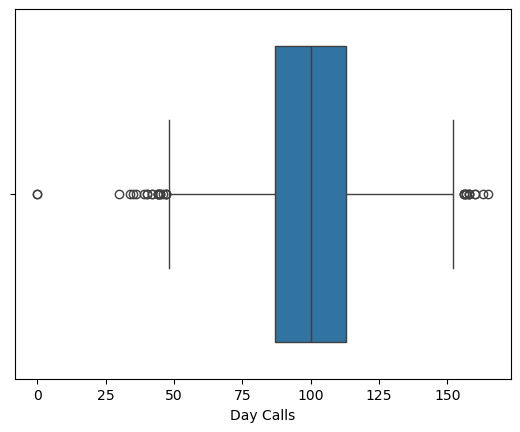

In [216]:
sns.boxplot(x='Day Calls',data=data)
plt.show()

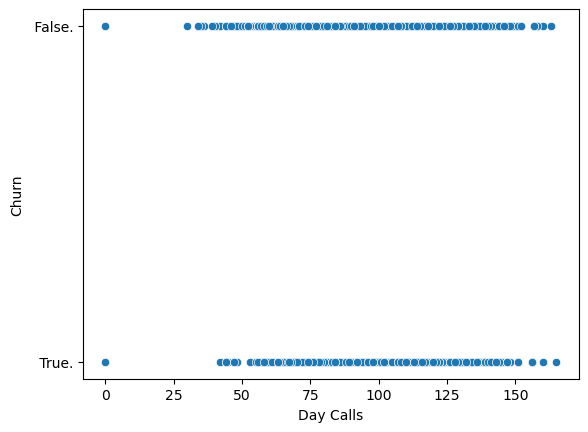

In [217]:
sns.scatterplot(x='Day Calls',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in day calls outliers are less than equal to 0 of 2 no's and
* 2.day calls greater than equal to 160 of 2 no's.

In [218]:
data.loc[data['Day Calls']==0,'Day Calls'].value_counts() ## there are 2 no's.

Day Calls
0    2
Name: count, dtype: int64

In [219]:
data.loc[data['Day Calls']>160,'Day Calls'].value_counts() ## there are 2 no's.

Day Calls
163    1
165    1
Name: count, dtype: int64

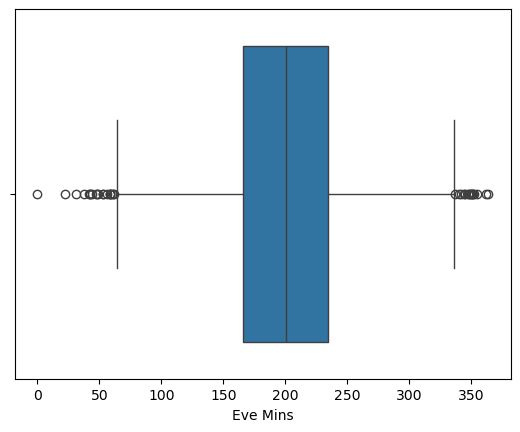

In [220]:
sns.boxplot(x='Eve Mins',data=data)
plt.show()

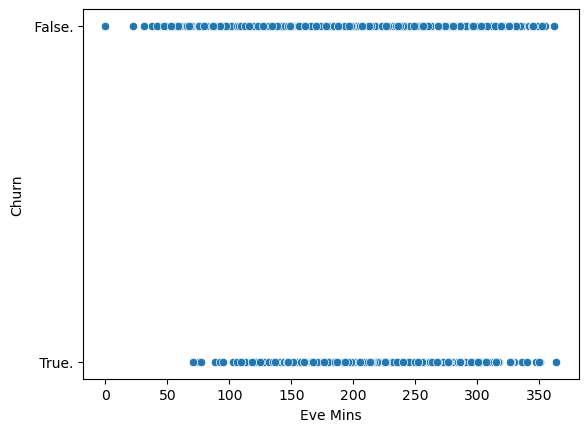

In [221]:
sns.scatterplot(x='Eve Mins',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in Eve Mins outliers are less than equal to 0 of 1 no's and
* 2.Eve Mins greater than equal to 355 of 2 no's.

In [222]:
data.loc[data['Eve Mins']==0,'Eve Mins'].value_counts() ## there are 1 no's.

Eve Mins
0.0    1
Name: count, dtype: int64

In [223]:
data.loc[data['Eve Mins']>355,'Eve Mins'].value_counts() ## there are 2 no's.

Eve Mins
361.8    1
363.7    1
Name: count, dtype: int64

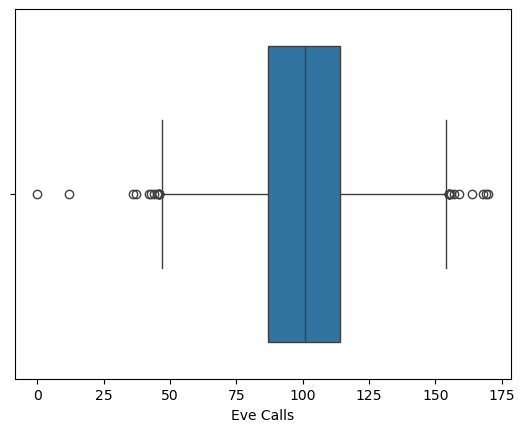

In [224]:
sns.boxplot(x='Eve Calls',data=data)
plt.show()

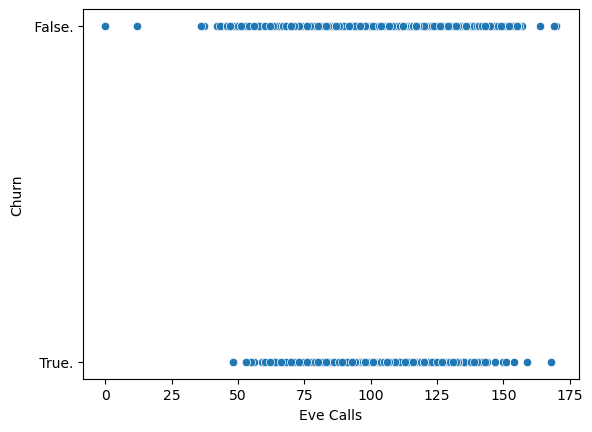

In [225]:
sns.scatterplot(x='Eve Calls',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in Eve calls outliers are less than equal to 25 of 2 no's and
* 2.Eve calls greater than equal to 165 of 3 no's.

In [226]:
data.loc[data['Eve Calls']<25,'Eve Calls'].value_counts() ## there are 3 nos.

Eve Calls
12    1
0     1
Name: count, dtype: int64

In [227]:
data.loc[data['Eve Calls']>165,'Eve Calls'].value_counts() ## there are 3 no's.

Eve Calls
168    1
170    1
169    1
Name: count, dtype: int64

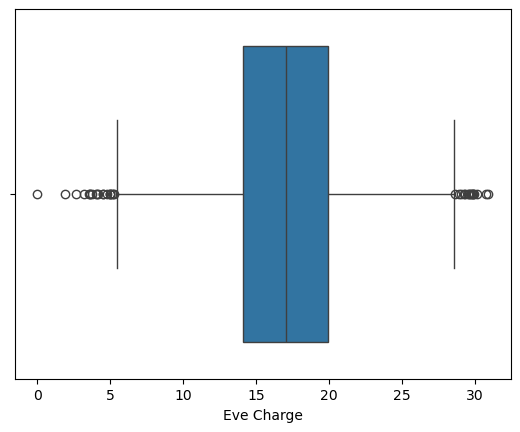

In [228]:
sns.boxplot(x='Eve Charge',data=data)
plt.show()

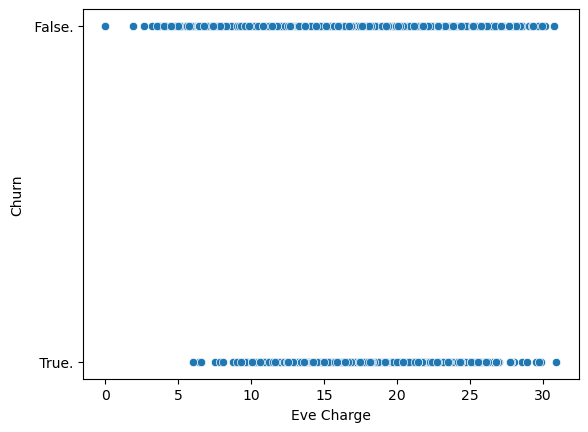

In [229]:
sns.scatterplot(x='Eve Charge',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in Eve Charge outliers are less than equal to 0 of 1 no's and
* 2.Eve Charge greater than equal to 30 of 3 no's.

In [230]:
data.loc[data['Eve Charge']==0,'Eve Charge'].value_counts() ## there are 1 nos.

Eve Charge
0.0    1
Name: count, dtype: int64

In [231]:
data.loc[data['Eve Charge']>30,'Eve Charge'].value_counts() ## there are 3 no's.

Eve Charge
30.75    1
30.11    1
30.91    1
Name: count, dtype: int64

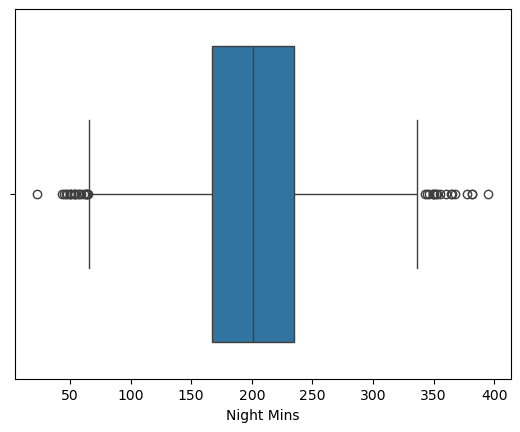

In [232]:
sns.boxplot(x='Night Mins',data=data)
plt.show()

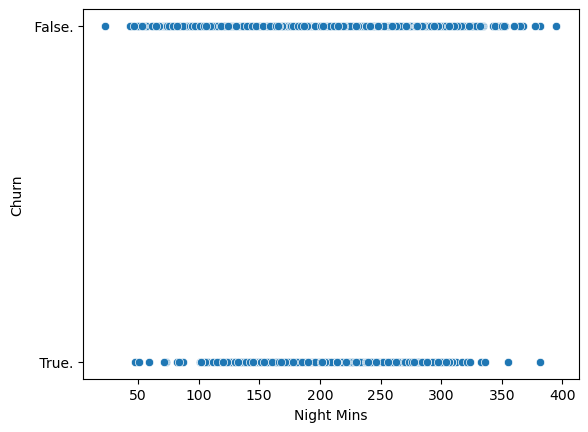

In [233]:
sns.scatterplot(x='Night Mins',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in night Mins outliers are less than equal to 45 of 2 no's
* 2.night Mins greater than equal to 380 of 3 no's.

In [234]:
data.loc[data['Night Mins']<45,'Night Mins'].value_counts() ## there are 2 no's.

Night Mins
43.7    1
23.2    1
Name: count, dtype: int64

In [235]:
data.loc[data['Night Mins']>380,'Night Mins'].value_counts() ## there are 3 no's.

Night Mins
381.9    1
395.0    1
381.6    1
Name: count, dtype: int64

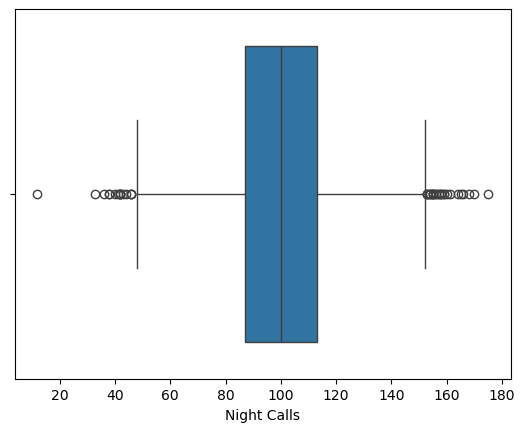

In [236]:
sns.boxplot(x='Night Calls',data=data)
plt.show()

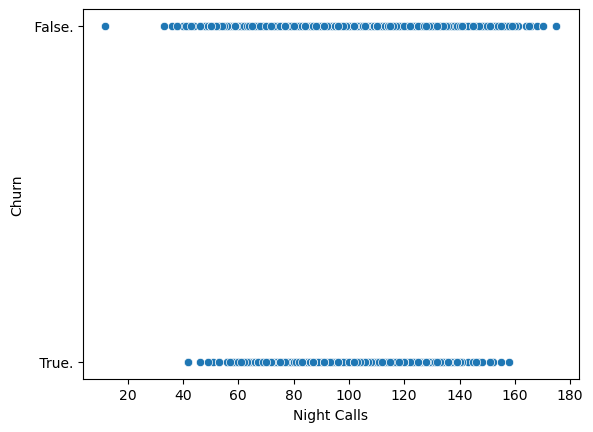

In [237]:
sns.scatterplot(x='Night Calls',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in night Calls outliers are less than equal to 30 of 1 no's
* 2.night calls charge greater than equal to 170 of 1 no's.

In [238]:
data.loc[data['Night Calls']<30,'Night Calls'].value_counts() ## there are 1 no's.

Night Calls
12    1
Name: count, dtype: int64

In [239]:
data.loc[data['Night Calls']>170,'Night Calls'].value_counts() ## there are 1 nos's.

Night Calls
175    1
Name: count, dtype: int64

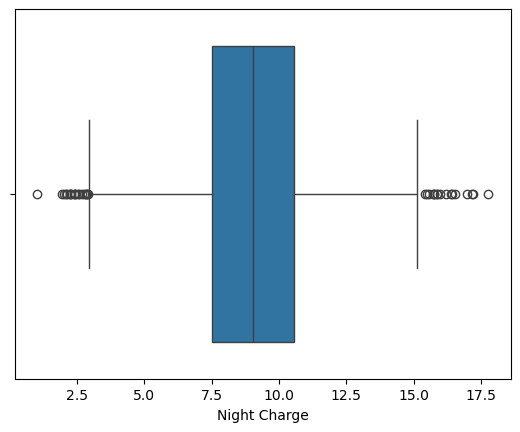

In [240]:
sns.boxplot(x='Night Charge',data=data)
plt.show()

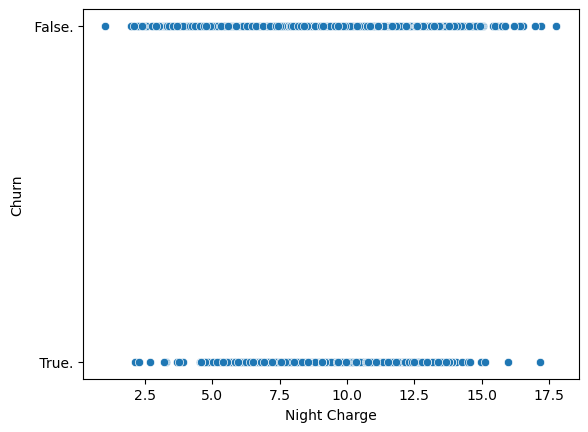

In [241]:
sns.scatterplot(x='Night Charge',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot in night Charge outliers are less than equal to 2.0 of 2 no's
* 2.night Charge greater than equal to 17.0 of 3 no's.

In [242]:
data.loc[data['Night Charge']<2.0,'Night Charge'].value_counts() ## there are 2 no's.

Night Charge
1.97    1
1.04    1
Name: count, dtype: int64

In [243]:
data.loc[data['Night Charge']>17.0,'Night Charge'].value_counts() ## there are 3 no's.

Night Charge
17.19    1
17.77    1
17.17    1
Name: count, dtype: int64

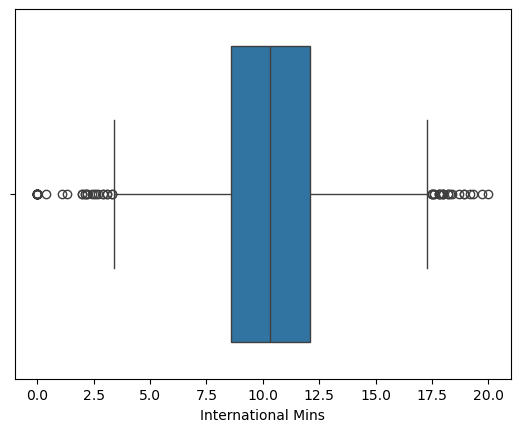

In [244]:
sns.boxplot(x='International Mins',data=data)
plt.show()

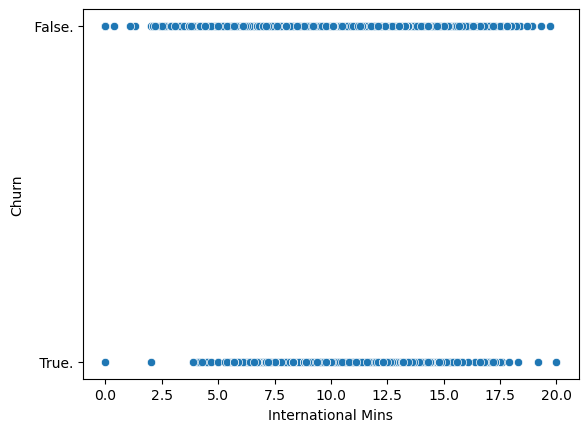

In [245]:
sns.scatterplot(x='International Mins',y='Churn',data=data)
plt.show()

## Insights :
* 1. based on boxplot and scatterplot Internatonal Mins less than equal to zero is 23 nos .so i didnot consider the outliers this points.because more points here.
* 2. International Mins Greater than 19.0 for 4 no's are consider the outliers.

In [246]:
data.loc[data['International Mins']>19.0,'International Mins'].value_counts() ## there are 4 no's.

International Mins
20.0    1
19.3    1
19.2    1
19.7    1
Name: count, dtype: int64

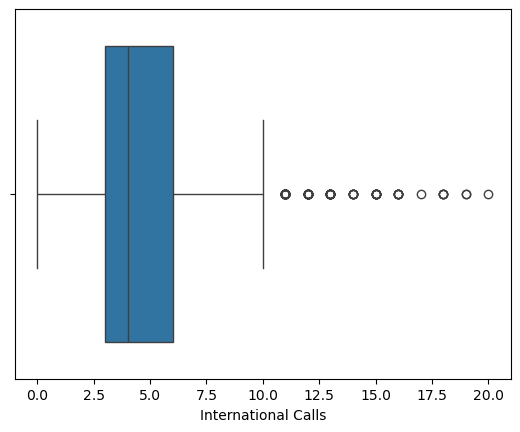

In [247]:
sns.boxplot(x='International Calls',data=data)
plt.show()

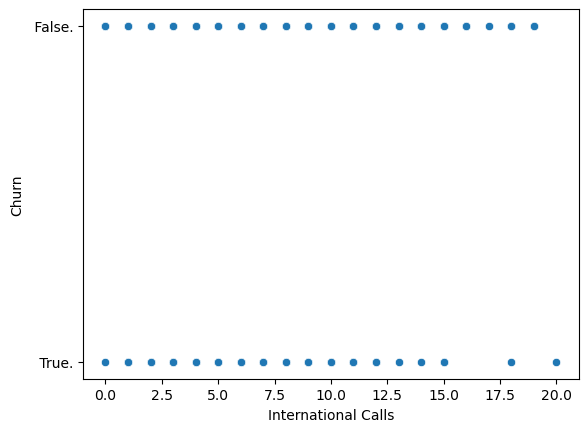

In [248]:
sns.scatterplot(x='International Calls',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot International calls less than equal to zero is 23 no's.so. i didn't consider the outliers.
* 2.International calls greater than equal to 19.0 for 1 no's.

In [249]:
data.loc[data['International Calls']>19.0,'International Calls'].value_counts() ## there are 1 no's.

International Calls
20    1
Name: count, dtype: int64

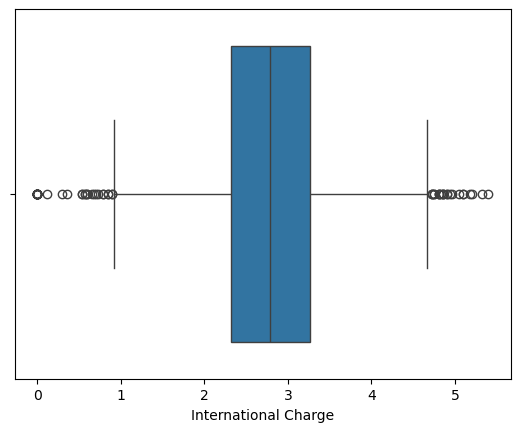

In [250]:
sns.boxplot(x='International Charge',data=data)
plt.show()

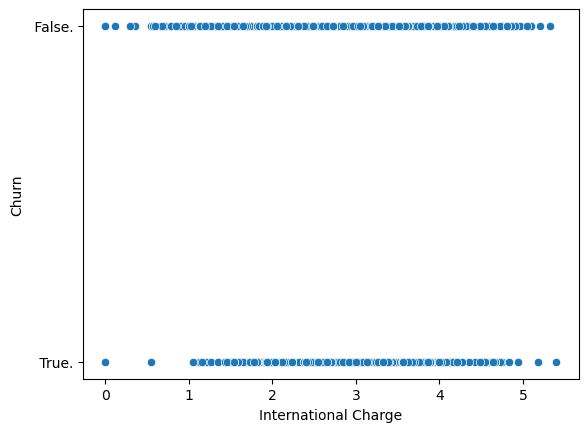

In [251]:
sns.scatterplot(x='International Charge',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot International Charge is equal to zero for 23 no's didn't consider the outliers.
* 2.International Charge is greater than 5.0 for 7 no's are outliers.

In [252]:
data.loc[data['International Charge']>5.0,'International Charge'].value_counts() ## there are 7 no's.

International Charge
5.10    2
5.40    1
5.05    1
5.21    1
5.18    1
5.32    1
Name: count, dtype: int64

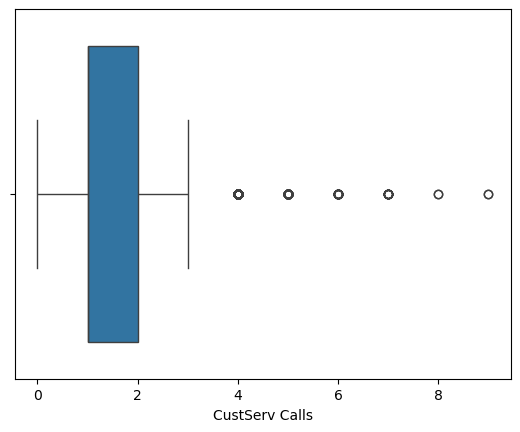

In [253]:
sns.boxplot(x='CustServ Calls',data=data)
plt.show()

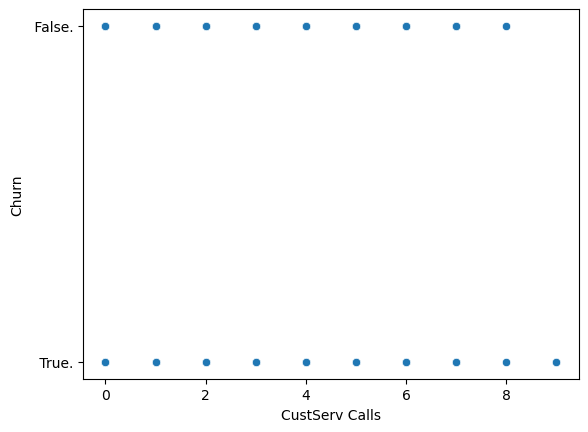

In [254]:
sns.scatterplot(x='CustServ Calls',y='Churn',data=data)
plt.show()

## Insights :
* 1.based on the boxplot and scatterplot CustServ Calls is greater than 8.0 for 4 no's consider the outliers.

In [255]:
data.loc[data['CustServ Calls']>=8.0,'CustServ Calls'].value_counts() ## there are 4 no's.

CustServ Calls
9    2
8    2
Name: count, dtype: int64

## Outliers are convert to np.NaN :

In [7]:
data.loc[data['Day Calls']==0,'Day Calls']=np.nan ## there are 2 no's outlier.

In [8]:
data.loc[data['Day Calls']>160,'Day Calls']=np.nan ## there are 2 no's outlier.

In [9]:
data.loc[data['Eve Mins']==0,'Eve Mins']=np.nan ## there are 1 no's outlier.

In [10]:
data.loc[data['Eve Mins']>355,'Eve Mins']=np.nan ## there are 2 no's outlier.

In [11]:
data.loc[data['Eve Calls']<25,'Eve Calls']=np.nan ## there are 3 nos outlier.

In [12]:
data.loc[data['Eve Calls']>165,'Eve Calls']=np.nan ## there are 3 no's outlier.

In [13]:
data.loc[data['Eve Charge']==0,'Eve Charge']=np.nan ## there are 1 nos outlier.

In [14]:
data.loc[data['Eve Charge']>30,'Eve Charge']=np.nan ## there are 3 no's outlier.

In [15]:
data.loc[data['Night Mins']<45,'Night Mins']=np.nan ## there are 2 no's outlier.

In [16]:
data.loc[data['Night Mins']>380,'Night Mins']=np.nan ## there are 3 no's outlier.

In [17]:
data.loc[data['Night Calls']<30,'Night Calls']=np.nan ## there are 1 no's outlier.

In [18]:
data.loc[data['Night Calls']>170,'Night Calls']=np.nan ## there are 1 nos's outlier.

In [19]:
data.loc[data['Night Charge']<2.0,'Night Charge']=np.nan ## there are 2 no's outlier.

In [20]:
data.loc[data['Night Charge']>17.0,'Night Charge']=np.nan ## there are 3 no's outlier.

In [21]:
data.loc[data['International Mins']>19.0,'International Mins']=np.nan ## there are 4 no's outlier.

In [22]:
data.loc[data['International Calls']>19.0,'International Calls']=np.nan ## there are 1 no's outlier.

In [23]:
data.loc[data['International Charge']>5.0,'International Charge']=np.nan ## there are 7 no's outlier.

In [24]:
data.loc[data['CustServ Calls']>=8.0,'CustServ Calls']=np.nan ## there are 4 no's outlier.

In [25]:
data.isnull().sum()

State                   0
Account Length          0
Area Code               0
Phone                   0
International Plan      0
VMail Plan              0
VMail Message           0
Day Mins                0
Day Calls               4
Day Charge              0
Eve Mins                3
Eve Calls               5
Eve Charge              4
Night Mins              5
Night Calls             2
Night Charge            5
International Mins      4
International Calls     1
International Charge    7
CustServ Calls          4
Churn                   0
dtype: int64

* we have handle the outliers 50 nos.

In [275]:
len(data.Phone.unique()) ##Phone features 4617 nos unique values.This 4617 nos are total rows in this datasets.

4617

In [276]:
len(data['State'].unique())

51

In [277]:
data['Account Length'].unique()## 218 nos unique values.

array([128, 107, 137,  84,  75, 118, 121, 147, 117, 141,  65,  74, 168,
        95,  62, 161,  85,  93,  76,  73,  77, 130, 111, 132, 174,  57,
        54,  20,  49, 142, 172,  12,  72,  36,  78, 136, 149,  98, 135,
        34, 160,  64,  59, 119,  97,  52,  60,  10,  96,  87,  81,  68,
       125, 116,  38,  40,  43, 113, 126, 150, 138, 162,  90,  50,  82,
       144,  46,  70,  55, 106,  94, 155,  80, 104,  99, 120, 108, 122,
       157, 103,  63, 112,  41, 193,  61,  92, 131, 163,  91, 127, 110,
       140,  83, 145,  56, 151, 139,   6, 115, 146, 185, 148,  32,  25,
       179,  67,  19, 170, 164,  51, 208,  53, 105,  66,  86,  35,  88,
       123,  45, 100, 215,  22,  33, 114,  24, 101, 143,  48,  71, 167,
        89, 199, 166, 158, 196, 209,  16,  39, 173, 129,  44,  79,  31,
       124,  37, 159, 194, 154,  21, 133, 224,  58,  11, 109, 102, 165,
        18,  30, 176,  47, 190, 152,  26,  69, 186, 171,  28, 153, 169,
        13,  27,   3,  42, 189, 156, 134, 243,  23,   1, 205, 20

In [278]:
len(data['Account Length'].unique())

218

In [279]:
data['VMail Message'].unique() ## 47 nos unique values.

array([25, 26,  0, 24, 37, 27, 33, 39, 30, 41, 28, 34, 46, 29, 35, 21, 32,
       42, 36, 22, 23, 43, 31, 38, 40, 48, 18, 17, 45, 16, 20, 14, 19, 51,
       15, 11, 12, 47,  8, 44, 49,  4, 10, 13, 50,  9,  6], dtype=int64)

In [280]:
len(data['VMail Message'].unique())

47

* account length features are unique value of 218 no's.So delete that features.
* vmail message features are unique value of 47 no's.So delete that features.

In [281]:
data.drop(['Phone'],axis=1,inplace=True)
## Phone features are unique value of 4617 no's.So delete that features.

In [282]:
data.sample(3)

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
2096,KS,94,510,no,yes,28,233.2,88.0,39.64,113.3,102.0,9.63,118.0,71.0,5.31,16.1,4.0,4.35,0.0,False.
3228,OR,27,510,no,no,0,232.1,81.0,39.46,210.8,101.0,17.92,165.4,87.0,7.44,15.0,6.0,4.05,5.0,False.
2930,SC,124,415,no,no,0,160.9,109.0,27.35,144.2,152.0,12.26,120.4,97.0,5.42,12.9,12.0,3.48,1.0,False.


## Data Cleaning :
### Removing duplicates :
*  zero duplicate values.
### Removing irrelevant data:
*  Phone features are removed from the datasets 1467 nos unique values.
### Handle missing values:
*  In this datasets missing values are nil.

## Feature Engineering :


In [283]:
enc=OneHotEncoder(drop='first',sparse_output=False)
enc_1=LabelEncoder()

In [284]:
data['State']=enc_1.fit_transform(data[['State']]) ## 51 no's unique value.so we have use the label Encoder.
data['International Plan']=enc.fit_transform(data[['International Plan']])
data['VMail Plan']=enc.fit_transform(data[['VMail Plan']])
data['Churn']=enc_1.fit_transform(data[['Churn']]) ## this is binary classification .so we have use the label Encoder.

## Insights :
* state features are unique value of 51 no's.So delete that features.

In [285]:
data.sample(5)

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
1061,28,132,415,0.0,1.0,31,174.5,101.0,29.67,245.6,105.0,20.88,172.8,76.0,7.78,10.3,9.0,2.78,1.0,0
1317,29,89,415,0.0,1.0,29,163.5,80.0,27.80,274.8,136.0,23.36,NaN,147.0,NaN,7.5,5.0,2.03,2.0,0
1622,16,117,415,0.0,0.0,0,184.8,83.0,31.42,248.6,101.0,21.13,133.1,113.0,5.99,9.6,8.0,2.59,1.0,0
1473,14,86,415,1.0,0.0,0,266.1,120.0,45.24,182.0,92.0,15.47,206.5,103.0,9.29,10.3,4.0,2.78,1.0,0
2492,40,73,415,0.0,0.0,0,203.3,45.0,34.56,141.9,87.0,12.06,200.7,71.0,9.03,8.5,6.0,2.30,0.0,0


## Imputation  for the np.nan values :

In [286]:
impute=KNNImputer()

In [287]:
df=impute.fit_transform(data)
df

array([[ 16.  , 128.  , 415.  , ...,   2.7 ,   1.  ,   0.  ],
       [ 35.  , 107.  , 415.  , ...,   3.7 ,   1.  ,   0.  ],
       [ 31.  , 137.  , 415.  , ...,   3.29,   0.  ,   0.  ],
       ...,
       [ 46.  ,  67.  , 408.  , ...,   3.51,   1.  ,   0.  ],
       [ 22.  ,  98.  , 415.  , ...,   3.86,   0.  ,   0.  ],
       [ 15.  , 140.  , 415.  , ...,   3.27,   2.  ,   0.  ]])

In [288]:
df1=pd.DataFrame(df,columns=data.columns)

In [289]:
df1.head()

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
0,16.0,128.0,415.0,0.0,1.0,25.0,265.1,110.0,45.07,197.4,99.0,16.78,244.7,91.0,11.01,10.0,3.0,2.70,1.0,0.0
1,35.0,107.0,415.0,0.0,1.0,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,0.0
2,31.0,137.0,415.0,0.0,0.0,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,0.0
3,35.0,84.0,408.0,1.0,0.0,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,0.0
4,36.0,75.0,415.0,1.0,0.0,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,0.0


In [290]:
df1.isnull().sum()

State                   0
Account Length          0
Area Code               0
International Plan      0
VMail Plan              0
VMail Message           0
Day Mins                0
Day Calls               0
Day Charge              0
Eve Mins                0
Eve Calls               0
Eve Charge              0
Night Mins              0
Night Calls             0
Night Charge            0
International Mins      0
International Calls     0
International Charge    0
CustServ Calls          0
Churn                   0
dtype: int64

In [291]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   float64
 1   Account Length        4617 non-null   float64
 2   Area Code             4617 non-null   float64
 3   International Plan    4617 non-null   float64
 4   VMail Plan            4617 non-null   float64
 5   VMail Message         4617 non-null   float64
 6   Day Mins              4617 non-null   float64
 7   Day Calls             4617 non-null   float64
 8   Day Charge            4617 non-null   float64
 9   Eve Mins              4617 non-null   float64
 10  Eve Calls             4617 non-null   float64
 11  Eve Charge            4617 non-null   float64
 12  Night Mins            4617 non-null   float64
 13  Night Calls           4617 non-null   float64
 14  Night Charge          4617 non-null   float64
 15  International Mins   

## After Imputation to be check the box plot and distributions :

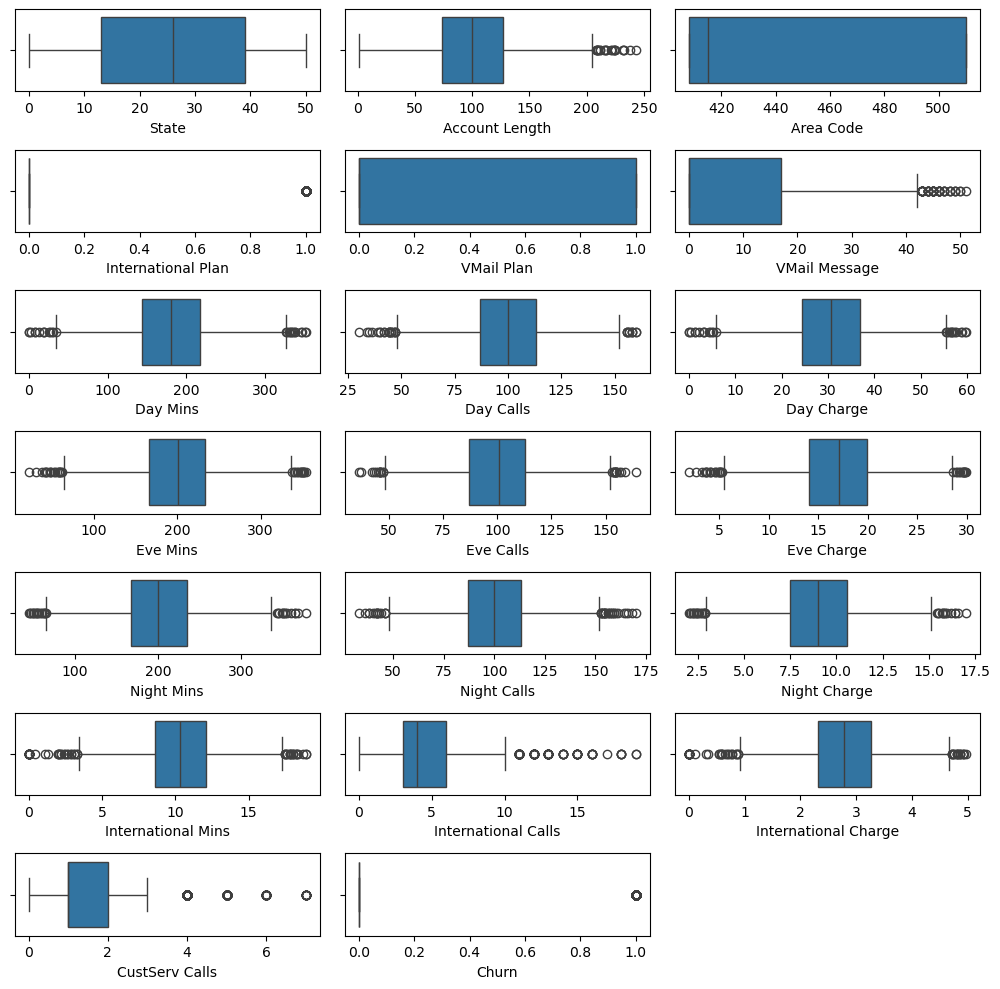

In [292]:
plt.figure(figsize=(10,10))
plotnumber=1
for i in df1.columns:
    plt.subplot(7,3,plotnumber)
    sns.boxplot(x=i,data=df1)
    plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()

## Insights :
* Almost all features handle the outliers.this plot after imputation of np.nan.

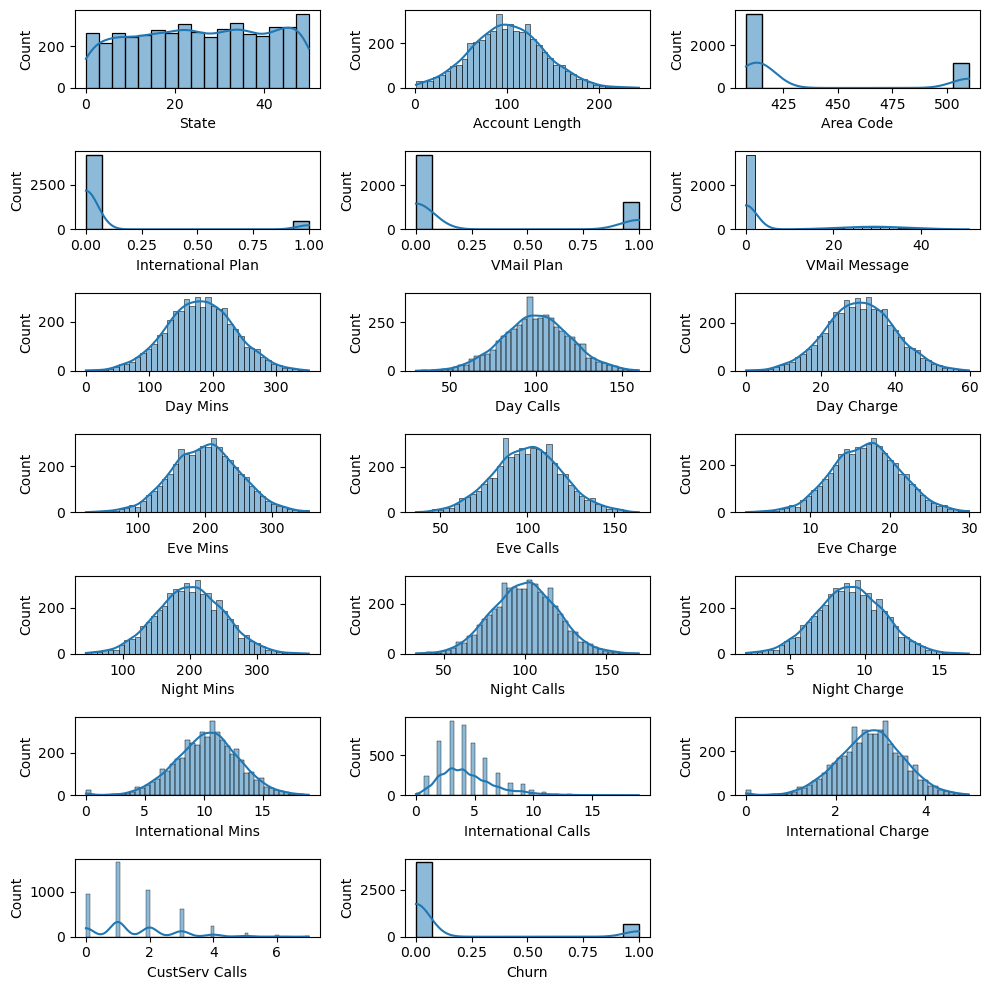

In [293]:
plt.figure(figsize=(10,10))
plotnumber=1
for i in data.columns:
    plt.subplot(7,3,plotnumber)
    sns.histplot(x=i,data=df1,kde=True)
    plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()

## Insights :
* This features are almost normal distributions like Day mins,day calls,day charge,eve mins,eve calls,eve charge,night mins,night calls,night charge,international mins,international charge.

## Correleations :

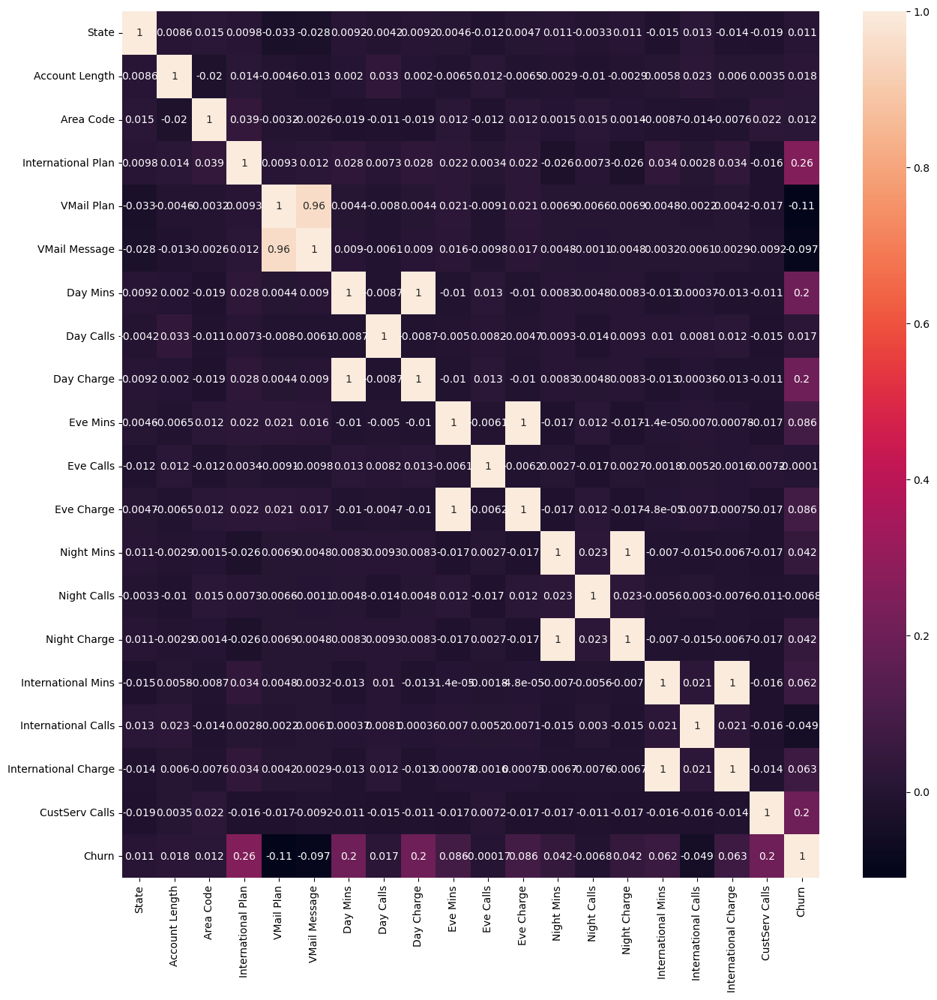

In [294]:
plt.figure(figsize=(15,15),dpi=100)
sns.heatmap(df1.corr(),annot=True)
plt.show()

## Insights :
* State,Account Length,Area Code features are low correlation compare to churn features for below 3 %.so we will drop it.
* Due to Correleations two features are time high.so we will drop it one features.

In [295]:
df1.corr()

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International Calls,International Charge,CustServ Calls,Churn
State,1.000000,0.008638,0.015370,0.009789,-0.033323,-0.028491,0.009172,-0.004243,0.009173,0.004618,-0.012048,0.004668,0.011151,-0.003321,0.011139,-0.015356,0.012874,-0.013506,-0.018546,0.010979
Account Length,0.008638,1.000000,-0.020394,0.013948,-0.004602,-0.012983,0.002002,0.033464,0.001999,-0.006483,0.012416,-0.006486,-0.002917,-0.010460,-0.002934,0.005755,0.022988,0.005972,0.003452,0.018046
Area Code,0.015370,-0.020394,1.000000,0.039263,-0.003150,-0.002597,-0.018900,-0.010738,-0.018903,0.011728,-0.011587,0.011824,0.001452,0.015037,0.001441,-0.008732,-0.013811,-0.007626,0.021729,0.011995
International Plan,0.009789,0.013948,0.039263,1.000000,0.009278,0.011596,0.028220,0.007291,0.028223,0.021936,0.003416,0.021990,-0.025757,0.007318,-0.025765,0.033610,0.002793,0.034322,-0.015534,0.257524
VMail Plan,-0.033323,-0.004602,-0.003150,0.009278,1.000000,0.955280,0.004444,-0.007958,0.004441,0.020568,-0.009104,0.020663,0.006906,0.006587,0.006900,0.004767,-0.002181,0.004240,-0.016973,-0.110149
VMail Message,-0.028491,-0.012983,-0.002597,0.011596,0.955280,1.000000,0.009028,-0.006104,0.009025,0.016497,-0.009770,0.016589,0.004819,-0.001141,0.004811,0.003220,0.006110,0.002897,-0.009171,-0.096884
Day Mins,0.009172,0.002002,-0.018900,0.028220,0.004444,0.009028,1.000000,-0.008748,1.000000,-0.010250,0.013464,-0.010132,0.008276,0.004823,0.008263,-0.013153,0.000366,-0.012858,-0.010545,0.202439
Day Calls,-0.004243,0.033464,-0.010738,0.007291,-0.007958,-0.006104,-0.008748,1.000000,-0.008746,-0.004966,0.008177,-0.004659,0.009274,-0.013625,0.009270,0.010211,0.008052,0.011834,-0.014965,0.016674
Day Charge,0.009173,0.001999,-0.018903,0.028223,0.004441,0.009025,1.000000,-0.008746,1.000000,-0.010245,0.013465,-0.010127,0.008278,0.004821,0.008265,-0.013156,0.000363,-0.012860,-0.010552,0.202434
Eve Mins,0.004618,-0.006483,0.011728,0.021936,0.020568,0.016497,-0.010250,-0.004966,-0.010245,1.000000,-0.006070,0.999956,-0.016981,0.011670,-0.016991,-0.000014,0.007045,0.000781,-0.017179,0.085792


In [296]:
df1.drop(['State','Account Length','Area Code'],axis=1,inplace=True)
## This features are low correlation compare to churn features for below 3 %.so we will drop it.

In [297]:
df1.drop(['VMail Message','Day Mins','Eve Mins','Night Mins','International Mins'],axis=1,inplace=True)
## Due to Correleation are double time high.so we will drop it.

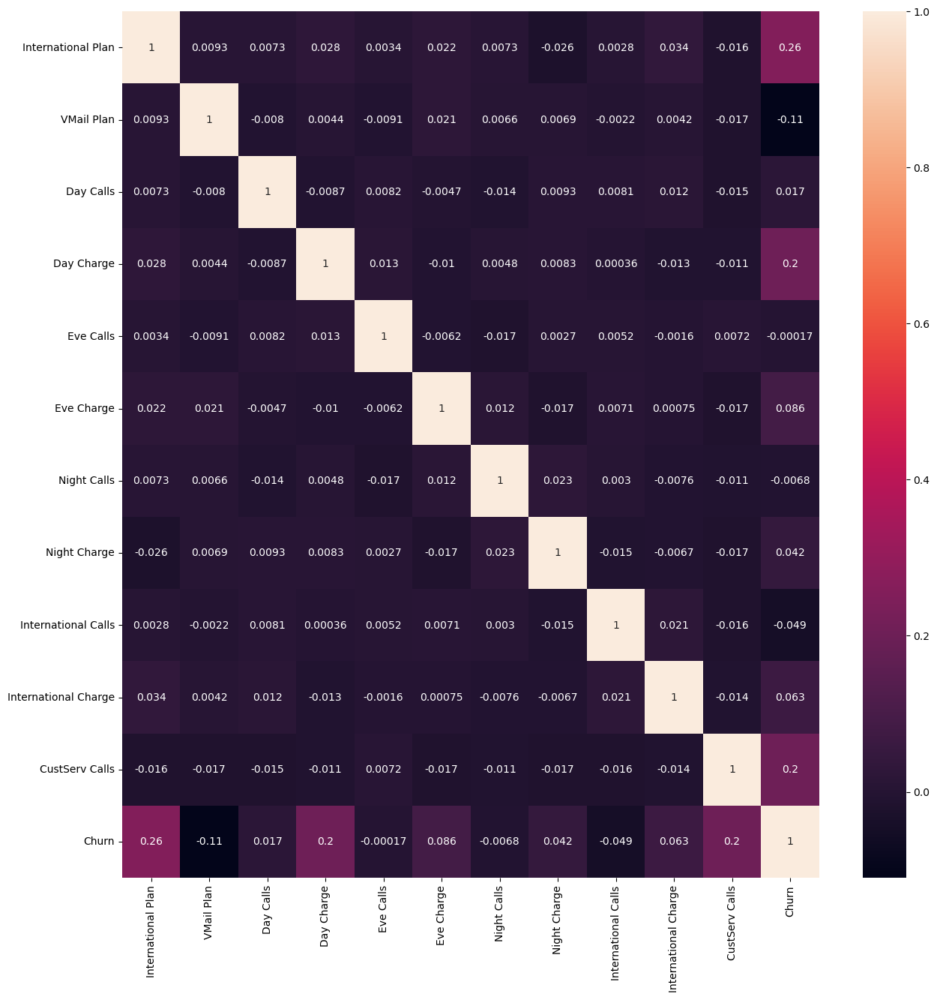

In [298]:
plt.figure(figsize=(15,15),dpi=100)
sns.heatmap(df1.corr(),annot=True)
plt.show()

## insights :
* Unnecessary features drop it.finally,our necessary fetaures visualized.

## Feature Scaling :

In [299]:
scaling=MinMaxScaler() ## Use Assume the our features are Non-Normal distribution.
scaling_1=StandardScaler() ## Use Assume the our features are Normal distribution.

In [300]:
## Non nornmal distributions features are International Plan , VMail Plan, CustServ Calls.
## So use the MinMax Scalar.

In [301]:
df1['International Plan']=scaling.fit_transform(df1[['International Plan']]) # this is not normal distributions.
df1['VMail Plan']=scaling.fit_transform(df1[['VMail Plan']]) # this is not normal distributions.
df1['CustServ Calls']=scaling.fit_transform(df1[['CustServ Calls']]) # this is not normal distributions.
df1['Day Calls']=scaling_1.fit_transform(df1[['Day Calls']]) 
df1['Day Charge']=scaling_1.fit_transform(df1[['Day Charge']])
df1['Eve Calls']=scaling_1.fit_transform(df1[['Eve Calls']])
df1['Eve Charge']=scaling_1.fit_transform(df1[['Eve Charge']])
df1['Night Calls']=scaling_1.fit_transform(df1[['Night Calls']])
df1['Night Charge']=scaling_1.fit_transform(df1[['Night Charge']])
df1['International Calls']=scaling_1.fit_transform(df1[['International Calls']])
df1['International Charge']=scaling_1.fit_transform(df1[['International Charge']])

## Insights :
* International Plan, VMail Plan, CustServ Calls features are not normal distributions.so we have used MinMax Scalar.
* Day calls,day charge,eve calls,eve charge,night calls,night charge,international calls,international charge features are close  to normal distributions.so we have used Standard Scalar.

In [302]:
df1.head()

,International Plan,VMail Plan,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Calls,International Charge,CustServ Calls,Churn
0,0.0,1.0,0.503350,1.568569,-0.059974,-0.059711,-0.450643,0.878408,-0.584738,-0.098174,0.142857,0.0
1,0.0,1.0,1.162255,-0.349447,0.143643,-0.097104,0.153562,1.073181,-0.584738,1.255897,0.142857,0.0
2,0.0,0.0,0.706090,1.166439,0.499971,-1.574133,0.203912,-0.755030,0.232695,0.700728,0.000000,0.0
3,1.0,0.0,-1.473364,2.203911,-0.619918,-2.752018,-0.551344,-0.073324,1.050127,-1.343920,0.285714,0.0
4,1.0,0.0,0.655405,-0.254636,1.110820,-1.034270,1.059869,-0.272524,-0.584738,-0.057552,0.428571,0.0


In [303]:
df1.sample()

,International Plan,VMail Plan,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Calls,International Charge,CustServ Calls,Churn
2323,0.0,0.0,-0.814459,-0.278611,0.347259,0.064154,-1.759754,0.024062,-1.40217,-0.761669,0.142857,0.0


## Split the datasets :

In [304]:
X=df1.loc[:,:'CustServ Calls']

In [305]:
y=df1['Churn']

In [306]:
X.head(5)

,International Plan,VMail Plan,Day Calls,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,International Calls,International Charge,CustServ Calls
0,0.0,1.0,0.503350,1.568569,-0.059974,-0.059711,-0.450643,0.878408,-0.584738,-0.098174,0.142857
1,0.0,1.0,1.162255,-0.349447,0.143643,-0.097104,0.153562,1.073181,-0.584738,1.255897,0.142857
2,0.0,0.0,0.706090,1.166439,0.499971,-1.574133,0.203912,-0.755030,0.232695,0.700728,0.000000
3,1.0,0.0,-1.473364,2.203911,-0.619918,-2.752018,-0.551344,-0.073324,1.050127,-1.343920,0.285714
4,1.0,0.0,0.655405,-0.254636,1.110820,-1.034270,1.059869,-0.272524,-0.584738,-0.057552,0.428571


In [307]:
y.head(5)

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Churn, dtype: float64

In [308]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [309]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3693, 11)
(924, 11)
(3693,)
(924,)


## Train the Model :

In [310]:
y_train.value_counts()

Churn
0.0    3162
1.0     531
Name: count, dtype: int64

## Insights :
* y_train data's are imbalanced class labels.we have use smote methods.

##  Output features are Imbalanced datasets :

In [311]:
from imblearn.over_sampling import SMOTE

In [312]:
imbal=SMOTE(random_state=42)

In [313]:
x_train_smote,y_train_smote=imbal.fit_resample(X_train,y_train)


In [314]:
y_train_smote.value_counts()

Churn
1.0    3162
0.0    3162
Name: count, dtype: int64

## Polynominal Features to use Logistic Regression learn  Non-Linearity data:

In [315]:
from sklearn.preprocessing import PolynomialFeatures

In [316]:
poly=PolynomialFeatures(degree=3)

In [317]:
poly_x_train=poly.fit_transform(x_train_smote)
poly_x_test=poly.fit_transform(X_test)

## Insights:
* Churn datasets are non linearity data's.so we have Polynomial features used for linear models to learned the non-linearity.

## Logistic Regression :

In [318]:
lo=LogisticRegression(class_weight='balanced',random_state=42)
lo_pre=lo.fit(poly_x_train,y_train_smote)
lo

LogisticRegression(class_weight='balanced', random_state=42)

In [319]:
y_pred_lo=lo_pre.predict(poly_x_test)
y_pred_lo

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 1., 1., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [320]:
f1_logistic=f1_score(y_test,y_pred_lo)
print(f'f1_logistic -',f1_logistic)

f1_logistic - 0.5906040268456375


In [321]:
roc_auc_logistic=roc_auc_score(y_test,y_pred_lo)
print(f'roc_auc_logistic -',roc_auc_logistic)

roc_auc_logistic - 0.7988085106382978


In [322]:
print(classification_report(y_test,y_pred_lo))

              precision    recall  f1-score   support

         0.0       0.95      0.89      0.92       799
         1.0       0.51      0.70      0.59       125

    accuracy                           0.87       924
   macro avg       0.73      0.80      0.76       924
weighted avg       0.89      0.87      0.88       924



### Interpreting the Metrics Logistic Regression:
* Precision (Class A): 0.95 → 95% of predictions for Class A are correct.
* Recall (Class A): 0.89 → 89% of actual Class A instances are correctly identified.
* Precision (Class B): 0.51 → 51% of predictions for Class B are correct.
* Recall (Class B): 0.70 → 70% of actual Class B instances are correctly identified.

In [323]:
pd.crosstab(y_test,y_pred_lo)

col_0,0.0,1.0
Churn,,
0.0,714,85
1.0,37,88


In [324]:
accuracy_logistic_test=accuracy_score(y_test,y_pred_lo)
print(f'accuracy_logistic_test -',accuracy_logistic_test)

accuracy_logistic_test - 0.8679653679653679


## Logistic train data accuracy score :

In [325]:
y_pred_lo_train=lo_pre.predict(poly_x_train)
y_pred_lo_train

array([1., 0., 0., ..., 1., 1., 1.])

In [326]:
accuracy_logistic_train=accuracy_score(y_train_smote,y_pred_lo_train)
print(f'accuracy_logistic_train -',accuracy_logistic_train)

accuracy_logistic_train - 0.926944971537002


## Logistic Regression Hyper Parameter Tuning :

In [327]:
params_logistic={'penalty':['l1', 'l2', 'elasticnet'],
                'solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
                'max_iter':list(range(50)),
                 'multi_class':['auto', 'ovr', 'multinomial'],
                 'C':[1.0,2.0,3.0,4.0,5.0,6.0]
                }

In [328]:
grid_logistic=RandomizedSearchCV(lo,param_distributions=params_logistic,verbose=1,cv=3,scoring='f1')
grid_logistic.fit(x_train_smote,y_train_smote)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3,
                   estimator=LogisticRegression(class_weight='balanced',
                                                random_state=42),
                   param_distributions={'C': [1.0, 2.0, 3.0, 4.0, 5.0, 6.0],
                                        'max_iter': [0, 1, 2, 3, 4, 5, 6, 7, 8,
                                                     9, 10, 11, 12, 13, 14, 15,
                                                     16, 17, 18, 19, 20, 21, 22,
                                                     23, 24, 25, 26, 27, 28, 29, ...],
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['lbfgs', 'liblinear',
                                                   'newton-cg',
                                                   'newton-cholesky', 'sag',
                                                   'saga']},
                   scoring='f1', verbose=1)

In [329]:
grid_logistic.best_params_

{'solver': 'newton-cholesky',
 'penalty': 'l2',
 'multi_class': 'auto',
 'max_iter': 8,
 'C': 6.0}

## Insights :
* This parameters are not give the best f1_score.so we have manually give the some parameters.

In [330]:
logistic_hyper=LogisticRegression(solver='liblinear',penalty='l1',C=6.0,multi_class='ovr',class_weight='balanced',random_state=42)
logistic_hyper.fit(poly_x_train,y_train_smote)

LogisticRegression(C=6.0, class_weight='balanced', multi_class='ovr',
                   penalty='l1', random_state=42, solver='liblinear')

In [331]:
y_pred_logistic_hyper=logistic_hyper.predict(poly_x_test)
y_pred_logistic_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [332]:
f1_logistic_hyper=f1_score(y_test,y_pred_logistic_hyper)
print(f'f1_logistic_hyper -',f1_logistic_hyper)

f1_logistic_hyper - 0.6501766784452296


In [333]:
accuracy_logistic_hyper=accuracy_score(y_test,y_pred_logistic_hyper)
print(f'accuracy_logistic_hyper -',accuracy_logistic_hyper)

accuracy_logistic_hyper - 0.8928571428571429


In [334]:
roc_auc_logistic_hyper=roc_auc_score(y_test,y_pred_logistic_hyper)
print(f'roc_auc_logistic_hyper -',roc_auc_logistic_hyper)

roc_auc_logistic_hyper - 0.8266983729662077


In [335]:
pd.crosstab(y_test,y_pred_logistic_hyper)

col_0,0.0,1.0
Churn,,
0.0,733,66
1.0,33,92


In [336]:
print(classification_report(y_test,y_pred_logistic_hyper))

              precision    recall  f1-score   support

         0.0       0.96      0.92      0.94       799
         1.0       0.58      0.74      0.65       125

    accuracy                           0.89       924
   macro avg       0.77      0.83      0.79       924
weighted avg       0.91      0.89      0.90       924



### Interpreting the Metrics Logistic regression - hyper tuning:
* Precision (Class A): 0.96 → 96% of predictions for Class A are correct.
* Recall (Class A): 0.92 → 92% of actual Class A instances are correctly identified.
* Precision (Class B): 0.58 → 58% of predictions for Class B are correct.
* Recall (Class B): 0.74 → 74% of actual Class B instances are correctly identified.

## Random Forest Classifier Algorithms :

In [337]:
from sklearn.ensemble import RandomForestClassifier

In [338]:
random=RandomForestClassifier(random_state=42)
re=random.fit(x_train_smote,y_train_smote)
re

RandomForestClassifier(random_state=42)

In [340]:
y_pred_random=re.predict(X_test)
y_pred_random

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [341]:
f1_random=f1_score(y_test,y_pred_random)
print(f'f1_random -',f1_random)

f1_random - 0.8065843621399177


In [342]:
roc_auc_random=roc_auc_score(y_test,y_pred_random)
print(f'roc_auc_random -',roc_auc_random)

roc_auc_random - 0.8794843554443055


In [343]:
print(classification_report(y_test,y_pred_random))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       799
         1.0       0.83      0.78      0.81       125

    accuracy                           0.95       924
   macro avg       0.90      0.88      0.89       924
weighted avg       0.95      0.95      0.95       924



### Interpreting the Metrics Random Forest :
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.97 → 97% of actual Class A instances are correctly identified.
* Precision (Class B): 0.83 → 83% of predictions for Class B are correct.
* Recall (Class B): 0.78 → 78% of actual Class B instances are correctly identified.

In [344]:
pd.crosstab(y_test,y_pred_random)

col_0,0.0,1.0
Churn,,
0.0,779,20
1.0,27,98


In [345]:
accuracy_random_test=accuracy_score(y_test,y_pred_random)
print(f'accuracy_random_test -',accuracy_random_test)

accuracy_random_test - 0.9491341991341992


## Random Forest train data accuracy :

In [346]:
y_pred_random_train=re.predict(x_train_smote)
y_pred_random

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [347]:
accuracy_random_train=accuracy_score(y_train_smote,y_pred_random_train)
print(f'accuracy_random_train -',accuracy_random_train)

accuracy_random_train - 1.0


# Random Forest Hyper Parameter Tuning :

In [ ]:
params_random={'criterion':['gini','entropy'],
                      'max_depth':list(range(1,15)),
                      'min_samples_split':list(range(1,15)),
                      'min_samples_leaf':list(range(1,15))
                      }

In [ ]:
grid_random=RandomizedSearchCV(random,params_random,verbose=1,cv=3,scoring='f1')
grid_random_hyper=grid_random.fit(x_train_smote,y_train_smote)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


In [ ]:
grid_random_hyper.best_params_

{'min_samples_split': 2,
 'min_samples_leaf': 4,
 'max_depth': 12,
 'criterion': 'entropy'}

In [77]:
random_hyper=RandomForestClassifier(min_samples_split=2,min_samples_leaf=4,max_depth=12,criterion='entropy',random_state=42)
random_hyper.fit(x_train_smote,y_train_smote)

RandomForestClassifier(criterion='entropy', max_depth=12, min_samples_leaf=4,
                       random_state=42)

In [78]:
y_pred_random_hyper=random_hyper.predict(X_test)
y_pred_random_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [182]:
f1_random_hyper=f1_score(y_test,y_pred_random_hyper)
print(f'f1_random_hyper -',f1_random_hyper)

f1_random_hyper - 0.8048780487804879


In [183]:
accuracy_random_hyper=accuracy_score(y_test,y_pred_random_hyper)
print(f'accuracy_random_hyper -',accuracy_random_hyper)

accuracy_random_hyper - 0.948051948051948


In [184]:
roc_auc_random_hyper=roc_auc_score(y_test,y_pred_random_hyper)
print(f'roc_auc_random_hyper -',roc_auc_random_hyper)

roc_auc_random_hyper - 0.8822327909887359


In [ ]:
pd.crosstab(y_test,y_pred_random_hyper)

col_0,0.0,1.0
Churn,,
0.0,777,22
1.0,26,99


In [ ]:
print(classification_report(y_test,y_pred_random_hyper))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       799
         1.0       0.82      0.79      0.80       125

    accuracy                           0.95       924
   macro avg       0.89      0.88      0.89       924
weighted avg       0.95      0.95      0.95       924



### Interpreting the Metrics Random forest - hyper tuning:
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.97 → 97% of actual Class A instances are correctly identified.
* Precision (Class B): 0.82 → 82% of predictions for Class B are correct.
* Recall (Class B): 0.79 → 79% of actual Class B instances are correctly identified.

## Gradient Boost Classifier Algorithms :

In [153]:
gra=GradientBoostingClassifier(random_state=42)
gradient=gra.fit(x_train_smote,y_train_smote)
gradient

GradientBoostingClassifier(random_state=42)

In [154]:
y_pred_gradient=gradient.predict(X_test)
y_pred_gradient

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [155]:
f1_gradient=f1_score(y_test,y_pred_gradient)
print(f'f1_gradient -',f1_gradient)

f1_gradient - 0.8016528925619835


In [156]:
roc_auc_gradient=roc_auc_score(y_test,y_pred_gradient)
print(f'roc_auc_gradient -',roc_auc_gradient)

roc_auc_gradient - 0.8754843554443055


In [157]:
print(classification_report(y_test,y_pred_gradient))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       799
         1.0       0.83      0.78      0.80       125

    accuracy                           0.95       924
   macro avg       0.90      0.88      0.89       924
weighted avg       0.95      0.95      0.95       924



### Interpreting the Metrics Gradient boosting:
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.97 → 97% of actual Class A instances are correctly identified.
* Precision (Class B): 0.83 → 83% of predictions for Class B are correct.
* Recall (Class B): 0.78 → 78% of actual Class B instances are correctly identified.

In [158]:
pd.crosstab(y_test,y_pred_gradient)

col_0,0.0,1.0
Churn,,
0.0,779,20
1.0,28,97


In [159]:
accuracy_gradient_test=accuracy_score(y_test,y_pred_gradient)
print(f'accuracy_gradient_test -',accuracy_gradient_test)

accuracy_gradient_test - 0.948051948051948


## Gradient Boost Classifier train data accuracy score :

In [160]:
y_pred_gradient_train=gradient.predict(x_train_smote)
y_pred_gradient_train

array([1., 0., 0., ..., 1., 1., 1.])

In [161]:
accuracy_gradient_train=accuracy_score(y_train_smote,y_pred_gradient_train)
print(f'accuracy_gradient_train -',accuracy_gradient_train)

accuracy_gradient_train - 0.9629981024667932


## Gradient Boosting Hyper Parameter Tuning :

In [ ]:
params_gradient={'min_samples_split':list(range(1,15)),
                'min_samples_leaf':list(range(1,15)),
                'max_depth':list(range(1,15))
                }

In [ ]:
grid_gradient=RandomizedSearchCV(gra,params_gradient,cv=5,verbose=1,scoring='f1')
grid_gradient.fit(x_train_smote,y_train_smote)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=42),
                   param_distributions={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14],
                                        'min_samples_split': [1, 2, 3, 4, 5, 6,
                                                              7, 8, 9, 10, 11,
                                                              12, 13, 14]},
                   scoring='f1', verbose=1)

In [ ]:
grid_gradient.best_params_

{'min_samples_split': 11, 'min_samples_leaf': 12, 'max_depth': 13}

In [87]:
gradient_hyper=GradientBoostingClassifier(min_samples_split=11,min_samples_leaf=12,max_depth=13,random_state=42)
gradient_hyper.fit(x_train_smote,y_train_smote)

GradientBoostingClassifier(max_depth=13, min_samples_leaf=12,
                           min_samples_split=11, random_state=42)

In [88]:
y_pred_gradient_hyper=gradient_hyper.predict(X_test)
y_pred_gradient_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [176]:
f1_gradient_hyper=f1_score(y_test,y_pred_gradient_hyper)
print(f'f1_gradient_hyper -',f1_gradient_hyper)

f1_gradient_hyper - 0.8571428571428571


In [177]:
accuracy_gradient_test_hyper=accuracy_score(y_test,y_pred_gradient_hyper)
print(f'accuracy_gradient_test_hyper -',accuracy_gradient_test_hyper)

accuracy_gradient_test_hyper - 0.9632034632034632


In [175]:
roc_auc_gradient_hyper=roc_auc_score(y_test,y_pred_gradient_hyper)
print(f'roc_auc_gradient_hyper -',roc_auc_gradient_hyper)

roc_auc_gradient_hyper - 0.9011163954943678


In [ ]:
pd.crosstab(y_test,y_pred_gradient_hyper)

col_0,0.0,1.0
Churn,,
0.0,788,11
1.0,23,102


In [ ]:
print(classification_report(y_test,y_pred_gradient_hyper))

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       799
         1.0       0.90      0.82      0.86       125

    accuracy                           0.96       924
   macro avg       0.94      0.90      0.92       924
weighted avg       0.96      0.96      0.96       924



### Interpreting the Metrics gradient boosting - hyper tuning:
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.99 → 99% of actual Class A instances are correctly identified.
* Precision (Class B): 0.90 → 90% of predictions for Class B are correct.
* Recall (Class B): 0.82 → 82% of actual Class B instances are correctly identified.

## Support Vector Machines (SVC) Algorithms :

In [101]:
from sklearn.svm import SVC

In [174]:
sv=SVC(random_state=42)
sv_1=sv.fit(poly_x_train,y_train_smote)
sv_1

SVC(random_state=42)

In [175]:
y_pred_svc=sv_1.predict(poly_x_test)
y_pred_svc

array([0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [176]:
f1_svc=f1_score(y_test,y_pred_svc)
print(f'f1_svc -',f1_svc)

f1_svc - 0.5509433962264151


In [177]:
roc_auc_svc=roc_auc_score(y_test,y_pred_svc)
print(f'roc_auc_svc -',roc_auc_svc)

roc_auc_svc - 0.750072590738423


In [178]:
print(classification_report(y_test,y_pred_svc))

              precision    recall  f1-score   support

         0.0       0.93      0.92      0.92       799
         1.0       0.52      0.58      0.55       125

    accuracy                           0.87       924
   macro avg       0.73      0.75      0.74       924
weighted avg       0.88      0.87      0.87       924



### Interpreting the Metrics SVC:
* Precision (Class A): 0.93 → 93% of predictions for Class A are correct.
* Recall (Class A): 0.92 → 92% of actual Class A instances are correctly identified.
* Precision (Class B): 0.52 → 52% of predictions for Class B are correct.
* Recall (Class B): 0.58 → 58% of actual Class B instances are correctly identified.

In [173]:
pd.crosstab(y_test,y_pred_svc)

col_0,0.0,1.0
Churn,,
0.0,732,67
1.0,36,89


In [179]:
accuracy_svc_test=accuracy_score(y_test,y_pred_svc)
print(f'accuracy_svc_test -',accuracy_svc_test)

accuracy_svc_test - 0.8712121212121212


## Support Vector Machines train data accuracy score :

In [180]:
y_pred_svc_train=sv_1.predict(poly_x_train)
y_pred_svc_train

array([1., 0., 0., ..., 1., 1., 1.])

In [181]:
accuracy_svc_train=accuracy_score(y_train_smote,y_pred_svc_train)
print(f'accuracy_svc_train -',accuracy_svc_train)

accuracy_svc_train - 0.9372232764073372


## Support Vector Machines Hyper Parameter Tuning :

In [ ]:
params_sv={'kernel':['linear', 'poly', 'rbf', 'sigmoid'],
          'gamma':['scale','auto'],
           'degree':list(range(5)),
           'C':[1.0,2.0,3.0,4.0,5.0]
          }

In [ ]:
grid_svc=RandomizedSearchCV(sv,params_sv,verbose=1,cv=3,scoring='f1')
grid_svc.fit(x_train_smote,y_train_smote)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=SVC(random_state=42),
                   param_distributions={'C': [1.0, 2.0, 3.0, 4.0, 5.0],
                                        'degree': [0, 1, 2, 3, 4],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   scoring='f1', verbose=1)

In [ ]:
grid_svc.best_params_

{'kernel': 'rbf', 'gamma': 'scale', 'degree': 2, 'C': 4.0}

## Insights :
* This parameters are not give the best f1_score.so we have manually give the some parameters.

In [102]:
svc_hyper=SVC(kernel='poly',gamma='scale',degree=2,C=4.0)
svc_hyper.fit(poly_x_train,y_train_smote)

SVC(C=4.0, degree=2, kernel='poly')

In [103]:
y_pred_svc_hyper=svc_hyper.predict(poly_x_test)
y_pred_svc_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 1., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [104]:
f1_svc_hyper=f1_score(y_test,y_pred_svc_hyper)
print(f'f1_svc_hyper -',f1_svc_hyper)

f1_svc_hyper - 0.5263157894736843


In [105]:
accuracy_svc_test_hyper=accuracy_score(y_test,y_pred_svc_hyper)
print(f'accuracy_svc_test_hyper -',accuracy_svc_test_hyper)

accuracy_svc_test_hyper - 0.8733766233766234


In [106]:
roc_auc_svc_hyper=roc_auc_score(y_test,y_pred_svc_hyper)
print(f'roc_auc_svc_hyper -',roc_auc_svc_hyper)

roc_auc_svc_hyper - 0.7243304130162703


In [107]:
pd.crosstab(y_test,y_pred_svc_hyper)

col_0,0.0,1.0
Churn,,
0.0,742,57
1.0,60,65


In [108]:
print(classification_report(y_test,y_pred_svc_hyper))

              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93       799
         1.0       0.53      0.52      0.53       125

    accuracy                           0.87       924
   macro avg       0.73      0.72      0.73       924
weighted avg       0.87      0.87      0.87       924



### Interpreting the Metrics SVC - hyper tuning:
* Precision (Class A): 0.93 → 93% of predictions for Class A are correct.
* Recall (Class A): 0.93 → 93% of actual Class A instances are correctly identified.
* Precision (Class B): 0.53 → 53% of predictions for Class B are correct.
* Recall (Class B): 0.52 → 52% of actual Class B instances are correctly identified.

## XGBoost Algorithms :

In [124]:
from xgboost import XGBClassifier

In [125]:
xgb=XGBClassifier()
xgb_1=xgb.fit(x_train_smote,y_train_smote)
xgb_1

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [126]:
y_pred_xgb=xgb_1.predict(X_test)
y_pred_xgb

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,

In [163]:
f1_xgb=f1_score(y_test,y_pred_xgb)
print(f'f1_xgb -',f1_xgb)

f1_xgb - 0.864406779661017


In [164]:
roc_auc_xgb=(roc_auc_score(y_test,y_pred_xgb))
print(f'roc_auc_xgb -',roc_auc_xgb)

roc_auc_xgb - 0.9023679599499373


In [ ]:
print(classification_report(y_test,y_pred_xgb))

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       799
         1.0       0.92      0.82      0.86       125

    accuracy                           0.97       924
   macro avg       0.95      0.90      0.92       924
weighted avg       0.96      0.97      0.96       924



### Interpreting the Metrics XGBoost :
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.99 → 99% of actual Class A instances are correctly identified.
* Precision (Class B): 0.92 → 92% of predictions for Class B are correct.
* Recall (Class B): 0.82 → 82% of actual Class B instances are correctly identified.

In [ ]:
pd.crosstab(y_test,y_pred_xgb)

col_0,0,1
Churn,,
0.0,790,9
1.0,23,102


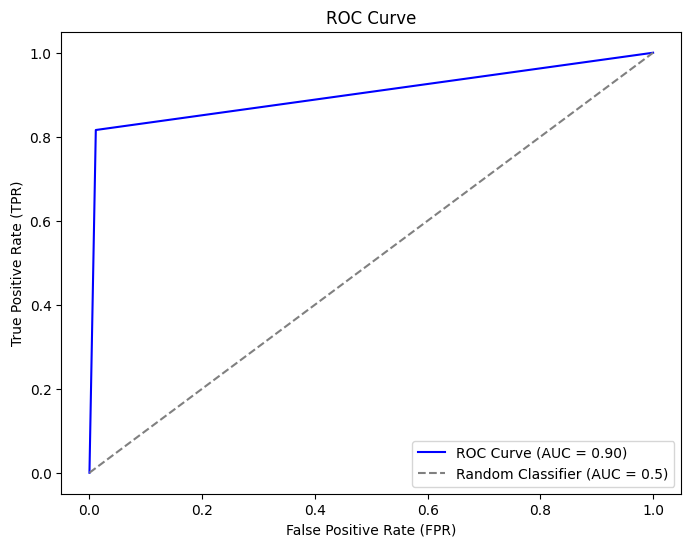

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_xgb)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})", color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve")
plt.legend(loc='lower right')
plt.show()

## XG Boost algorithms Hyper Parameter Tuning :

In [ ]:
params_xgb={'n_estimators':list(range(1,15)),
           'max_depth':list(range(1,15)),
           'learning_rate':[1.0,2.0,3.0,4.0,5.0]
           }

In [ ]:
grid_xgb=RandomizedSearchCV(xgb,params_xgb,verbose=1,cv=5,scoring='f1')
grid_xgb.fit(x_train_smote,y_train_smote)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   param_distributions={'learning_rate': [1.0, 2.0, 3.0, 4.0,
                                                          5.0],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14],
                                        'n_estimators': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10, 11, 12, 13,
                                                         14]},
                   scoring='f1', verbose=1)

In [ ]:
grid_xgb.best_params_

{'n_estimators': 10, 'max_depth': 9, 'learning_rate': 1.0}

## Insights :
* This parameters are not give the best f1_score.so we have manually give the some parameters

In [129]:
xgb_hyper=XGBClassifier(n_estimators=25,max_depth=25,learning_rate=1.0)
xgb_hyper.fit(x_train_smote,y_train_smote)

## hyper parameter best params did not give best f1_score, so  i will give manually n_estimators=25,max_depth=25.so f1_score is 83%.

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=25, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=25, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [130]:
y_pred_xgb_hyper=xgb_hyper.predict(X_test)
y_pred_xgb_hyper

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,

In [161]:
f1_xgb_hyper=f1_score(y_test,y_pred_xgb_hyper)
print(f'f1_xgb_hyper -',f1_xgb_hyper)

f1_xgb_hyper - 0.8278688524590164


In [159]:
accuracy_xgb_test_hyper=accuracy_score(y_test,y_pred_xgb_hyper)
print(f'accuracy_xgb_test_hyper',accuracy_xgb_test_hyper)

accuracy_xgb_test_hyper 0.9545454545454546


In [158]:
roc_auc_xgb_hyper=roc_auc_score(y_test,y_pred_xgb_hyper)
print(f'roc_auc_xgb_hyper -',roc_auc_xgb_hyper)

roc_auc_xgb_hyper - 0.8927359198998749


In [ ]:
pd.crosstab(y_test,y_pred_xgb_hyper)

col_0,0,1
Churn,,
0.0,781,18
1.0,24,101


In [ ]:
print(classification_report(y_test,y_pred_xgb_hyper))

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97       799
         1.0       0.85      0.81      0.83       125

    accuracy                           0.95       924
   macro avg       0.91      0.89      0.90       924
weighted avg       0.95      0.95      0.95       924



### Interpreting the Metrics XGBoost - hyper tuning:
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.98 → 98% of actual Class A instances are correctly identified.
* Precision (Class B): 0.85 → 85% of predictions for Class B are correct.
* Recall (Class B): 0.81 → 81% of actual Class B instances are correctly identified.

## Decision Tree Algorithms :

In [157]:
decision=DecisionTreeClassifier(random_state=42)
de=decision.fit(x_train_smote,y_train_smote)
de

DecisionTreeClassifier(random_state=42)

In [148]:
y_pred_decision=de.predict(X_test)
print(y_pred_decision)

[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.
 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.

In [155]:
f1_decision=f1_score(y_test,y_pred_decision)
print(f'f1_decision -',f1_decision)

f1_decision - 0.7025089605734767


In [153]:
roc_auc_decision=roc_auc_score(y_test,y_pred_decision)
print(f'roc_auc_decision - ',roc_auc_decision)

roc_auc_decision -  0.8569561952440551


In [ ]:
print(classification_report(y_test,y_pred_decision))

              precision    recall  f1-score   support

         0.0       0.96      0.93      0.95       799
         1.0       0.64      0.78      0.70       125

    accuracy                           0.91       924
   macro avg       0.80      0.86      0.82       924
weighted avg       0.92      0.91      0.91       924



### Interpreting the Metrics Decision tree :
* Precision (Class A): 0.96 → 96% of predictions for Class A are correct.
* Recall (Class A): 0.93 → 93% of actual Class A instances are correctly identified.
* Precision (Class B): 0.64 → 64% of predictions for Class B are correct.
* Recall (Class B): 0.78 → 78% of actual Class B instances are correctly identified.

In [ ]:
pd.crosstab(y_test,y_pred_decision)

col_0,0.0,1.0
Churn,,
0.0,743,56
1.0,27,98


In [152]:
accuracy_decision_test=accuracy_score(y_test,y_pred_decision)
print(f'accuracy_decision_test - ',accuracy_decision_test)

accuracy_decision_test -  0.9101731601731602


## Decision tree train dataset accuracy score :

In [145]:
y_pred_decision_train=de.predict(x_train_smote)
print(y_pred_decision_train)

[1. 0. 0. ... 1. 1. 1.]


In [197]:
accuracy_decision_train=accuracy_score(y_train_smote,y_pred_decision_train)
print(f'accuracy_decision_train -',accuracy_decision_train)

accuracy_decision_train - 1.0


## Decision Tree Hyper Parameter Tuning :

In [ ]:
params_decision={'criterion':["gini", "entropy", "log_loss"],
                 'splitter':['best','random'],
                'max_depth':list(range(1,15)),
                'min_samples_leaf':list(range(1,15))
                }


In [ ]:
grid_decision=RandomizedSearchCV(decision, params_decision,verbose=1,cv=3,scoring='f1')
grid_decision.fit(x_train_smote,y_train_smote)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42),
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14],
                                        'splitter': ['best', 'random']},
                   scoring='f1', verbose=1)

In [ ]:
grid_decision.best_params_

{'splitter': 'best',
 'min_samples_leaf': 3,
 'max_depth': 8,
 'criterion': 'entropy'}

In [199]:
decision_hyper=DecisionTreeClassifier(splitter='best',min_samples_leaf=3,max_depth=8,criterion='entropy',random_state=42)
decision_hyper.fit(x_train_smote,y_train_smote)



DecisionTreeClassifier(criterion='entropy', max_depth=8, min_samples_leaf=3,
                       random_state=42)

In [200]:
y_pred_decision_hyper=decision_hyper.predict(X_test)
y_pred_decision_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [201]:
f1_decision_hyper=f1_score(y_test,y_pred_decision_hyper)
print(f'f1_decision_hyper -',f1_decision_hyper)

f1_decision_hyper - 0.8015873015873016


In [202]:
accuracy_decision_hyper_test=accuracy_score(y_test,y_pred_decision_hyper)
print(f'accuracy_decision_hyper_test -',accuracy_decision_hyper_test)

accuracy_decision_hyper_test - 0.9458874458874459


In [203]:
roc_auc_decision_hyper=roc_auc_score(y_test,y_pred_decision_hyper)
print(f'roc_auc_decision_hyper -',roc_auc_decision_hyper)

roc_auc_decision_hyper - 0.887729662077597


In [ ]:
pd.crosstab(y_test,y_pred_decision_hyper)

col_0,0.0,1.0
Churn,,
0.0,773,26
1.0,24,101


In [ ]:
print(classification_report(y_test,y_pred_decision_hyper))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       799
         1.0       0.80      0.81      0.80       125

    accuracy                           0.95       924
   macro avg       0.88      0.89      0.89       924
weighted avg       0.95      0.95      0.95       924



### Interpreting the Metrics Decision tree - hyper tuning:
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.97 → 97% of actual Class A instances are correctly identified.
* Precision (Class B): 0.80 → 80% of predictions for Class B are correct.
* Recall (Class B): 0.81 → 81% of actual Class B instances are correctly identified.

## Bagging Classifier :

In [220]:
from sklearn.ensemble import BaggingClassifier

In [221]:
bagg=BaggingClassifier(random_state=42)
bag=bagg.fit(poly_x_train,y_train_smote)
bag

BaggingClassifier(random_state=42)

In [222]:
y_pred_bag=bag.predict(poly_x_test)
y_pred_bag

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [223]:
f1_bagging=f1_score(y_test,y_pred_bag)
print(f'f1_bagging -',f1_bagging)

f1_bagging - 0.7936507936507937


In [224]:
roc_auc_bagging=roc_auc_score(y_test,y_pred_bag)
print(f'roc_auc_bagging -',roc_auc_bagging)

roc_auc_bagging - 0.8831038798498123


In [225]:
print(classification_report(y_test,y_pred_bag))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       799
         1.0       0.79      0.80      0.79       125

    accuracy                           0.94       924
   macro avg       0.88      0.88      0.88       924
weighted avg       0.94      0.94      0.94       924



### Interpreting the Metrics Bagging :
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.97 → 97% of actual Class A instances are correctly identified.
* Precision (Class B): 0.79 → 79% of predictions for Class B are correct.
* Recall (Class B): 0.80 → 80% of actual Class B instances are correctly identified.

In [226]:
pd.crosstab(y_test,y_pred_bag)

col_0,0.0,1.0
Churn,,
0.0,772,27
1.0,25,100


In [227]:
accuracy_bagging_test=accuracy_score(y_test,y_pred_bag)
print(f'accuracy_bagging_test -',accuracy_bagging_test)

accuracy_bagging_test - 0.9437229437229437


## Bagging Classifier train datasets accuracy score :

In [229]:
y_pred_bagging_train=bag.predict(poly_x_train)
y_pred_bagging_train

array([1., 0., 0., ..., 1., 1., 1.])

In [231]:
accuracy_bagging_train=accuracy_score(y_train_smote,y_pred_bagging_train)
print(f'accuracy_bagging_train -',accuracy_bagging_train)

accuracy_bagging_train - 0.9962049335863378


## Bagging Hyper Parameter Tuning :

In [ ]:
params_bag={'n_estimators':list(range(1,15)),
           'warm_start':[True,False]
           }

In [ ]:
grid_bag=RandomizedSearchCV(bagg,params_bag,verbose=1,cv=3,scoring='f1')
grid_bag.fit(x_train_smote,y_train_smote)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=BaggingClassifier(random_state=42),
                   param_distributions={'n_estimators': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10, 11, 12, 13,
                                                         14],
                                        'warm_start': [True, False]},
                   scoring='f1', verbose=1)

In [ ]:
grid_bag.best_params_

{'warm_start': False, 'n_estimators': 13}

In [232]:
bagging_hyper=BaggingClassifier(warm_start=False,n_estimators=13,random_state=42)
bagging_hyper.fit(poly_x_train,y_train_smote)

BaggingClassifier(n_estimators=13, random_state=42)

In [233]:
y_pred_bagging_hyper=bagging_hyper.predict(poly_x_test)
y_pred_bagging_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [234]:
f1_bagging_hyper=f1_score(y_test,y_pred_bagging_hyper)
print(f'f1_bagging_hyper -',f1_bagging_hyper)

f1_bagging_hyper - 0.7968749999999999


In [235]:
accuracy_bagging_hyper_test=accuracy_score(y_test,y_pred_bagging_hyper)
print(f'accuracy_bagging_hyper_test -',accuracy_bagging_hyper_test)

accuracy_bagging_hyper_test - 0.9437229437229437


In [236]:
roc_auc_bagging_hyper=roc_auc_score(y_test,y_pred_bagging_hyper)
print(f'roc_auc_bagging_hyper -',roc_auc_bagging_hyper)

roc_auc_bagging_hyper - 0.8898523153942427


In [237]:
pd.crosstab(y_test,y_pred_bagging_hyper)

col_0,0.0,1.0
Churn,,
0.0,770,29
1.0,23,102


In [238]:
print(classification_report(y_test,y_pred_bagging_hyper))

              precision    recall  f1-score   support

         0.0       0.97      0.96      0.97       799
         1.0       0.78      0.82      0.80       125

    accuracy                           0.94       924
   macro avg       0.87      0.89      0.88       924
weighted avg       0.94      0.94      0.94       924



### Interpreting the Metrics Bagging - hyper tuning:
* Precision (Class A): 0.97 → 97% of predictions for Class A are correct.
* Recall (Class A): 0.96 → 96% of actual Class A instances are correctly identified.
* Precision (Class B): 0.78 → 78% of predictions for Class B are correct.
* Recall (Class B): 0.82 → 82% of actual Class B instances are correctly identified.

## MLP Classifier :

In [204]:
from sklearn.neural_network import MLPClassifier

In [213]:
mlp=MLPClassifier(random_state=42)
mlp_1=mlp.fit(x_train_smote,y_train_smote)
mlp_1

MLPClassifier(random_state=42)

In [214]:
y_pred_mlp=mlp_1.predict(X_test)
y_pred_mlp

array([0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 1., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [215]:
f1_MLPClassifier=f1_score(y_test,y_pred_mlp)
print(f'f1_MLPClassifier -',f1_MLPClassifier)

f1_MLPClassifier - 0.6761565836298933


In [216]:
roc_auc_MLPClassifier=roc_auc_score(y_test,y_pred_mlp)
print(f'roc_auc_MLPClassifier -',roc_auc_MLPClassifier)

roc_auc_MLPClassifier - 0.8418272841051314


In [217]:
print(classification_report(y_test,y_pred_mlp))

              precision    recall  f1-score   support

         0.0       0.96      0.92      0.94       799
         1.0       0.61      0.76      0.68       125

    accuracy                           0.90       924
   macro avg       0.78      0.84      0.81       924
weighted avg       0.91      0.90      0.91       924



### Interpreting the Metrics MLPClassifier :
* Precision (Class A): 0.96 → 96% of predictions for Class A are correct.
* Recall (Class A): 0.92 → 92% of actual Class A instances are correctly identified.
* Precision (Class B): 0.61 → 61% of predictions for Class B are correct.
* Recall (Class B): 0.76 → 76% of actual Class B instances are correctly identified.

In [218]:
pd.crosstab(y_test,y_pred_mlp)

col_0,0.0,1.0
Churn,,
0.0,738,61
1.0,30,95


In [219]:
accuarcy_MLPClassifier_test=accuracy_score(y_test,y_pred_mlp)
print(f'accuarcy_MLPClassifier_test -',accuarcy_MLPClassifier_test)

accuarcy_MLPClassifier_test - 0.9015151515151515


## MLP Classifier train data accuracy:

In [224]:
y_pred_mlp_train=mlp_1.predict(x_train_smote)
y_pred_mlp_train

array([1., 0., 0., ..., 1., 1., 1.])

In [225]:
accuracy_MLPClassifier_train=accuracy_score(y_train_smote,y_pred_mlp_train,)
print(f'accuracy_MLPClassifier_train -',accuracy_MLPClassifier_train)

accuracy_MLPClassifier_train - 0.9593611638203668


## MLP Classifier Hyper Parameter Tuning :

In [ ]:
params_mlp={'hidden_layer_sizes':((100,3),(150,3),(200,3)),
           'activation':['identity', 'logistic', 'tanh', 'relu'],
           'solver':['lbfgs', 'sgd', 'adam'],
           'learning_rate':['constant', 'invscaling', 'adaptive'],
           'batch_size':[200,300,100,150]
            }

In [ ]:
grid_mlp=RandomizedSearchCV(mlp,params_mlp,verbose=1,cv=3,scoring='f1')
grid_mlp.fit(x_train_smote,y_train_smote)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=MLPClassifier(random_state=42),
                   param_distributions={'activation': ['identity', 'logistic',
                                                       'tanh', 'relu'],
                                        'batch_size': [200, 300, 100, 150],
                                        'hidden_layer_sizes': ((100, 3),
                                                               (150, 3),
                                                               (200, 3)),
                                        'learning_rate': ['constant',
                                                          'invscaling',
                                                          'adaptive'],
                                        'solver': ['lbfgs', 'sgd', 'adam']},
                   scoring='f1', verbose=1)

In [ ]:
grid_mlp.best_params_

{'solver': 'lbfgs',
 'learning_rate': 'constant',
 'hidden_layer_sizes': (100, 3),
 'batch_size': 200,
 'activation': 'logistic'}

## Insights :
* This parameters are not give the best f1_score.so we have manually give the some parameters

In [226]:
mlp_hyper=MLPClassifier(solver='adam',learning_rate='constant',hidden_layer_sizes=(100,3),activation='relu',batch_size=200,random_state=42)
mlp_hyper.fit(x_train_smote,y_train_smote)

MLPClassifier(batch_size=200, hidden_layer_sizes=(100, 3), random_state=42)

In [227]:
y_pred_mlp_hyper=mlp_hyper.predict(X_test)
y_pred_mlp_hyper

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [228]:
f1_MLPClassifier_hyper=f1_score(y_test,y_pred_mlp_hyper)
print(f'f1_MLPClassifier_hyper -',f1_MLPClassifier_hyper)

f1_MLPClassifier_hyper - 0.6615384615384615


In [229]:
accuracy_MLPClassifier_hyper_test=accuracy_score(y_test,y_pred_mlp_hyper)
print(f'accuracy_MLPClassifier_hyper_test -',accuracy_MLPClassifier_hyper_test)

accuracy_MLPClassifier_hyper_test - 0.9047619047619048


In [230]:
roc_auc_MLPClassifier_hyper=roc_auc_score(y_test,y_pred_mlp_hyper)
print(f'roc_auc_MLPClassifier_hyper -',roc_auc_MLPClassifier_hyper)

roc_auc_MLPClassifier_hyper - 0.8133366708385482


In [ ]:
pd.crosstab(y_test,y_pred_mlp_hyper)

col_0,0.0,1.0
Churn,,
0.0,750,49
1.0,39,86


In [ ]:
print(classification_report(y_test,y_pred_mlp_hyper))

              precision    recall  f1-score   support

         0.0       0.95      0.94      0.94       799
         1.0       0.64      0.69      0.66       125

    accuracy                           0.90       924
   macro avg       0.79      0.81      0.80       924
weighted avg       0.91      0.90      0.91       924



### Interpreting the Metrics MLPClasifier - hyper tuning:
* Precision (Class A): 0.95 → 95% of predictions for Class A are correct.
* Recall (Class A): 0.94 → 94% of actual Class A instances are correctly identified.
* Precision (Class B): 0.64 → 64% of predictions for Class B are correct.
* Recall (Class B): 0.69 → 69% of actual Class B instances are correctly identified.

# Comparision of all model f1_scores :

In [109]:
scores={'f1_svc_hyper':52.65,'f1_logistic':59,'f1_svc':55,'f1_logistic_hyper':65,'f1_MLPClassifier_hyper':66.15,\
        'f1_MLPClassifier':67.61,'f1_decision':70.25,'f1_bagging':79,'f1_bagging_hyper':80,\
        'f1_decision_hyper':80.15,'f1_gradient':80.16,'f1_random_hyper':80.48,'f1_random':80.65,\
        'f1_xgb_hyper':82.78,'f1_gradient_hyper':85.71,'f1_xgb':86.44
        }
scores_keys=scores.keys()
scores_values=scores.values()

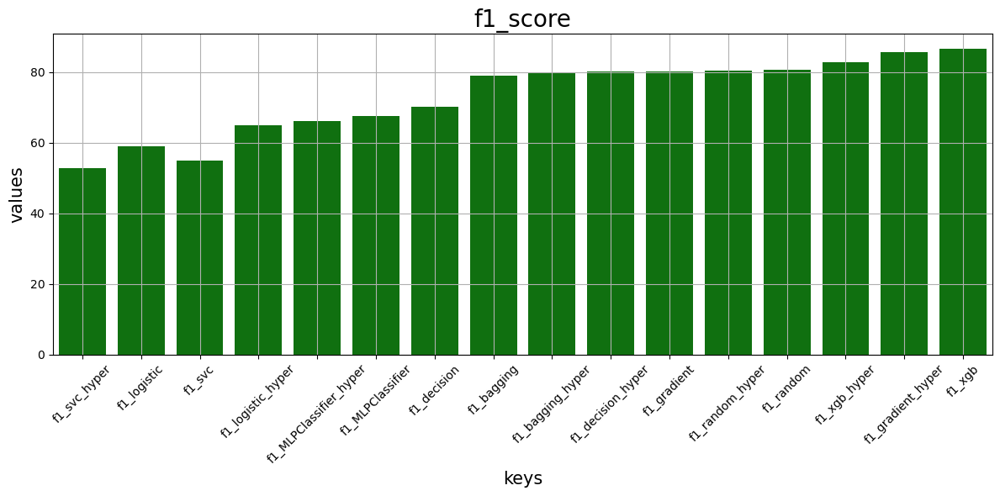

In [111]:
plt.figure(figsize=(12,6))
sns.barplot(x=scores_keys,y=scores_values,color='#008000')
plt.xlabel('keys',fontsize=15)
plt.ylabel('values',fontsize=15)
plt.title('f1_score',fontsize=20)
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()

## Insights :
* XGBoost is a better f1_score 86%
* Support vector machine(SVC) models lowest performance of this datasets

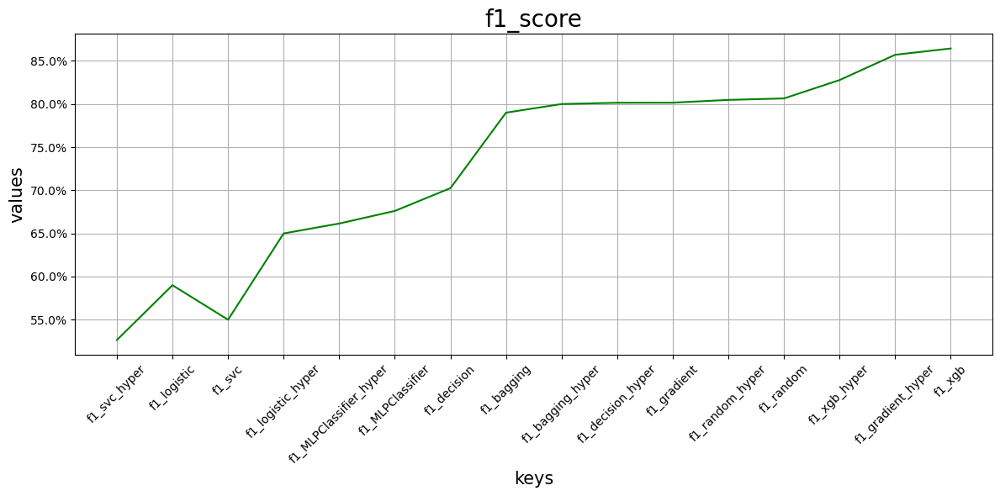

In [114]:
plt.figure(figsize=(12,6))
sns.lineplot(x=scores_keys,y=scores_values,color='#008000')
plt.xlabel('keys',fontsize=15)
plt.ylabel('values',fontsize=15)
plt.title('f1_score',fontsize=20)
plt.xticks(rotation=45)
plt.grid()
plt.gca().yaxis.set_major_formatter(PercentFormatter()) ## Percentformatter to use y_axis convert to Percentage.
plt.tight_layout()
plt.show()

## Conclusion :
* In Churn Telecom datasets for best model is XGBoost Classfier .a f1_score 86%.
* We have use SMOTE methods.balance the class labels.
* And then balanced the precision and recall in every models.
* XGBoost Model is better performance of this datasets.
* All models are balanced the class labels precision and recall.
* XGBoost model of confusion matrix mis-classification of labels minimum comparatively other models.
* XGBoost Model to be use the Production process.